In [1]:
%matplotlib inline  
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pylab
import seaborn as sns
import glob, os
import se

/Library/Python/2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
path = r'/Users/WernerChao/Dropbox/Werner/Data_Science_Projects/kickstarter/data' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))
df_from_each_file = (pd.read_csv(f) for f in all_files)
data = pd.concat(df_from_each_file, ignore_index=True)

In [3]:
print data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45425 entries, 0 to 45424
Data columns (total 32 columns):
id                        45425 non-null int64
photo                     45425 non-null object
name                      45425 non-null object
blurb                     45419 non-null object
goal                      45425 non-null float64
pledged                   45425 non-null float64
state                     45425 non-null object
slug                      45425 non-null object
disable_communication     45425 non-null bool
country                   45425 non-null object
currency                  45425 non-null object
currency_symbol           45425 non-null object
currency_trailing_code    45425 non-null bool
deadline                  45425 non-null int64
state_changed_at          45425 non-null int64
created_at                45425 non-null int64
launched_at               45425 non-null int64
staff_pick                45425 non-null bool
backers_count             45425 non-

In [4]:
data.head(2)

,id,photo,name,blurb,goal,pledged,state,slug,disable_communication,country,...,location,category,profile,spotlight,urls,source_url,friends,is_starred,is_backing,permissions
0,1454391034,"{""small"":""https://ksr-ugc.imgix.net/assets/011...",Auntie Di's Music Time Sign ASL for Hearing an...,MTS ASL Curriculum Workbook is a reproducible ...,1500.0,0.0,failed,auntie-dis-music-time-sign-asl-for-hearing-and...,False,US,...,"{""country"":""US"",""urls"":{""web"":{""discover"":""htt...","{""urls"":{""web"":{""discover"":""http://www.kicksta...","{""background_image_opacity"":0.8,""should_show_f...",False,"{""web"":{""project"":""https://www.kickstarter.com...",https://www.kickstarter.com/discover/categorie...,NaN,NaN,NaN,NaN
1,1655206086,"{""small"":""https://ksr-ugc.imgix.net/assets/012...",Jump Start Kindergarten Toolkit,"This kit teaches how to print, correct an ugly...",500.0,0.0,failed,jump-start-kindergarten-toolkit,False,US,...,"{""country"":""US"",""urls"":{""web"":{""discover"":""htt...","{""urls"":{""web"":{""discover"":""http://www.kicksta...","{""background_image_opacity"":0.8,""should_show_f...",False,"{""web"":{""project"":""https://www.kickstarter.com...",https://www.kickstarter.com/discover/categorie...,NaN,NaN,NaN,NaN


In [5]:
data.loc[:, 'country':'location'].head(2)

,country,currency,currency_symbol,currency_trailing_code,deadline,state_changed_at,created_at,launched_at,staff_pick,backers_count,static_usd_rate,usd_pledged,creator,location
0,US,USD,$,True,1422030900,1422030900,1417323357,1418845656,False,0,1.0,0.0,"{""urls"":{""web"":{""user"":""https://www.kickstarte...","{""country"":""US"",""urls"":{""web"":{""discover"":""htt..."
1,US,USD,$,True,1430514802,1430514804,1424446123,1425334402,False,0,1.0,0.0,"{""urls"":{""web"":{""user"":""https://www.kickstarte...","{""country"":""US"",""urls"":{""web"":{""discover"":""htt..."


# Clean the JSON format for certain columns below:

In [6]:
import json

def parse_json(cell, key):
    try:
        return str(json.loads(cell)[key])
    except UnicodeEncodeError as e:
        print e
        print cell
        return json.loads(cell)[key]
    except TypeError as e:
        print e
        print cell
        return 'na'

In [7]:
category = map(parse_json, data.iloc[:]['category'], ['name']*len(data))
print len(category)
print data['category'].shape
print category[0:5]

45425
(45425,)
['Academic', 'Academic', 'Academic', 'Academic', 'Academic']


In [8]:
cat_slug = map(parse_json, data.iloc[:]['category'], ['slug']*len(data))
for i, item in enumerate(set(cat_slug)):
    print i+1, ':', item

1 : music/hip-hop
2 : publishing/children's books
3 : music/kids
4 : theater/immersive
5 : games/video games
6 : music/pop
7 : theater/experimental
8 : music/classical music
9 : film & video/drama
10 : film & video/shorts
11 : dance/performances
12 : music/rock
13 : technology/flight
14 : technology/fabrication tools
15 : comics/comic books
16 : music/latin
17 : technology/diy electronics
18 : music/electronic music
19 : technology/space exploration
20 : technology/makerspaces
21 : theater/plays
22 : technology/web
23 : technology/3d printing
24 : music/country & folk
25 : publishing/periodicals
26 : theater/comedy
27 : technology/hardware
28 : technology/robots
29 : publishing/literary journals
30 : publishing/art books
31 : publishing/translations
32 : technology/gadgets
33 : photography/photobooks
34 : technology/sound
35 : technology/camera equipment
36 : publishing/young adult
37 : theater/spaces
38 : film & video/narrative film
39 : publishing/radio & podcasts
40 : publishing/com

In [9]:
data['cat'] = cat_slug
print len(data['cat'].unique())
data['cat'].unique()

60


array(['publishing/academic', 'photography/places',
       'music/electronic music', 'music/country & folk',
       'music/classical music', 'music/blues', 'games/video games',
       'food/restaurants', 'film & video/webseries',
       'film & video/thrillers', 'film & video/shorts',
       'film & video/narrative film', 'technology/web', 'technology/apps',
       'technology/gadgets', 'technology/hardware', 'theater/festivals',
       'theater/plays', 'theater/musical', 'technology/flight',
       'technology/diy electronics', 'theater/spaces', 'theater/immersive',
       'theater/experimental', 'theater/comedy', 'technology/wearables',
       'technology/space exploration', 'technology/sound',
       'technology/software', 'technology/robots',
       'technology/makerspaces', 'technology/fabrication tools',
       'technology/camera equipment', 'publishing/young adult',
       'publishing/periodicals', 'publishing/fiction',
       "publishing/children's books", 'technology/3d printi

In [10]:
locations = map(parse_json, data.iloc[:]['location'], ['name']*len(data))
print len(locations)
data['location'] = locations
print data['location'].shape

'ascii' codec can't encode character u'\xf6' in position 3: ordinal not in range(128)
{"country":"SE","urls":{"web":{"discover":"https://www.kickstarter.com/discover/places/nykoping-se","location":"https://www.kickstarter.com/locations/nykoping-se"},"api":{"nearby_projects":"https://api.kickstarter.com/v1/discover?signature=1487284391.b659305df1c718c3b420ef7f41449e25e4a0d7ce&woe_id=900279"}},"name":"Nyköping","displayable_name":"Nyköping, Sweden","short_name":"Nyköping, Sweden","id":900279,"state":"Sodermanland","type":"Town","is_root":false,"slug":"nykoping-se"}
expected string or buffer
nan
'ascii' codec can't encode character u'\xf3' in position 12: ordinal not in range(128)
{"country":"MX","urls":{"web":{"discover":"https://www.kickstarter.com/discover/places/ciudad-obregon-mx","location":"https://www.kickstarter.com/locations/ciudad-obregon-mx"},"api":{"nearby_projects":"https://api.kickstarter.com/v1/discover?signature=1487286699.cabe963baa8a524eb9a5378d0635415992a80fc6&woe_id=11

In [11]:
data['location'].value_counts().head(100)

London              1607
New York            1567
Los Angeles         1514
San Francisco        927
Chicago              866
Portland             618
Seattle              574
Brooklyn             532
Atlanta              495
Austin               478
Toronto              471
Boston               457
San Diego            449
Washington           415
Minneapolis          380
Houston              371
Denver               355
Philadelphia         353
Dallas               332
Melbourne            320
Vancouver            286
Sydney               278
Manhattan            278
Edinburgh            257
Salt Lake City       255
Las Vegas            254
Orlando              253
Phoenix              249
Miami                248
Montreal             236
                    ... 
Jacksonville          89
Milwaukee             88
Irvine                88
Columbia              87
Hollywood             87
Colorado Springs      87
Palo Alto             87
Grand Rapids          86
Hong Kong             85


# Most Successful Categories in Each City

In [20]:
def success_cat_city_plot(city):
    plt.rcParams['figure.figsize'] = 12, 6
    
    
    # Most successful categories.
    plt.subplot(121)
    s_counts = data[(data['location'] == city) &
         (data['state'] == 'successful')]['cat'].value_counts()
    s_counts_x = range(1, len(s_counts) + 1)
    _ = plt.bar(s_counts_x, s_counts)
    _ = plt.ylabel('# of Successful/Failed Campaigns')
    _ = plt.xticks(s_counts_x, s_counts.index, rotation='vertical')
    _ = plt.title('City: {} Top Success Cat'.format(city))
    
    # Most failed categories.
    plt.subplot(122)
    f_counts = data[(data['location'] == city) &
         (data['state'] == 'failed')]['cat'].value_counts()
    f_counts_x = range(1, len(f_counts) + 1)
    _ = plt.bar(f_counts_x, f_counts, color='red')
    _ = plt.xticks(f_counts_x, f_counts.index, rotation='vertical')
    _ = plt.title('City: {} Top Failed Cat'.format(city))
    
    
    _ = plt.tight_layout()
    plt.savefig('{} Top Success vs Failed Cat'.format(city))
    plt.show()

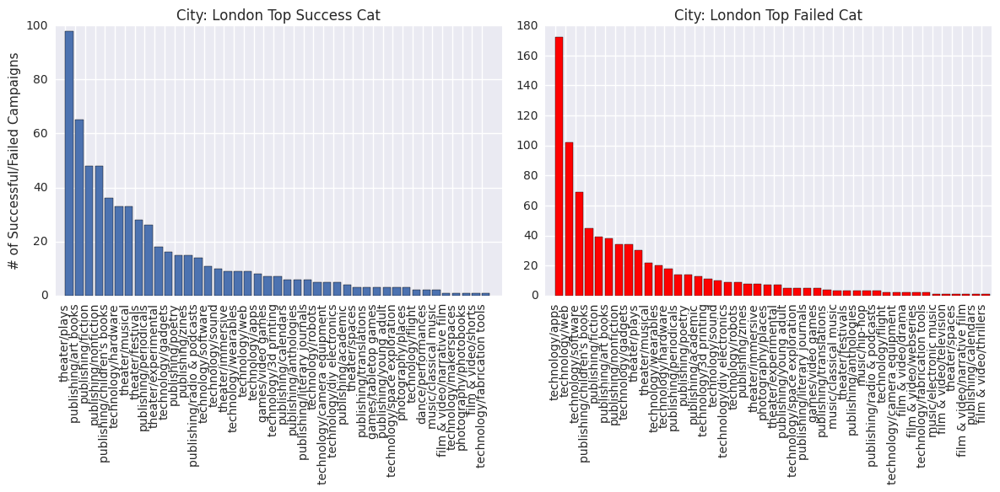

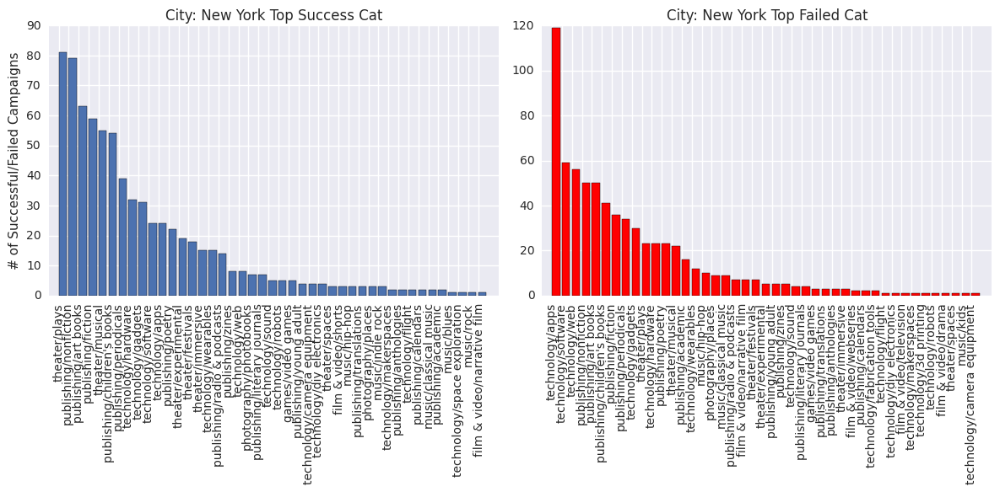

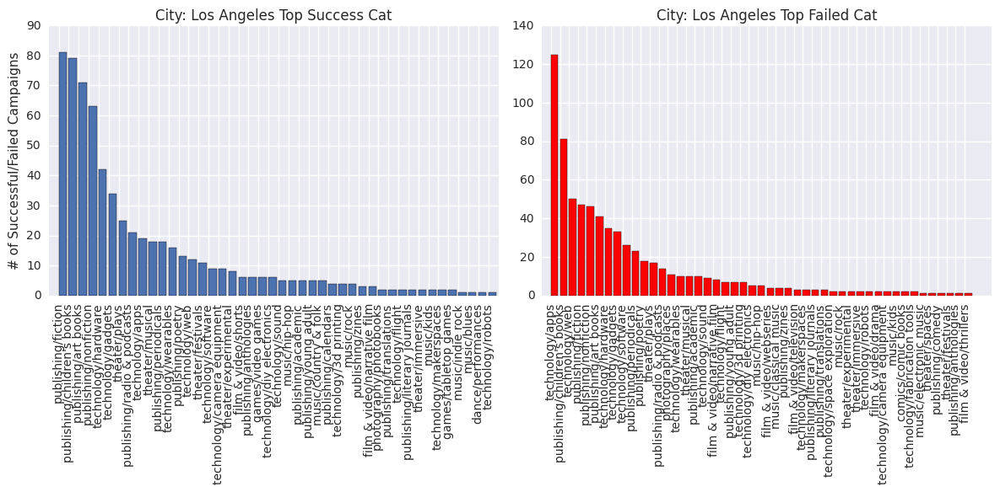

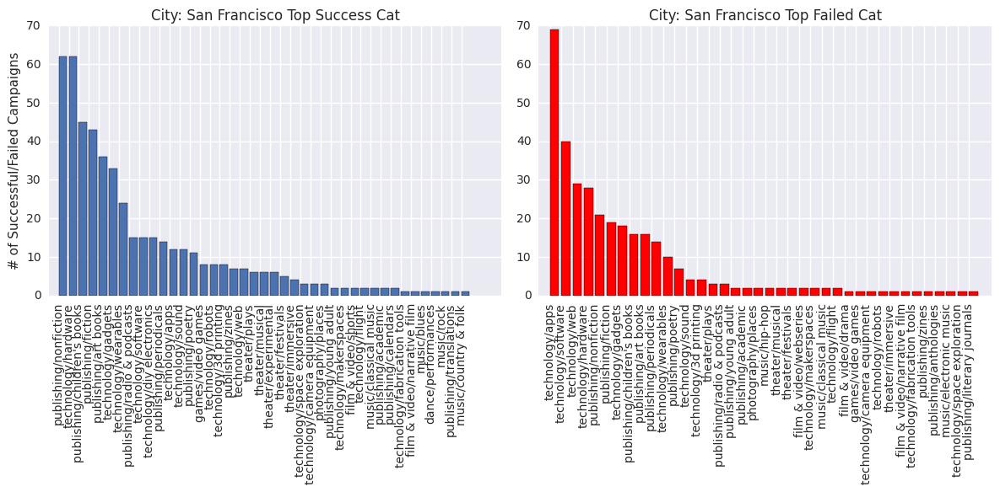

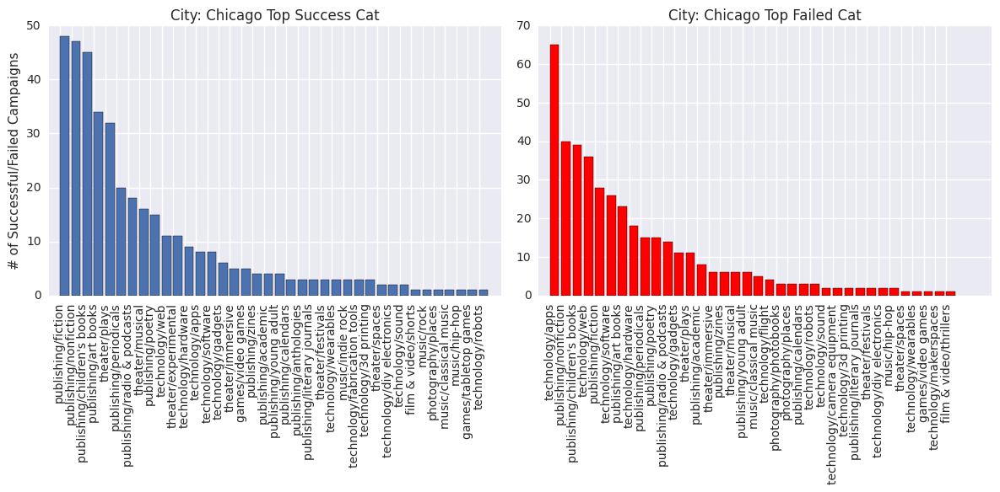

...

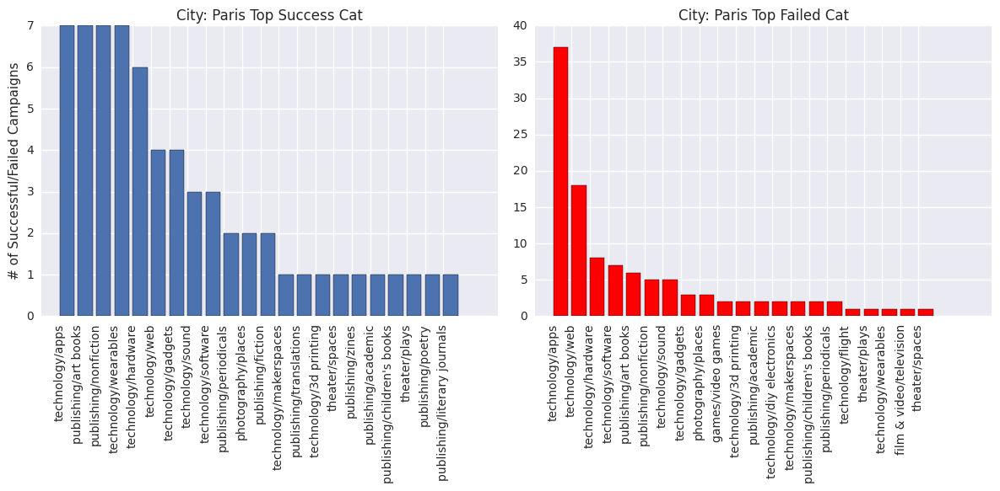

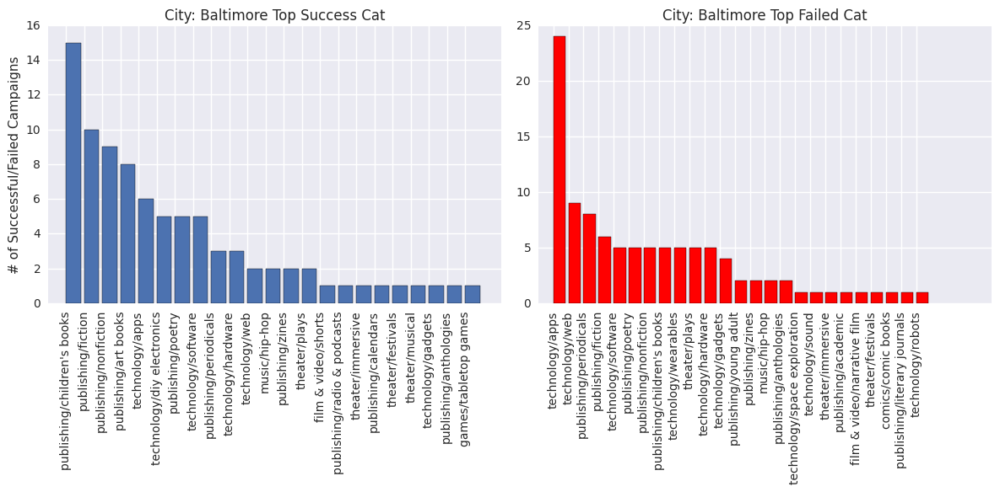

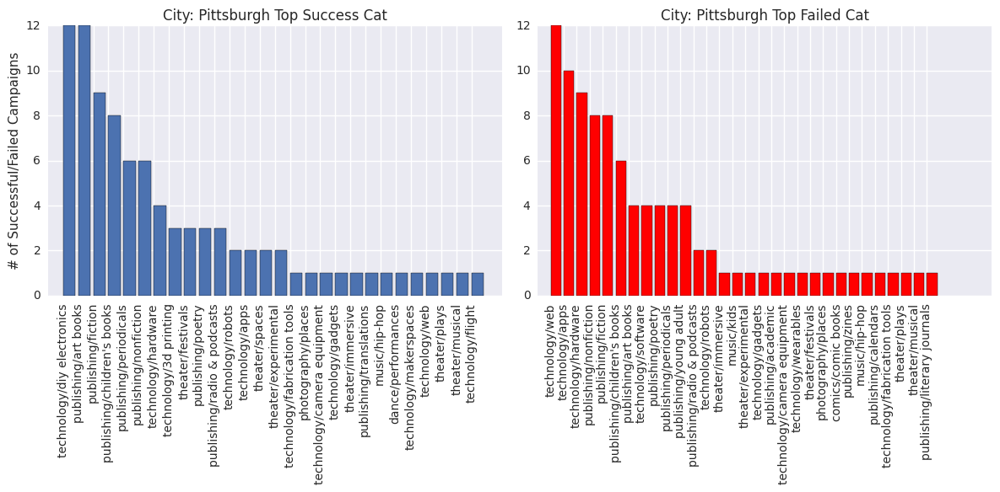

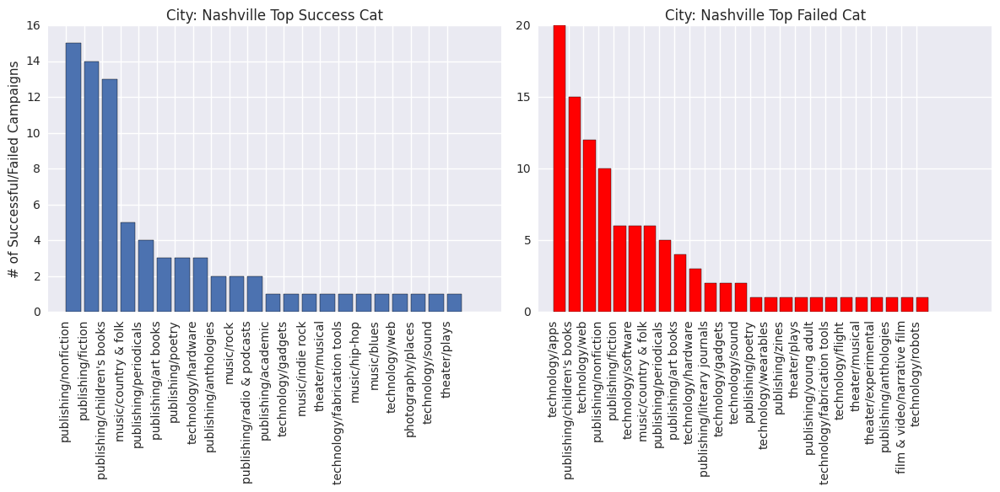

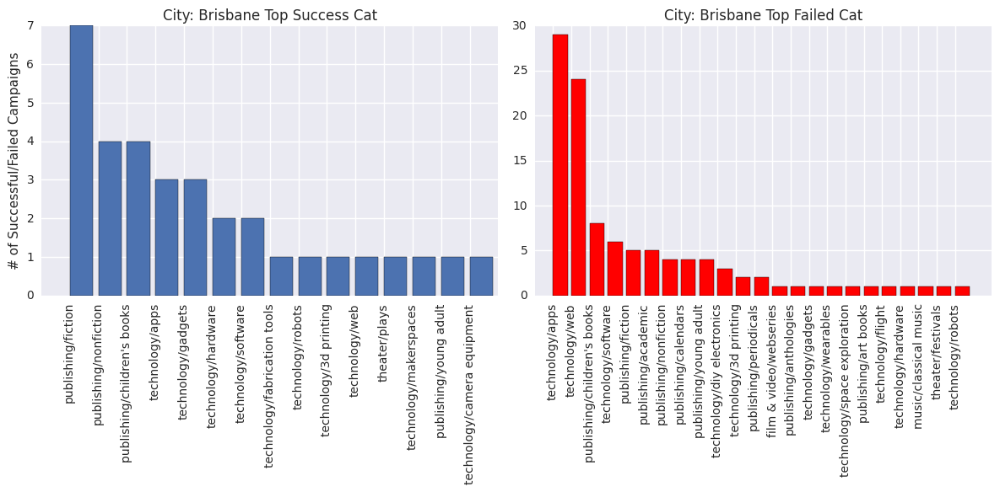

ValueError: Format " louis top success vs failed cat" is not supported.
Supported formats: eps, pdf, pgf, png, ps, raw, rgba, svg, svgz.

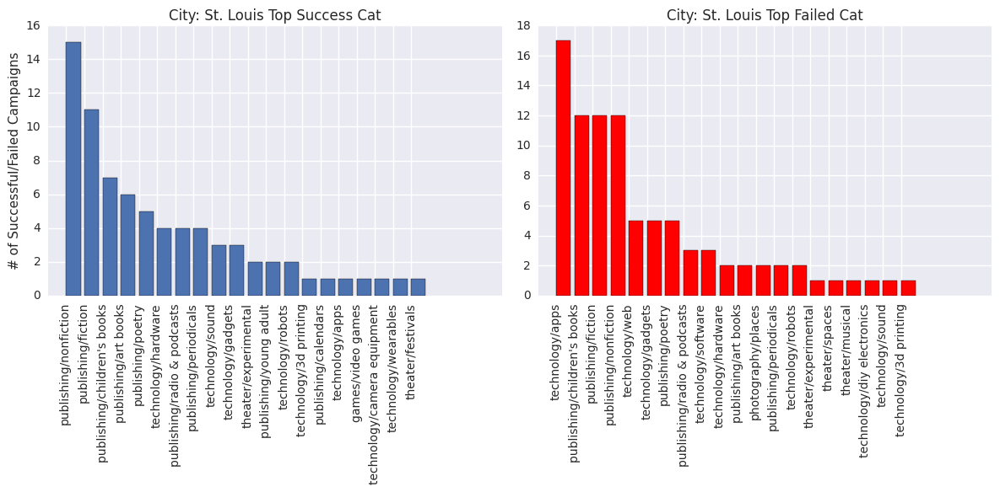

In [21]:
_ = map(success_cat_city_plot, data['location'].value_counts().head(100).index)

# Histogram of FAILED Goal & SUCCESSFUL Goal for each category

In [60]:
np.int(np.sqrt(len(data[(data['cat'] == 'publishing/academic') & (data['state'] == 'failed')])))

21

In [66]:
def goal_each_cat(category):
    print 'Category: ', category
    plt.rcParams['figure.figsize'] = 12, 6
    plt.subplot(121)

    try:
        print '# of Failed campaigns: ', len(data[(data['cat'] == category) & (data['state'] == 'failed')])
        _ = plt.hist(data[(data['cat'] == category) & (data['state'] == 'failed')]['goal'].values, label='F',
                    bins=np.int(np.sqrt(len(data[(data['cat'] == category) & (data['state'] == 'successful')]))))
    except ValueError as e:
        pass
    try:
        print '# of Successful campaigns: ', len(data[(data['cat'] == category) & (data['state'] == 'successful')])
        _ = plt.hist(data[(data['cat'] == category) & (data['state'] == 'successful')]['goal'].values, label='S',
                    bins=np.int(np.sqrt(len(data[(data['cat'] == category) & (data['state'] == 'successful')]))))
    except ValueError as e:
        pass

    _ = plt.title('Goal Histogram - Category {}'.format(category))
    _ = plt.xlabel('Goal $')
    _ = plt.ylabel('Count')
    _ = plt.legend()

    plt.subplot(122)
    x_succ = range(1, len(data[(data['cat'] == category) & (data['state'] == 'successful')]['goal'])+1)
    x_fail = range(1, len(data[(data['cat'] == category) & (data['state'] == 'failed')]['goal'])+1)
    
    _ = plt.plot(x_fail, data[(data['cat'] == category) & (data['state'] == 'failed')]['goal'].values, 'o', label='F')
    _ = plt.plot(x_succ, data[(data['cat'] == category) & (data['state'] == 'successful')]['goal'].values, 'o', label='S')
    
    ymax = max(data[(data['cat'] == category)]['goal'].values)
    _ = plt.ylim(0, ymax+0.1*ymax)
    plt.legend()
    
    
    _ = plt.tight_layout()
    category_re = re.sub('./', '_', category)
    plt.savefig('{}: Histogram of Goal'.format(category_re))
    plt.show()

Category:  publishing/academic
# of Failed campaigns:  469
# of Successful campaigns:  158


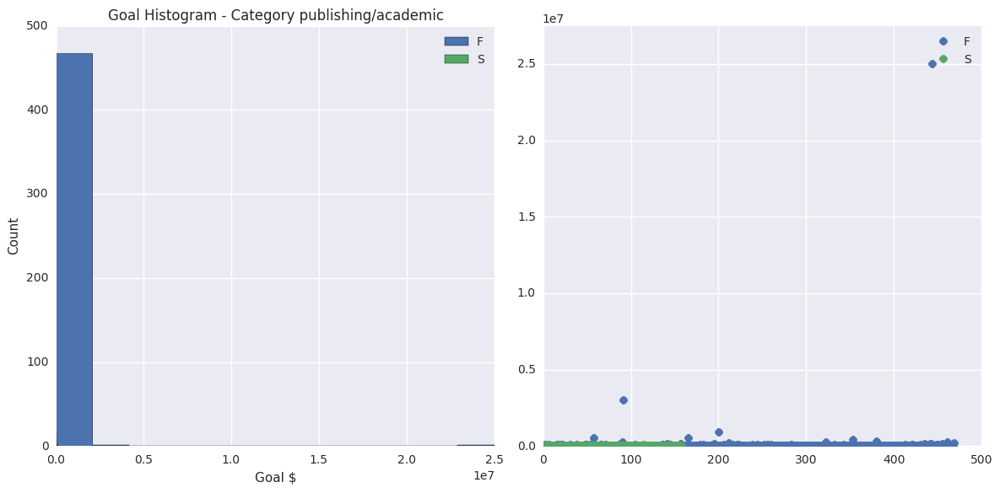

Category:  photography/places
# of Failed campaigns:  293
# of Successful campaigns:  99


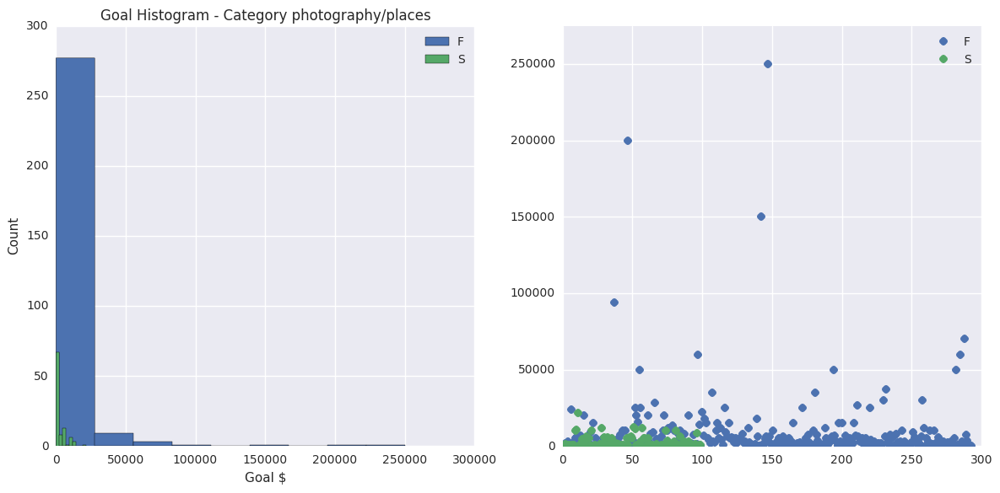

Category:  music/electronic music
# of Failed campaigns:  40
# of Successful campaigns:  0


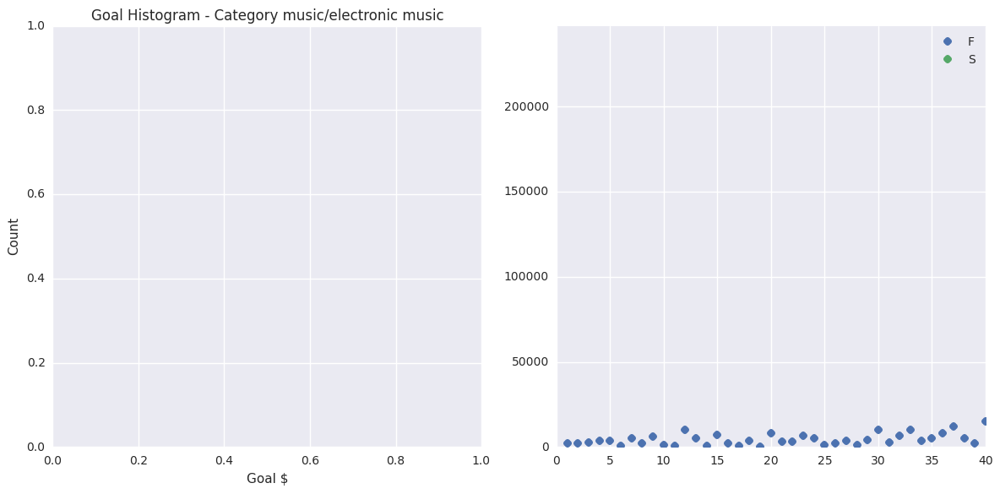

Category:  music/country & folk
# of Failed campaigns:  40
# of Successful campaigns:  40


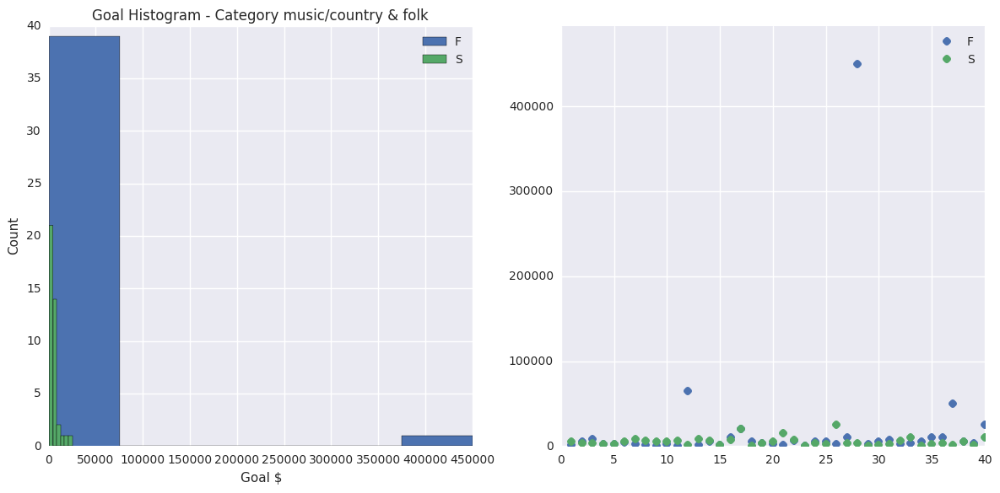

Category:  music/classical music
# of Failed campaigns:  80
# of Successful campaigns:  20


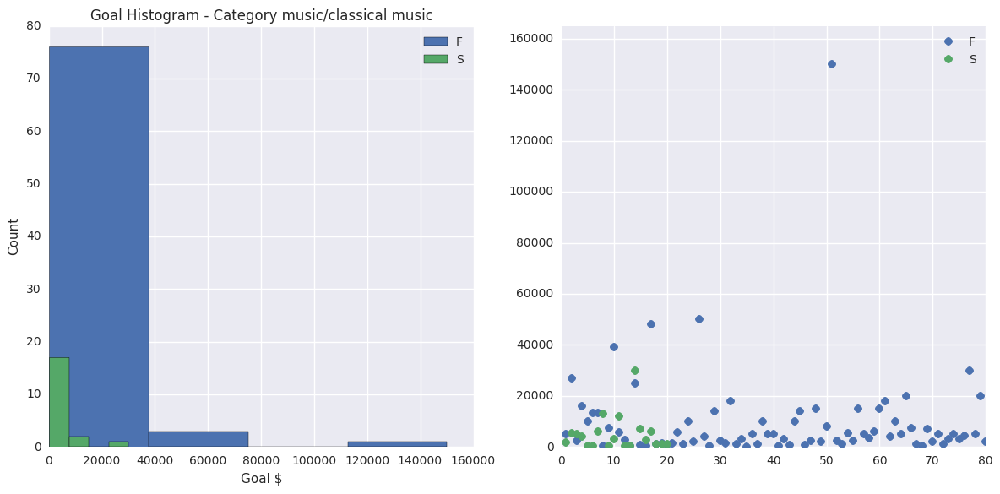

Category:  music/blues
# of Failed campaigns:  0
# of Successful campaigns:  18


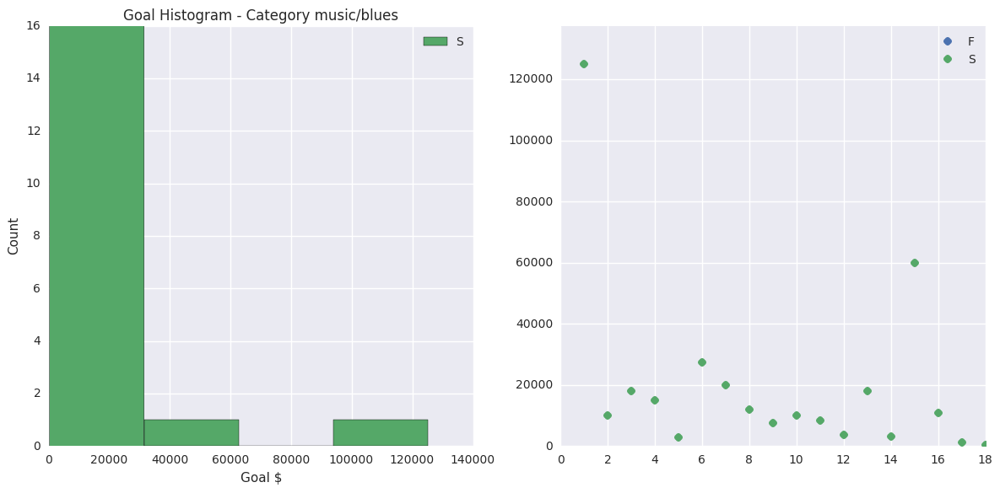

Category:  games/video games
# of Failed campaigns:  60
# of Successful campaigns:  140


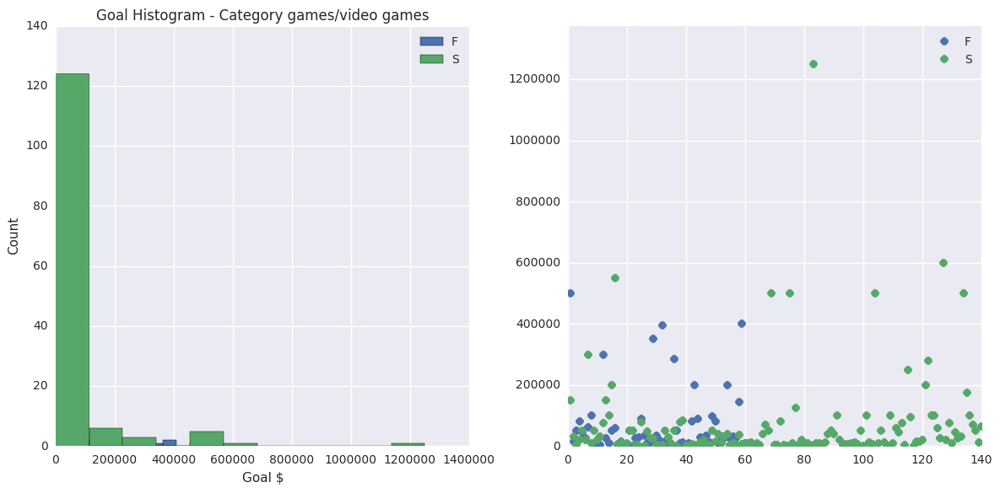

Category:  food/restaurants
# of Failed campaigns:  0
# of Successful campaigns:  0


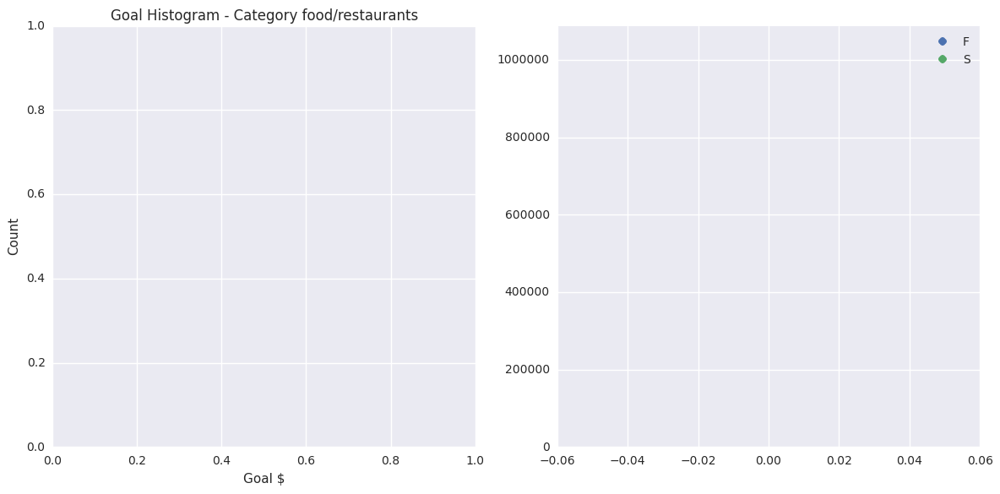

Category:  film & video/webseries
# of Failed campaigns:  20
# of Successful campaigns:  0


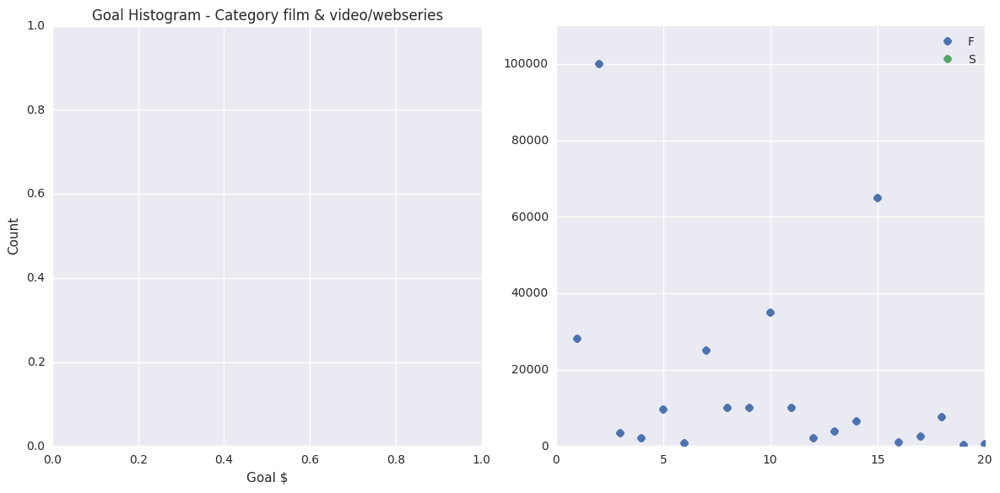

Category:  film & video/thrillers
# of Failed campaigns:  20
# of Successful campaigns:  0


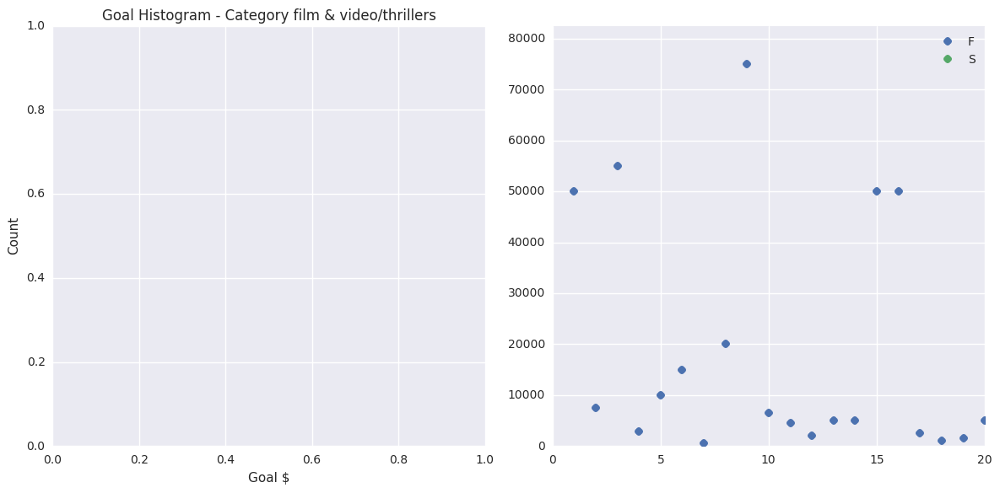

Category:  film & video/shorts
# of Failed campaigns:  0
# of Successful campaigns:  60


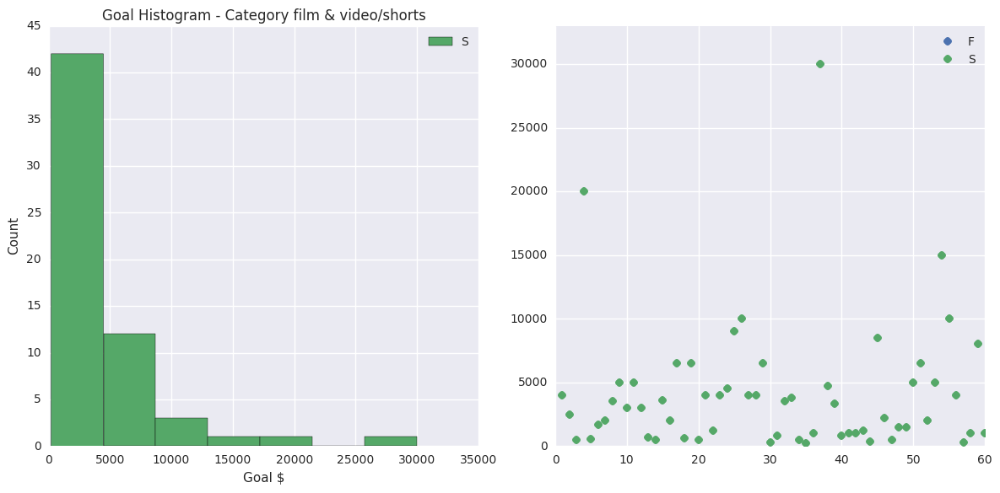

Category:  film & video/narrative film
# of Failed campaigns:  60
# of Successful campaigns:  20


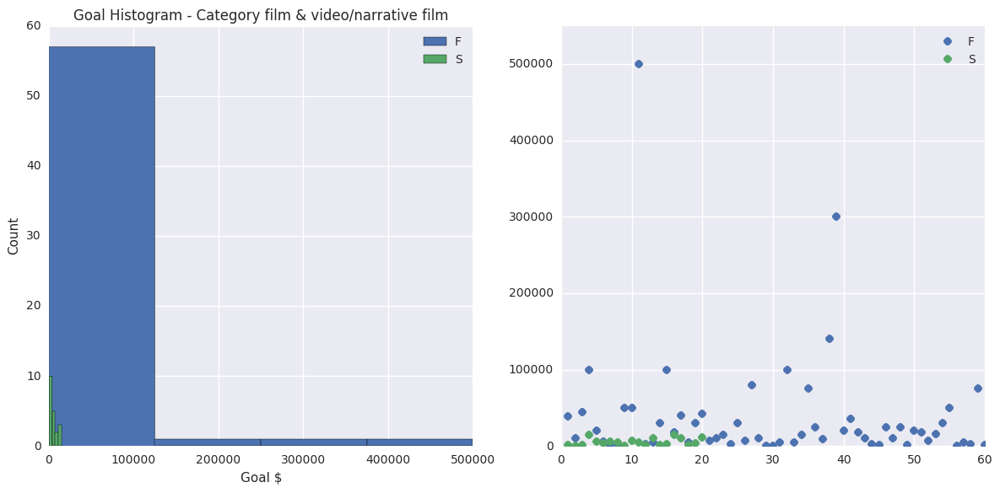

Category:  technology/web
# of Failed campaigns:  2502
# of Successful campaigns:  222


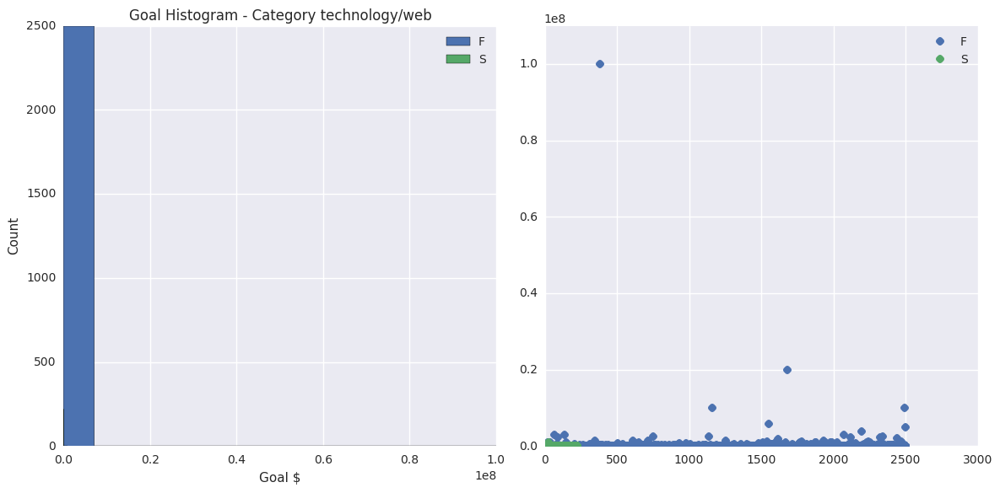

Category:  technology/apps
# of Failed campaigns:  3566
# of Successful campaigns:  310


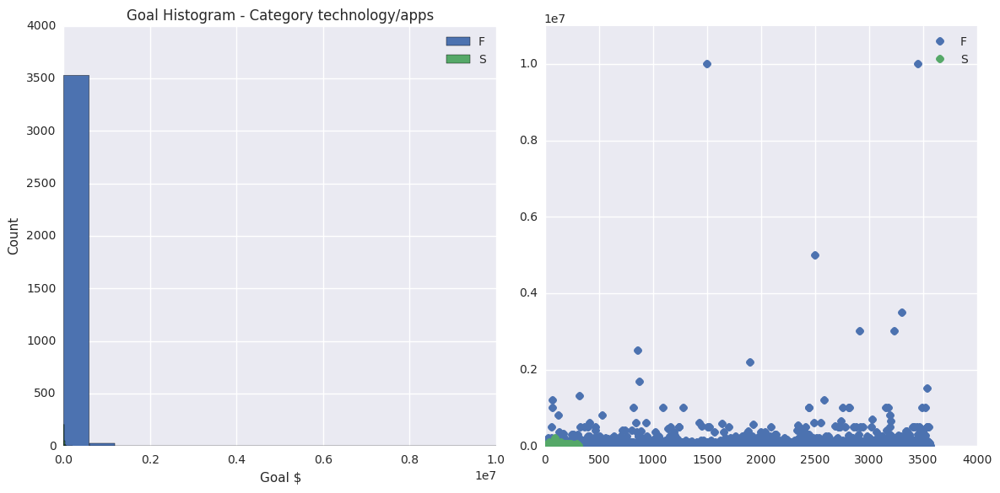

Category:  technology/gadgets
# of Failed campaigns:  1199
# of Successful campaigns:  631


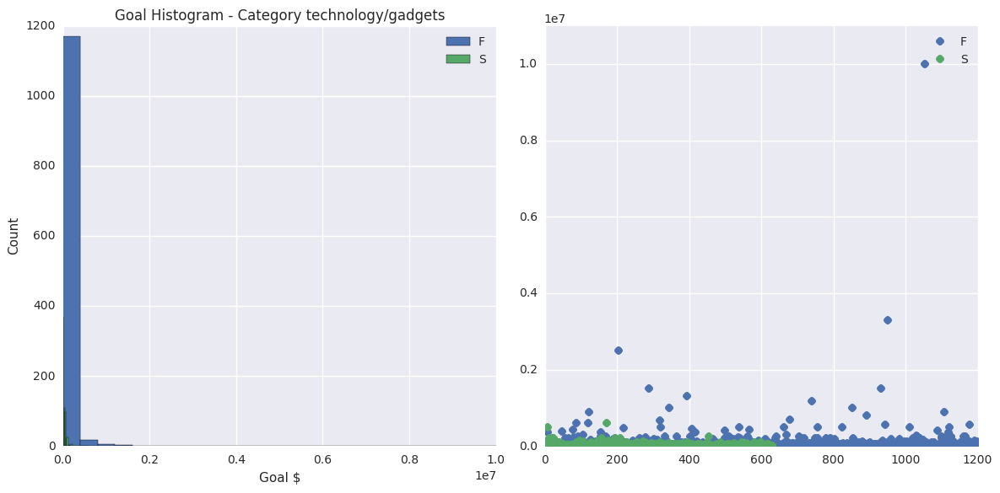

Category:  technology/hardware
# of Failed campaigns:  1669
# of Successful campaigns:  1078


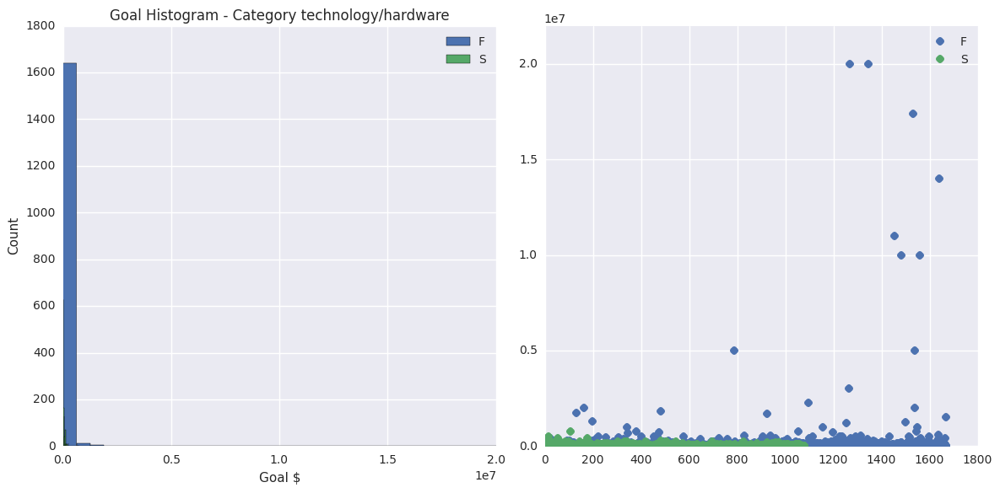

Category:  theater/festivals
# of Failed campaigns:  155
# of Successful campaigns:  291


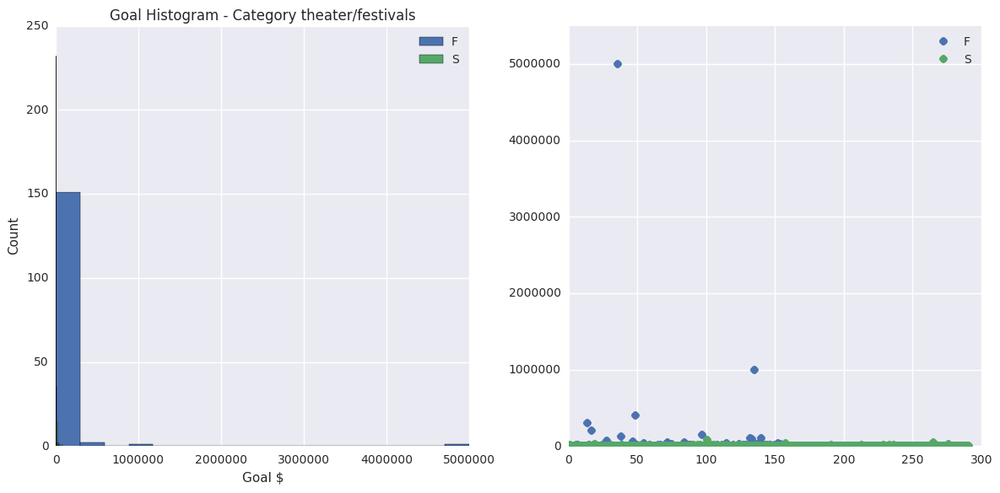

Category:  theater/plays
# of Failed campaigns:  415
# of Successful campaigns:  681


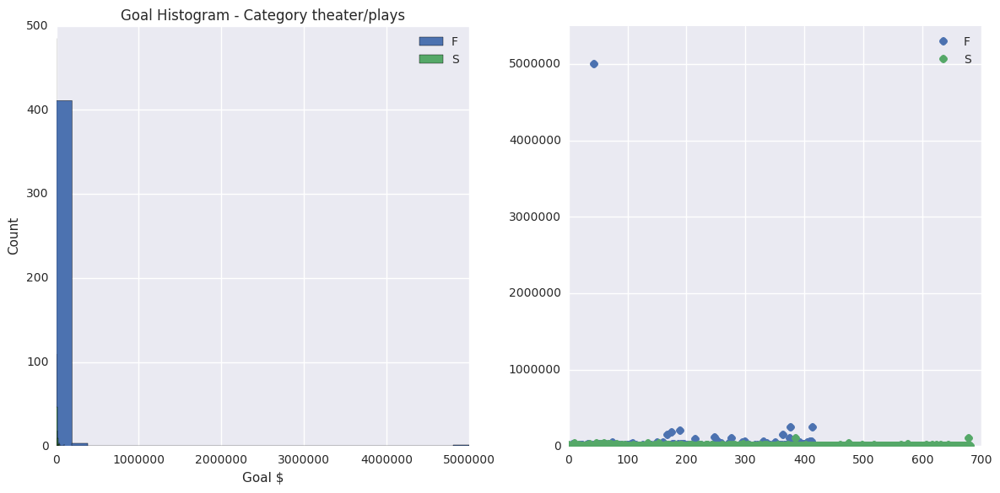

Category:  theater/musical
# of Failed campaigns:  305
# of Successful campaigns:  406


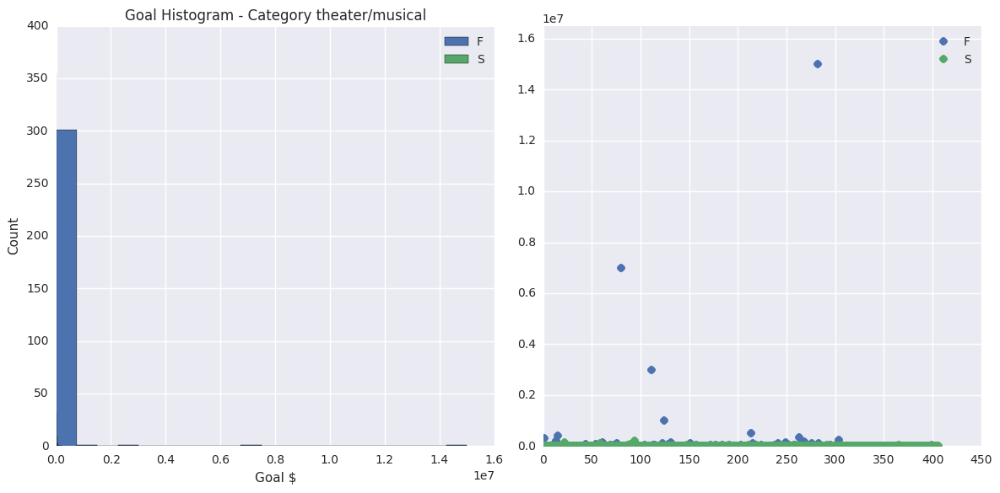

Category:  technology/flight
# of Failed campaigns:  241
# of Successful campaigns:  66


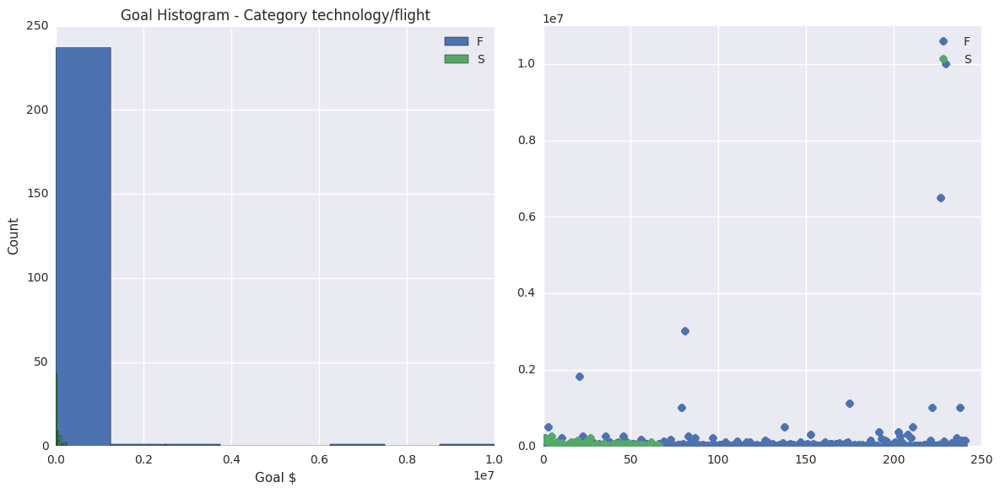

Category:  technology/diy electronics
# of Failed campaigns:  303
# of Successful campaigns:  335


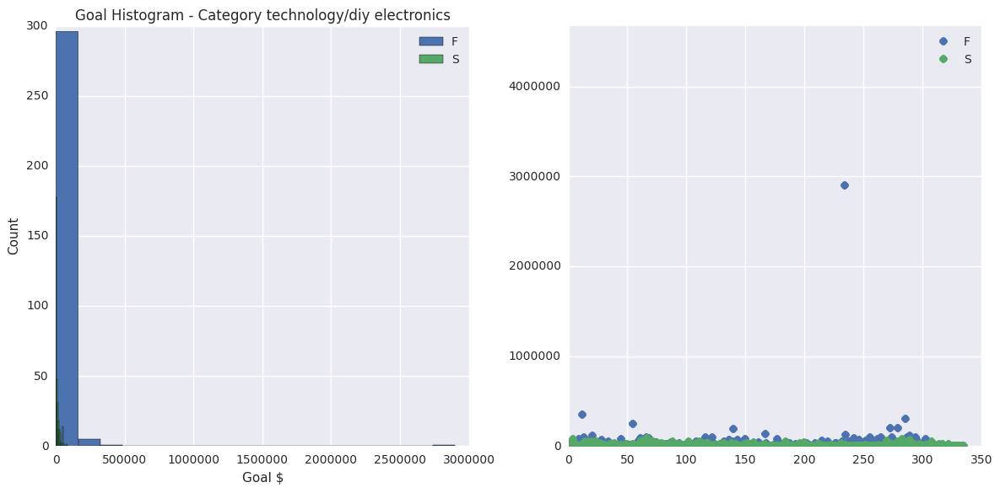

Category:  theater/spaces
# of Failed campaigns:  78
# of Successful campaigns:  82


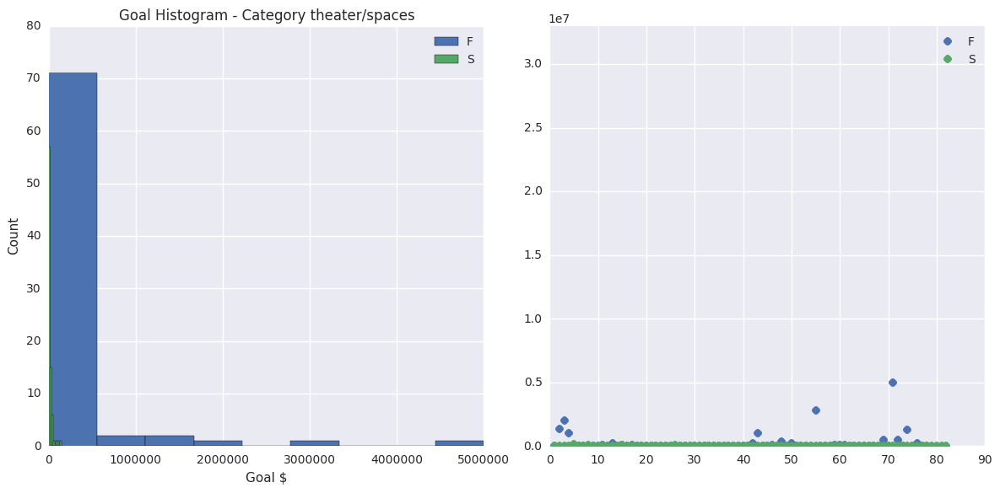

Category:  theater/immersive
# of Failed campaigns:  106
# of Successful campaigns:  140


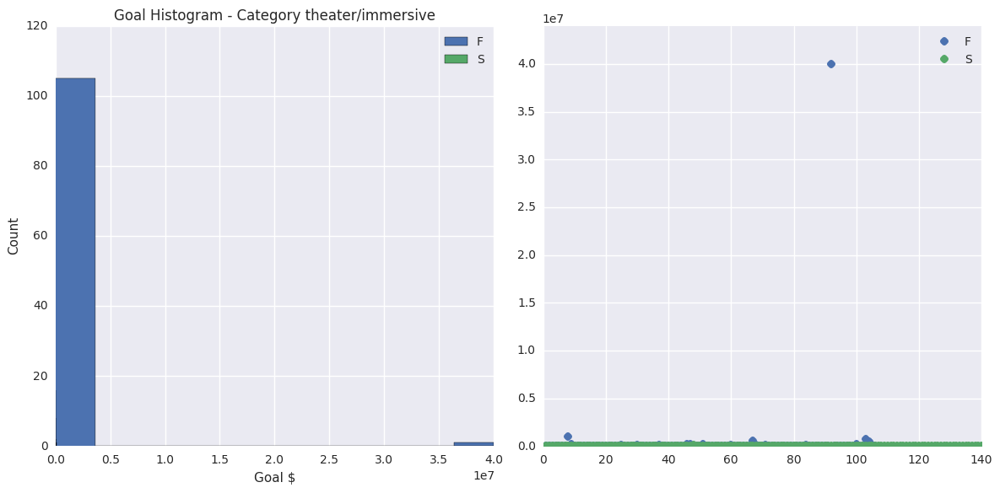

Category:  theater/experimental
# of Failed campaigns:  116
# of Successful campaigns:  177


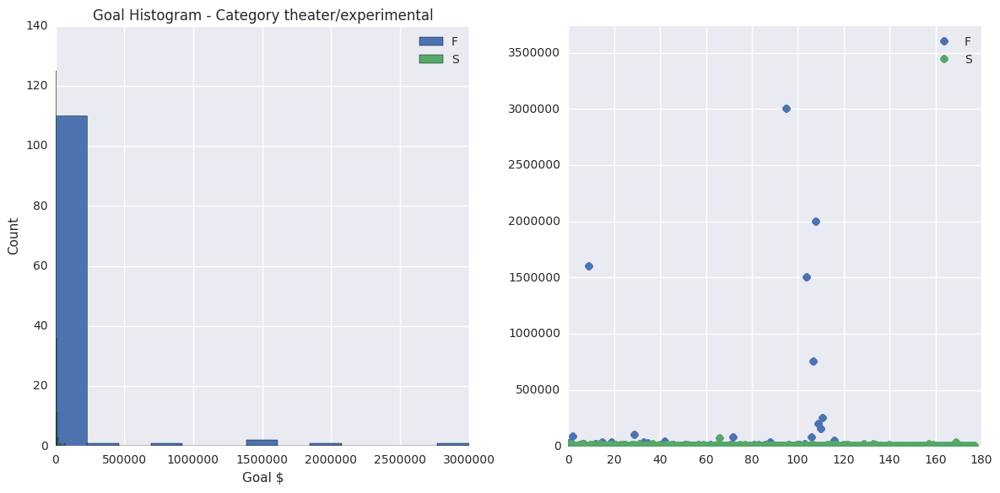

Category:  theater/comedy
# of Failed campaigns:  0
# of Successful campaigns:  1


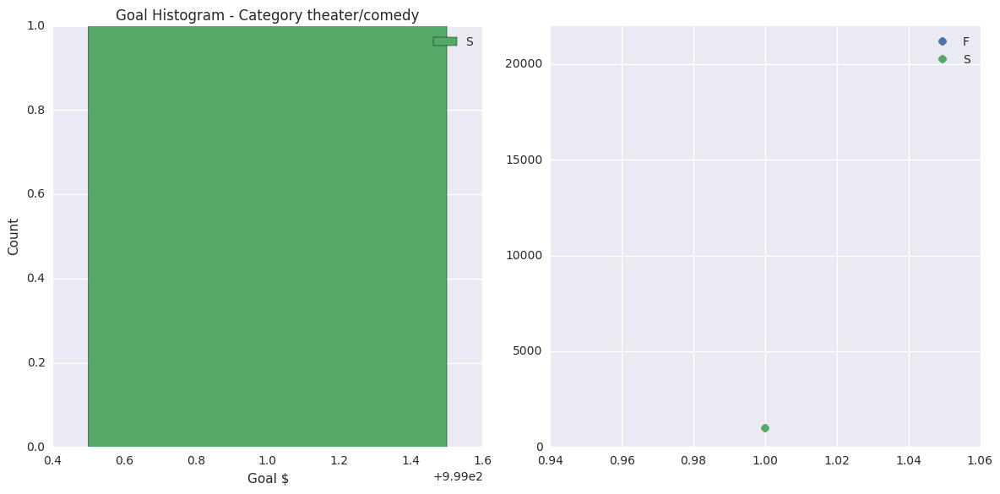

Category:  technology/wearables
# of Failed campaigns:  462
# of Successful campaigns:  289


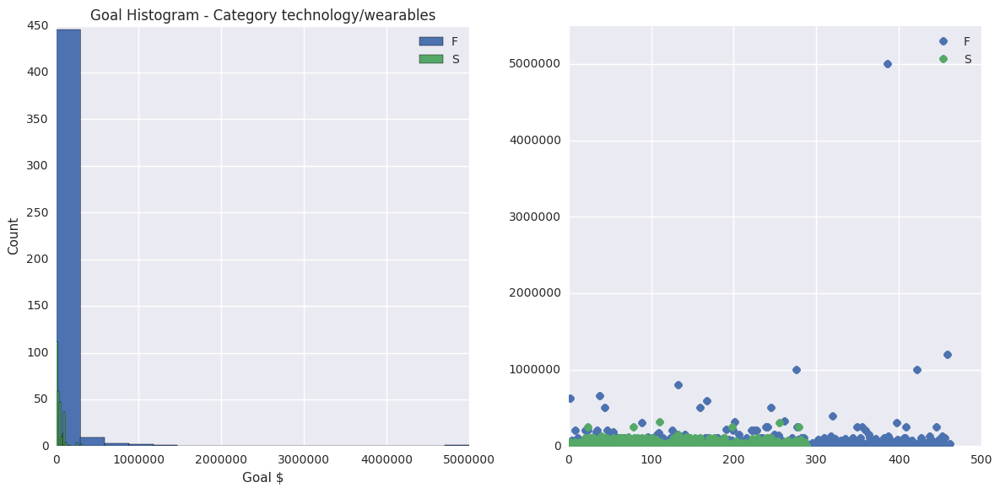

Category:  technology/space exploration
# of Failed campaigns:  134
# of Successful campaigns:  99


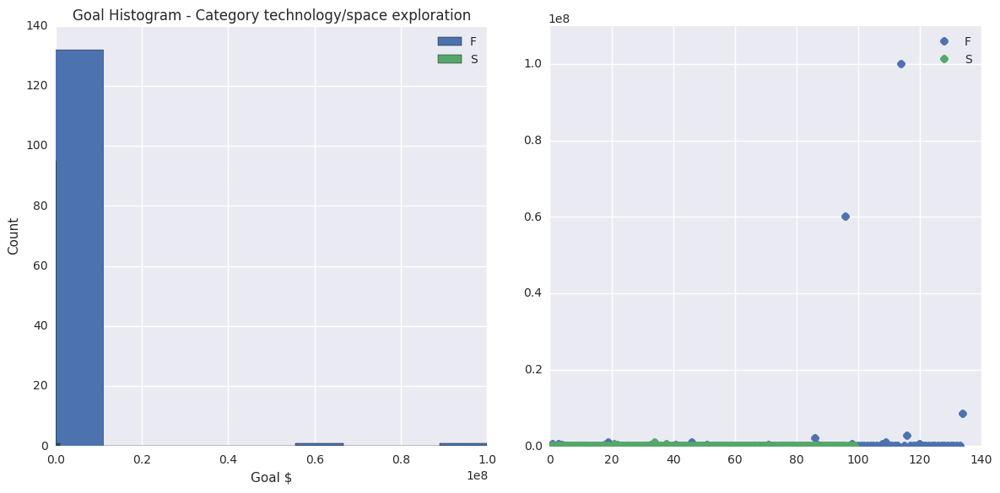

Category:  technology/sound
# of Failed campaigns:  223
# of Successful campaigns:  205


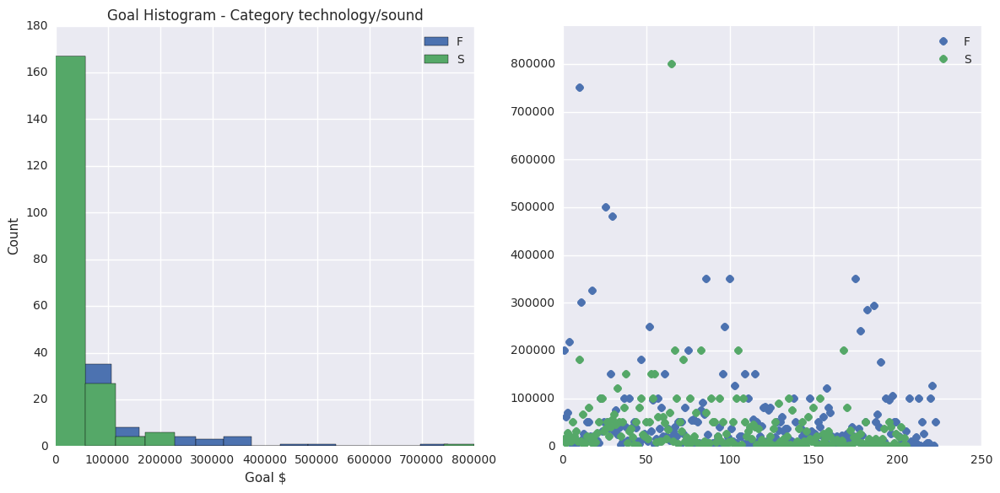

Category:  technology/software
# of Failed campaigns:  1876
# of Successful campaigns:  337


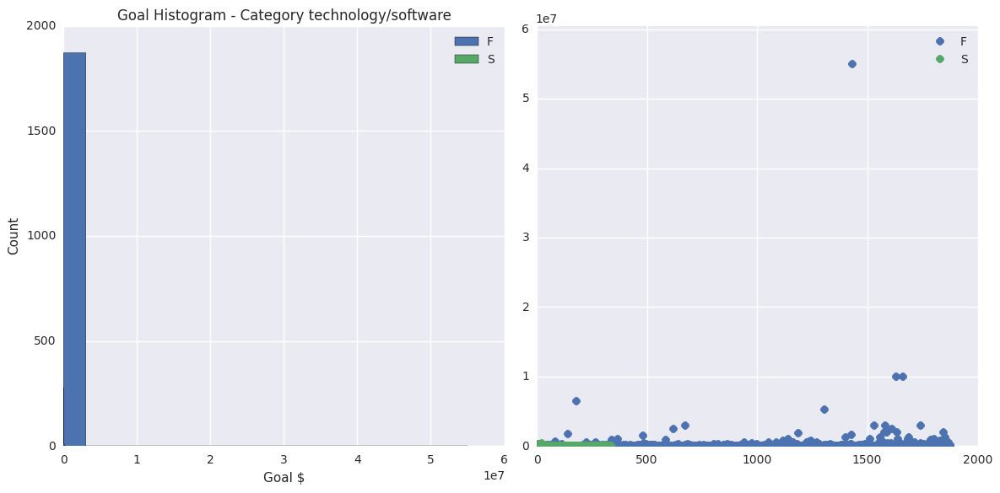

Category:  technology/robots
# of Failed campaigns:  222
# of Successful campaigns:  180


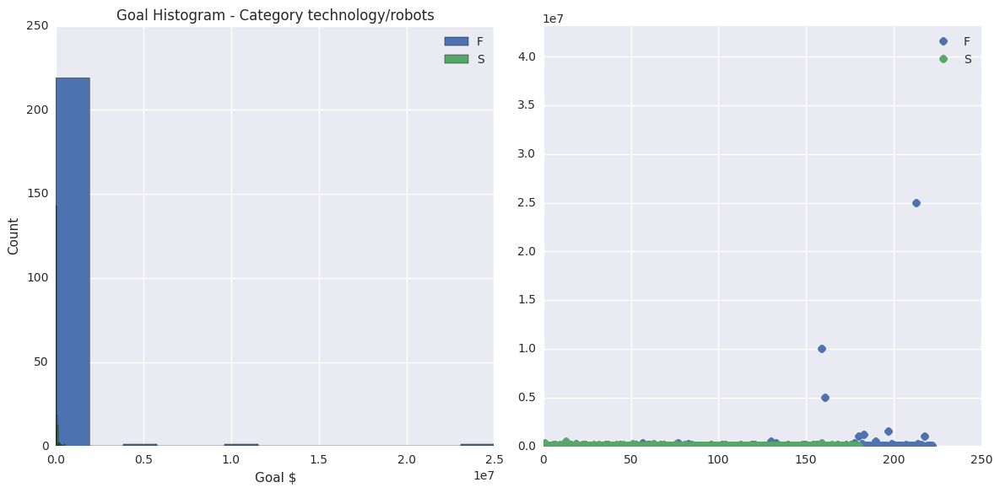

Category:  technology/makerspaces
# of Failed campaigns:  104
# of Successful campaigns:  66


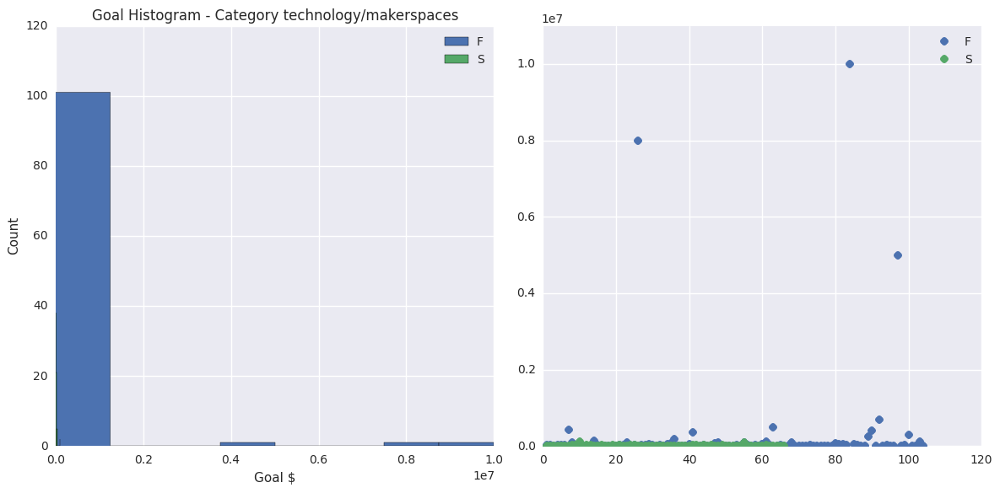

Category:  technology/fabrication tools
# of Failed campaigns:  124
# of Successful campaigns:  50


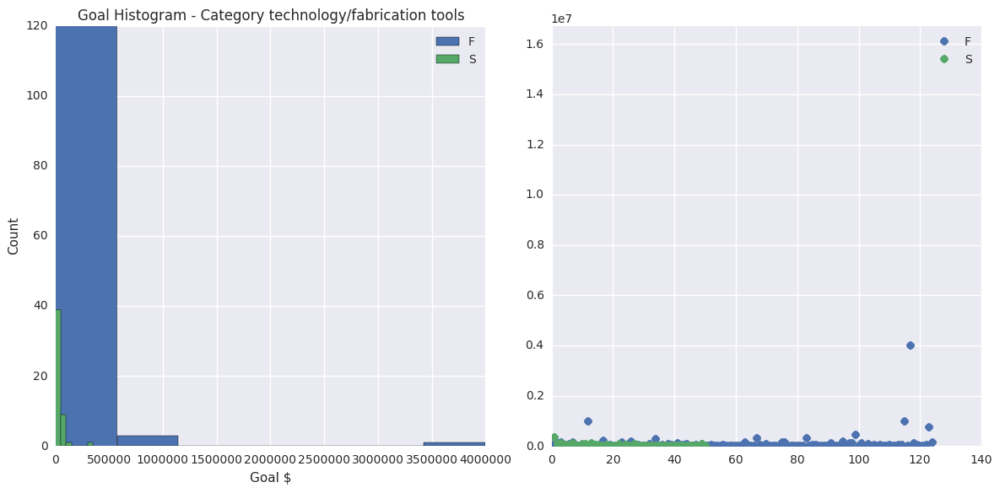

Category:  technology/camera equipment
# of Failed campaigns:  128
# of Successful campaigns:  154


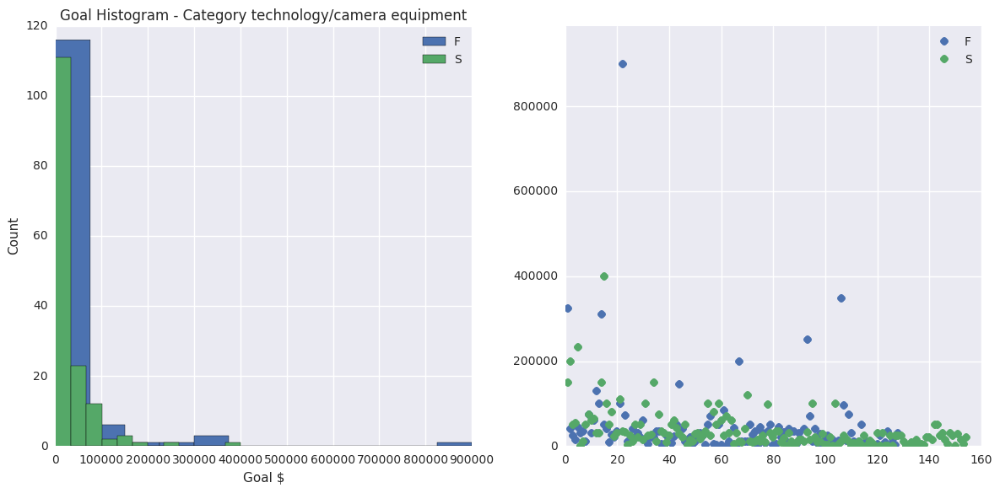

Category:  publishing/young adult
# of Failed campaigns:  445
# of Successful campaigns:  141


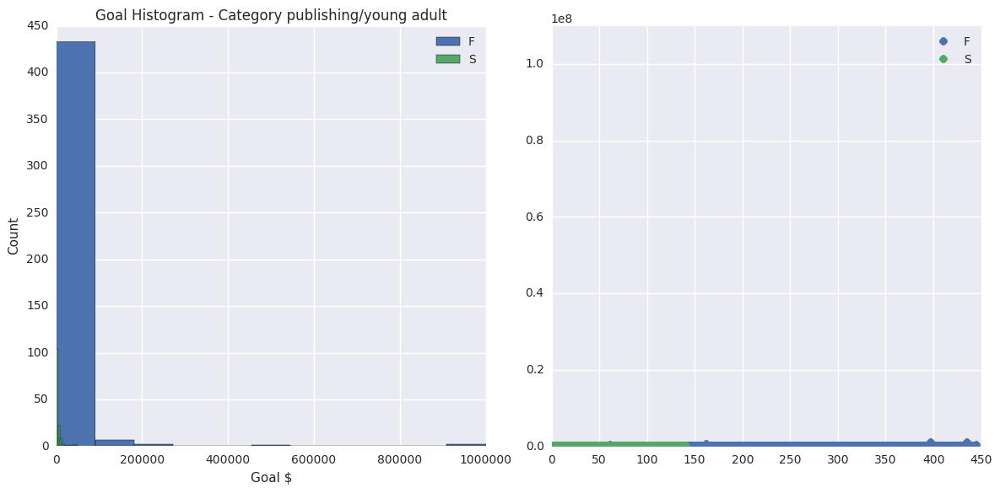

Category:  publishing/periodicals
# of Failed campaigns:  589
# of Successful campaigns:  465


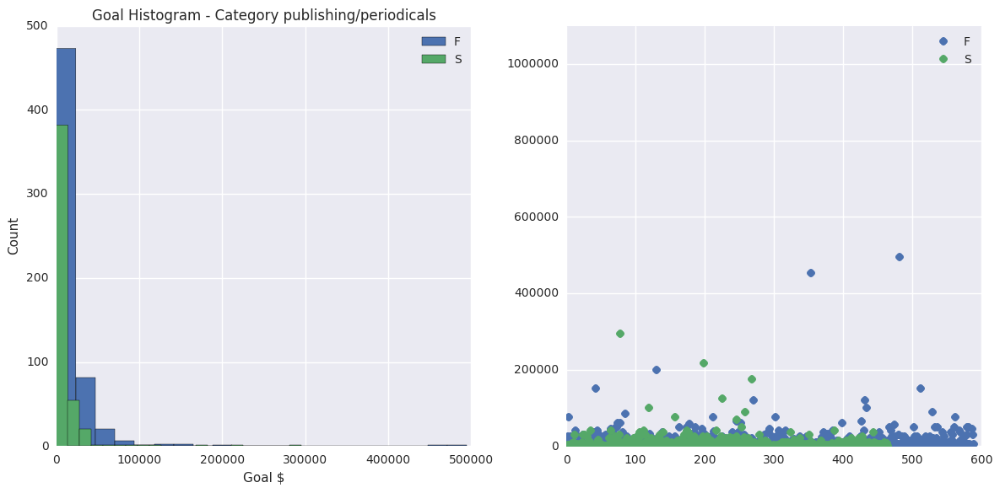

Category:  publishing/fiction
# of Failed campaigns:  1893
# of Successful campaigns:  2032


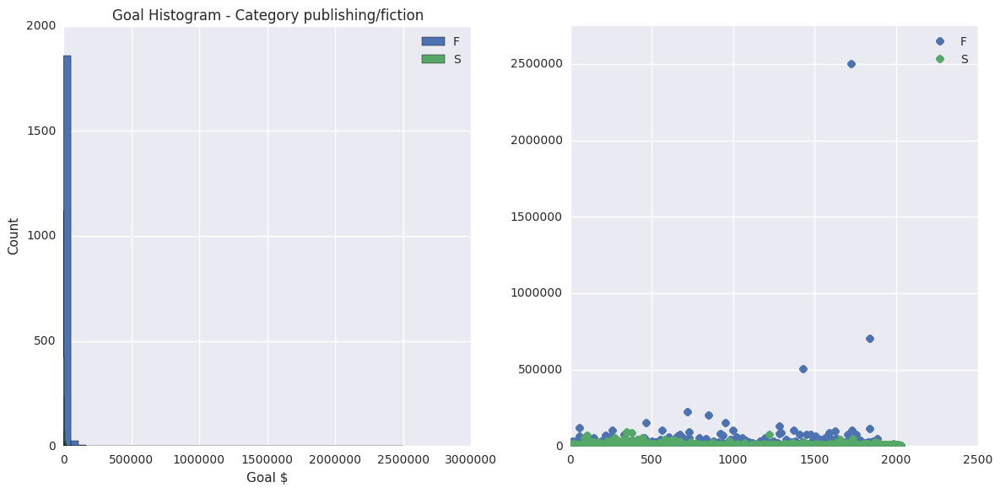

Category:  publishing/children's books
# of Failed campaigns:  1977
# of Successful campaigns:  1928


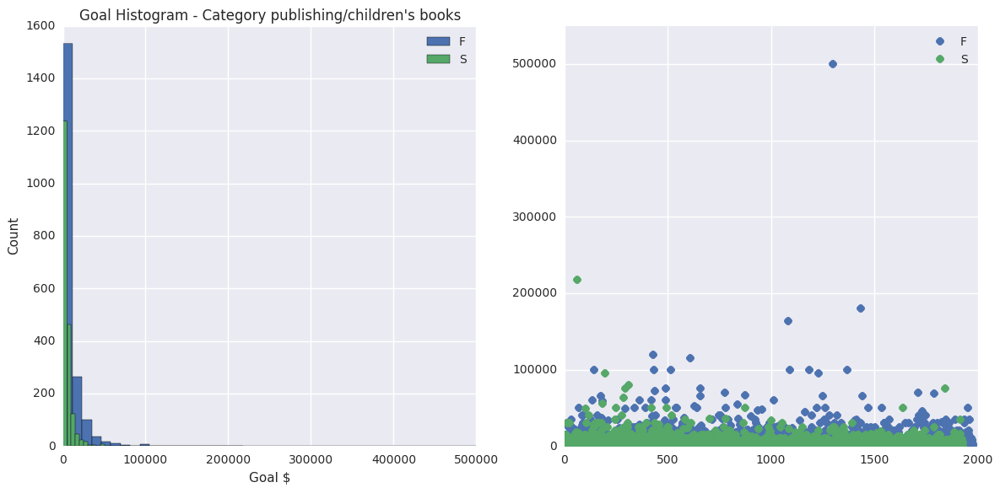

Category:  technology/3d printing
# of Failed campaigns:  276
# of Successful campaigns:  202


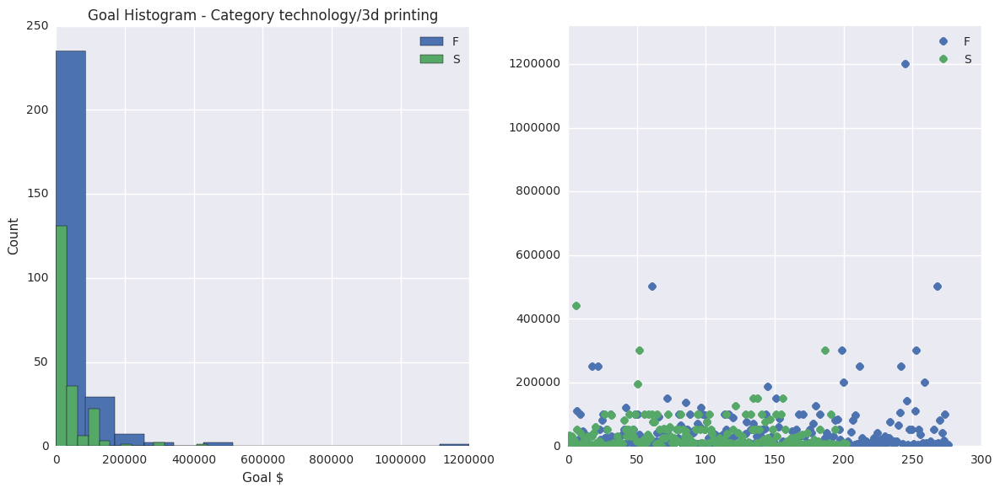

Category:  publishing/art books
# of Failed campaigns:  970
# of Successful campaigns:  1136


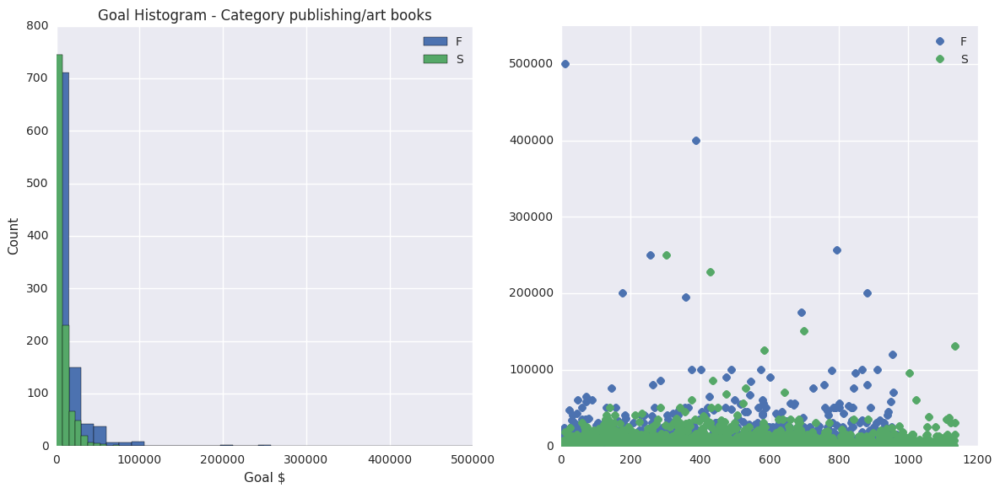

Category:  photography/photobooks
# of Failed campaigns:  20
# of Successful campaigns:  48


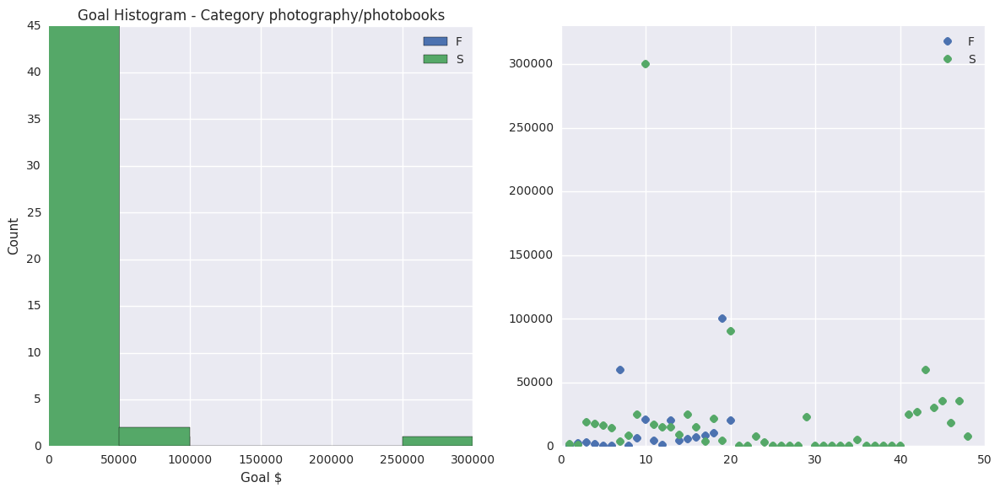

Category:  publishing/zines
# of Failed campaigns:  148
# of Successful campaigns:  130


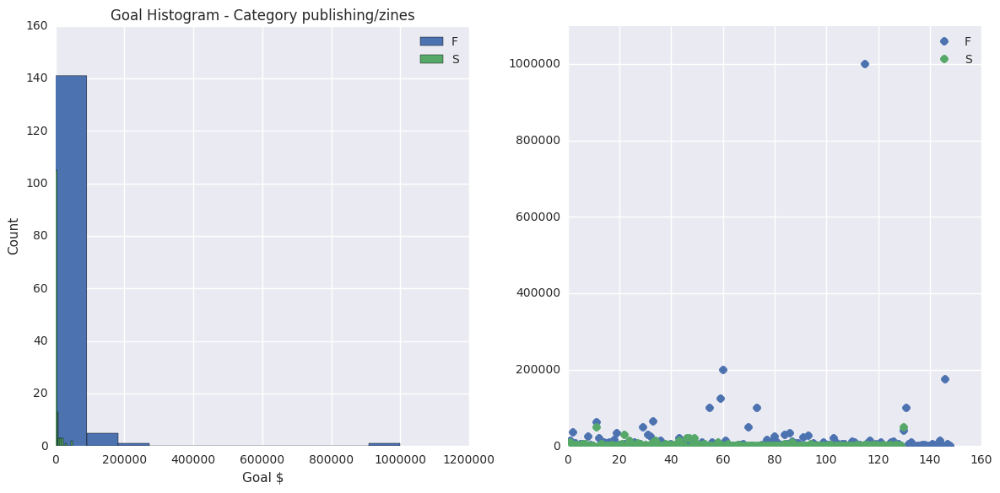

Category:  publishing/translations
# of Failed campaigns:  86
# of Successful campaigns:  35


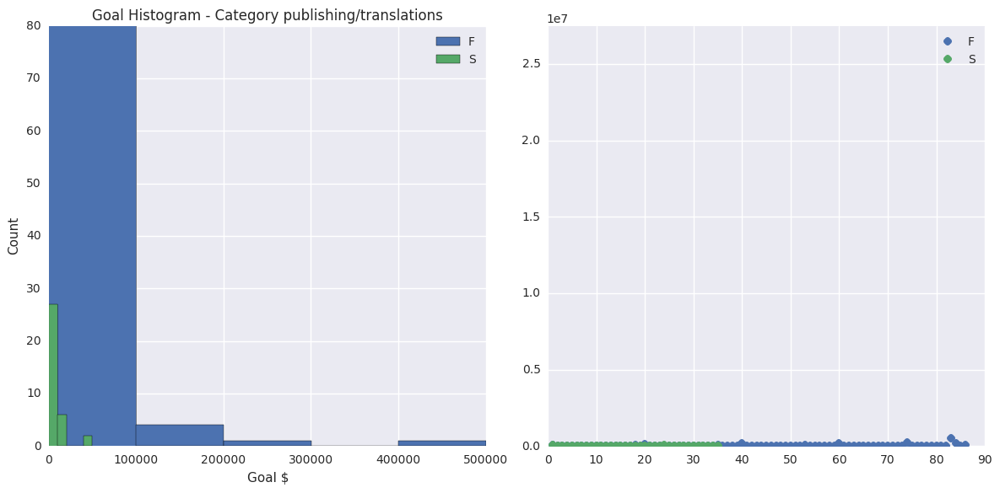

Category:  publishing/nonfiction
# of Failed campaigns:  1914
# of Successful campaigns:  2003


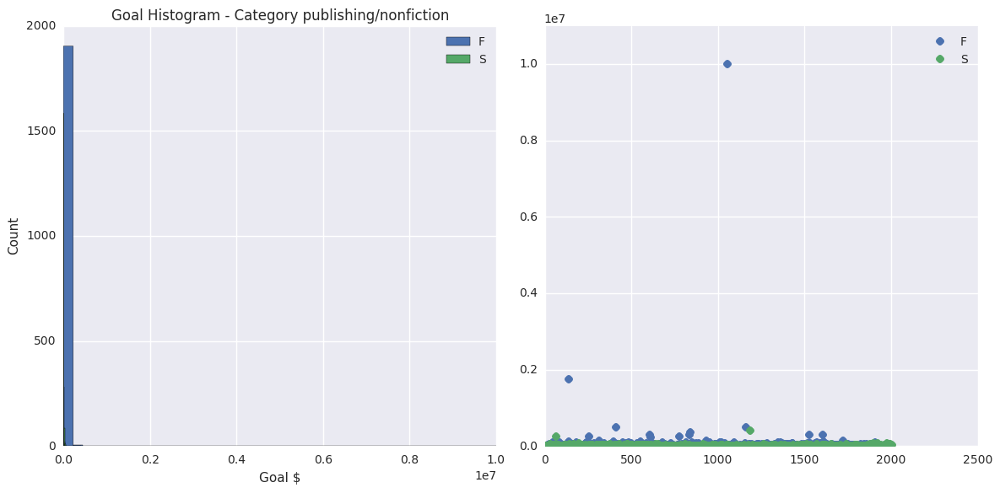

Category:  publishing/radio & podcasts
# of Failed campaigns:  398
# of Successful campaigns:  360


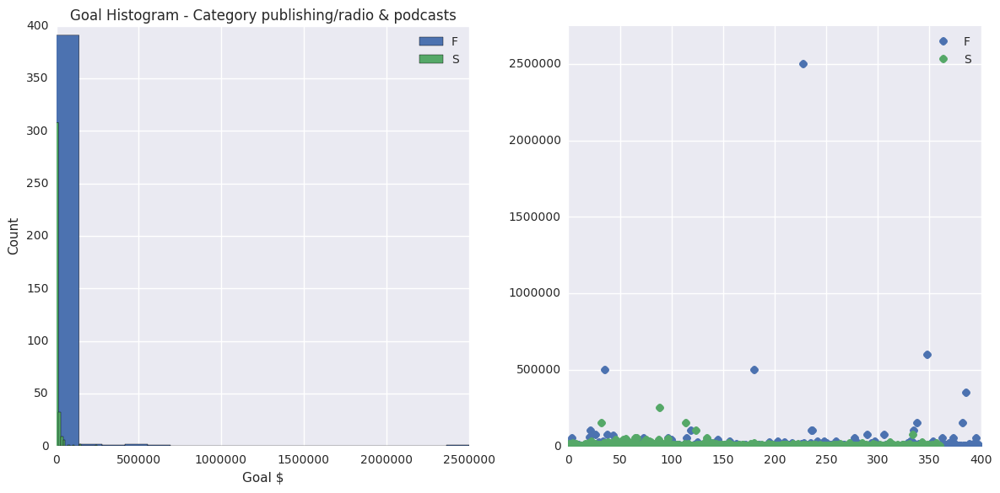

Category:  publishing/poetry
# of Failed campaigns:  696
# of Successful campaigns:  441


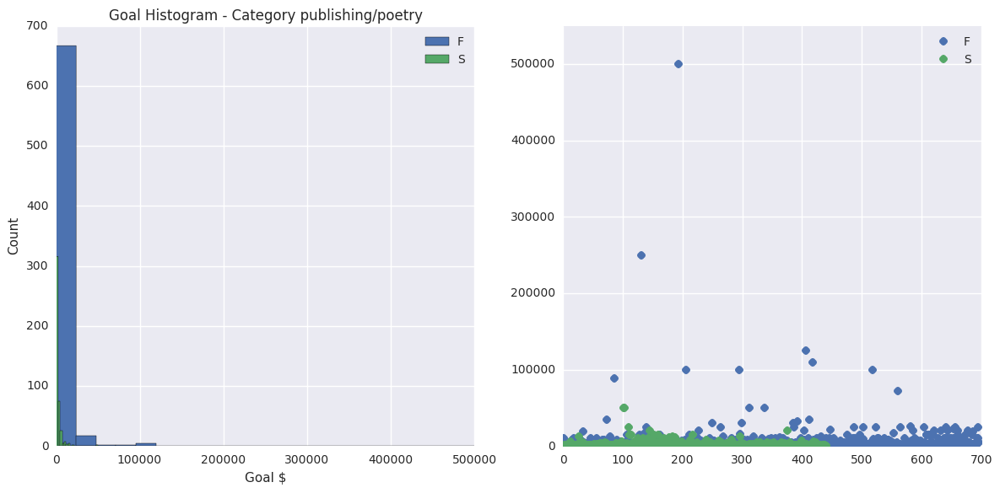

Category:  publishing/literary journals
# of Failed campaigns:  102
# of Successful campaigns:  101


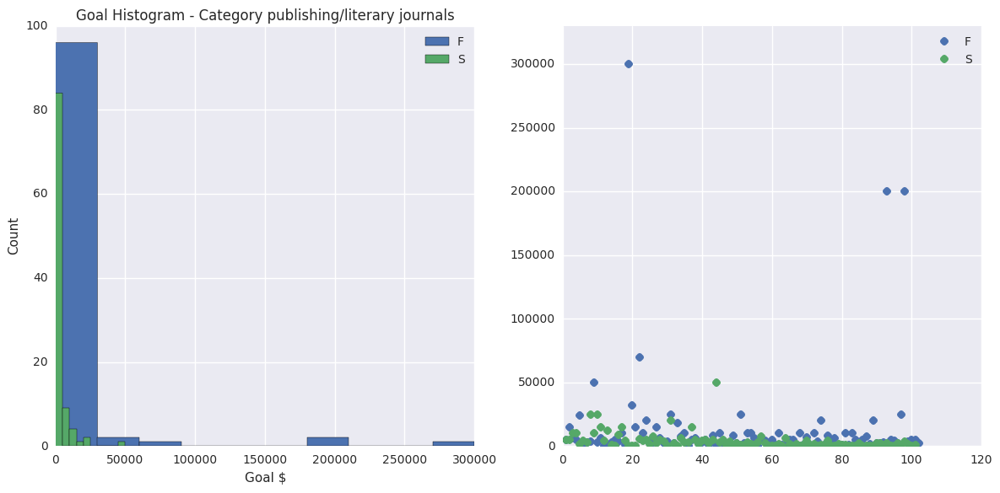

Category:  music/hip-hop
# of Failed campaigns:  120
# of Successful campaigns:  80


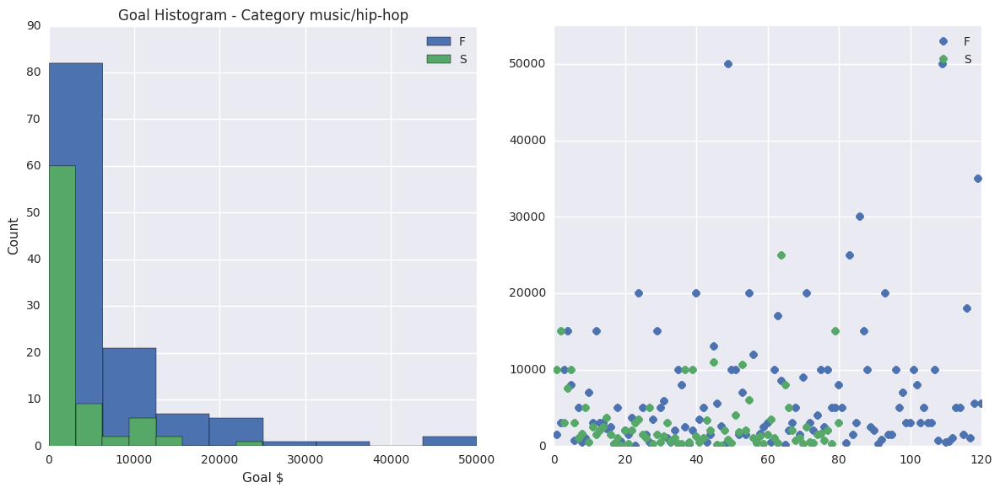

Category:  music/rock
# of Failed campaigns:  20
# of Successful campaigns:  60


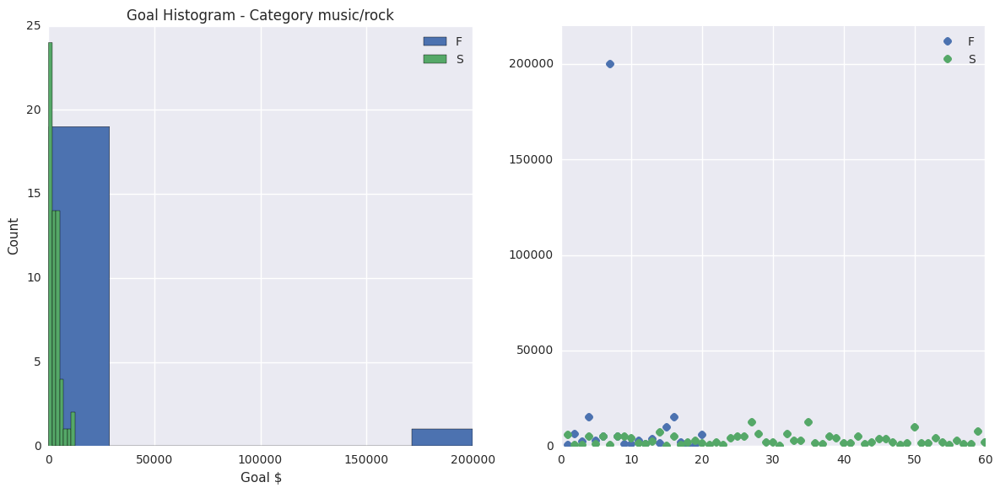

Category:  games/tabletop games
# of Failed campaigns:  0
# of Successful campaigns:  60


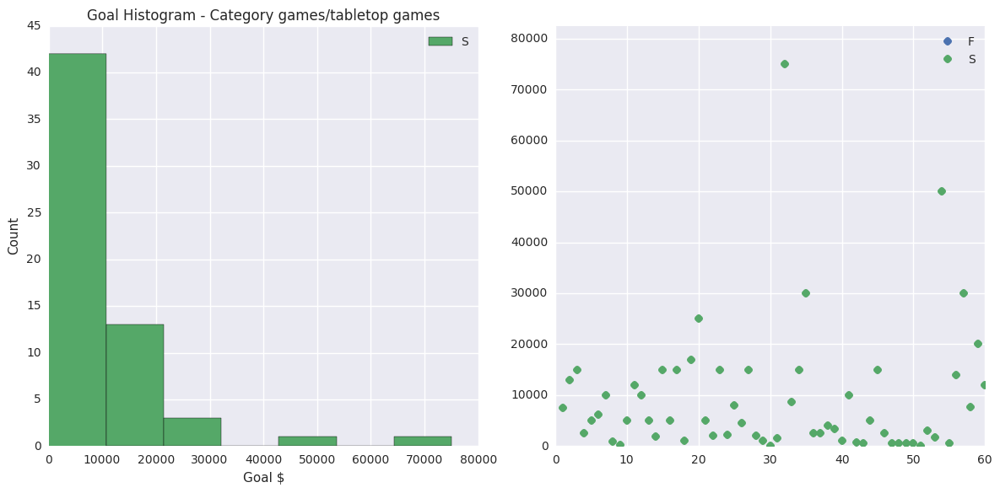

Category:  film & video/television
# of Failed campaigns:  15
# of Successful campaigns:  5


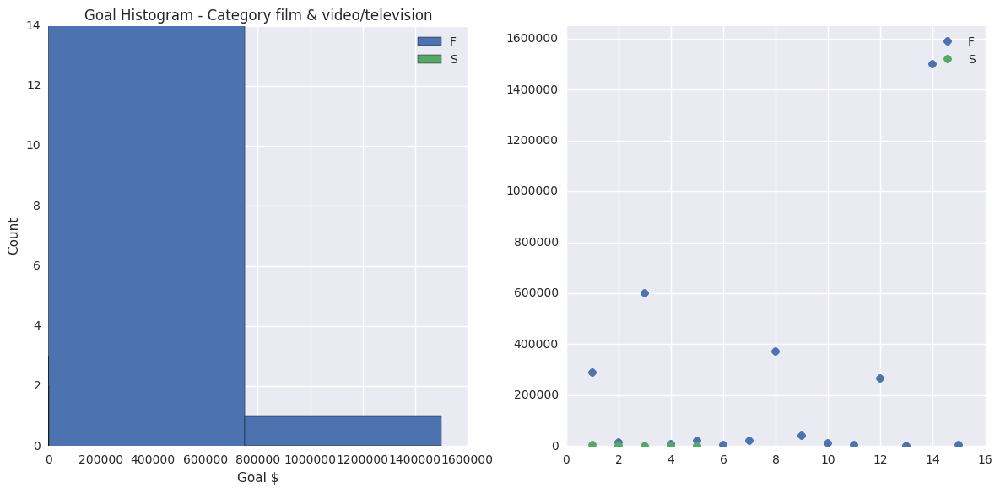

Category:  publishing/calendars
# of Failed campaigns:  122
# of Successful campaigns:  105


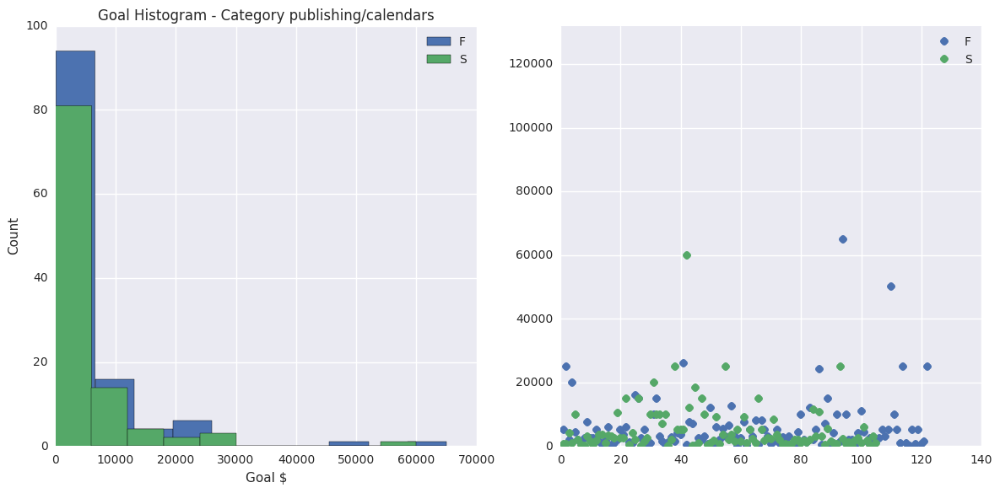

Category:  publishing/comedy
# of Failed campaigns:  2
# of Successful campaigns:  0


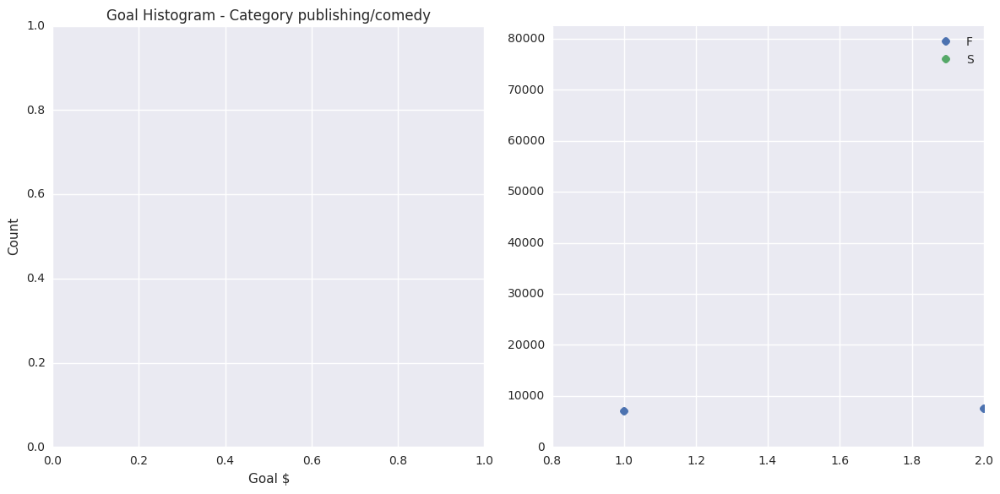

Category:  film & video/drama
# of Failed campaigns:  20
# of Successful campaigns:  0


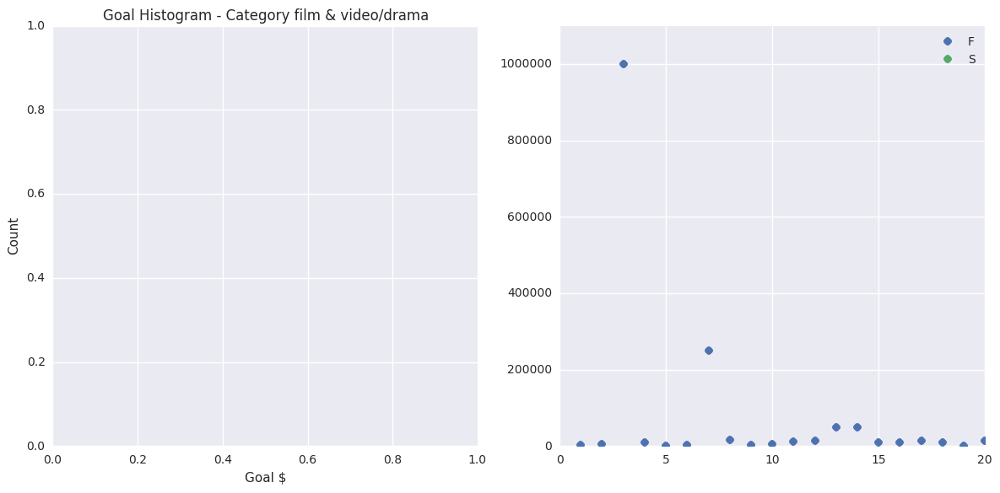

Category:  music/pop
# of Failed campaigns:  0
# of Successful campaigns:  0


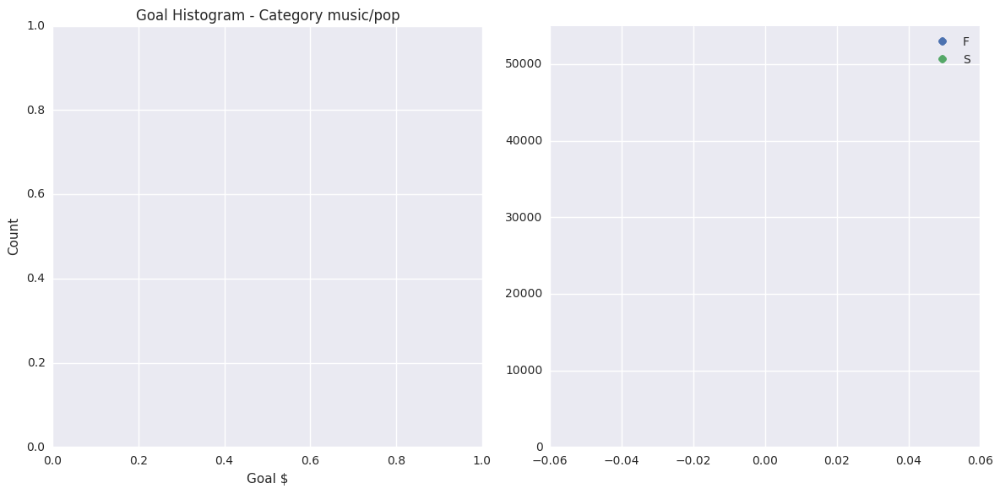

Category:  music/latin
# of Failed campaigns:  0
# of Successful campaigns:  0


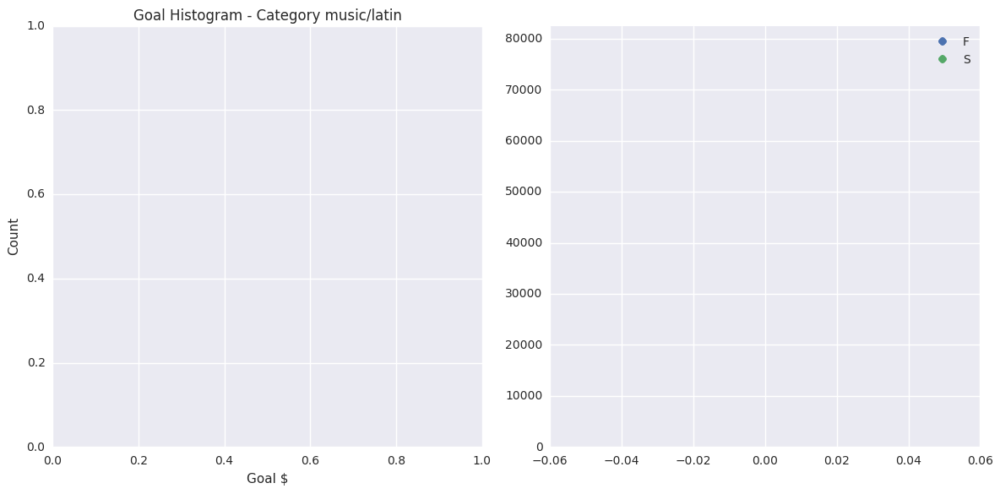

Category:  music/kids
# of Failed campaigns:  20
# of Successful campaigns:  20


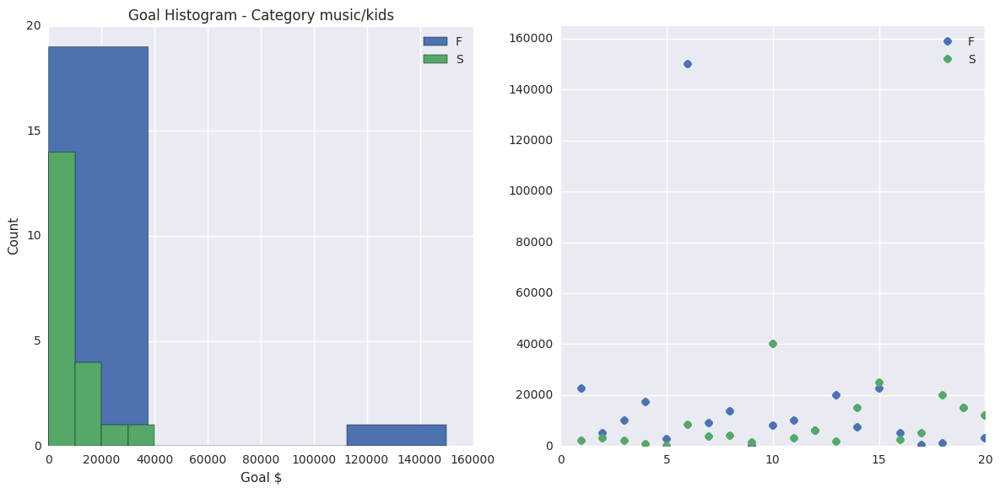

Category:  dance/performances
# of Failed campaigns:  0
# of Successful campaigns:  20


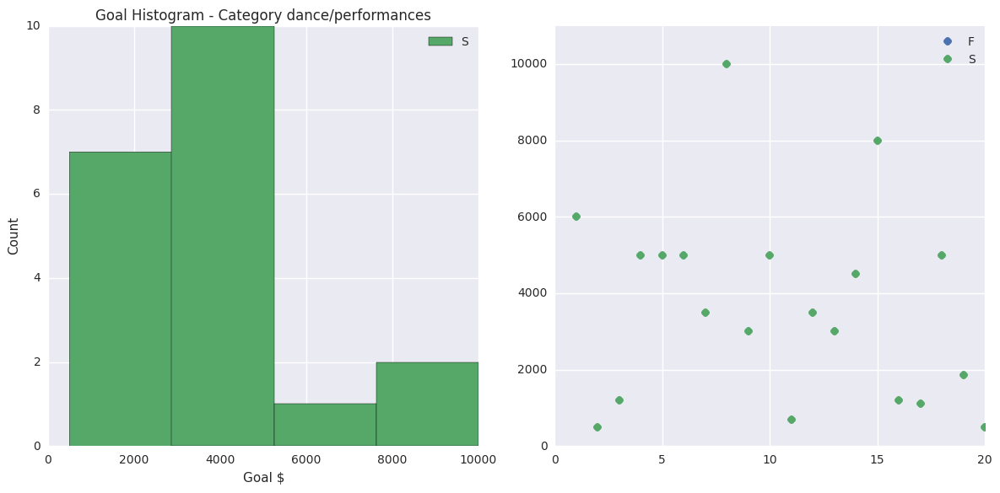

Category:  music/indie rock
# of Failed campaigns:  0
# of Successful campaigns:  40


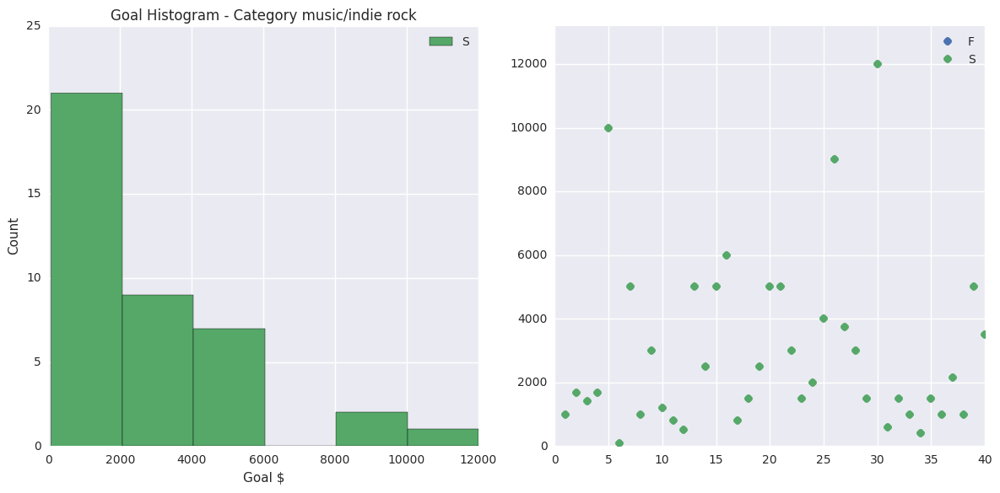

Category:  comics/comic books
# of Failed campaigns:  40
# of Successful campaigns:  0


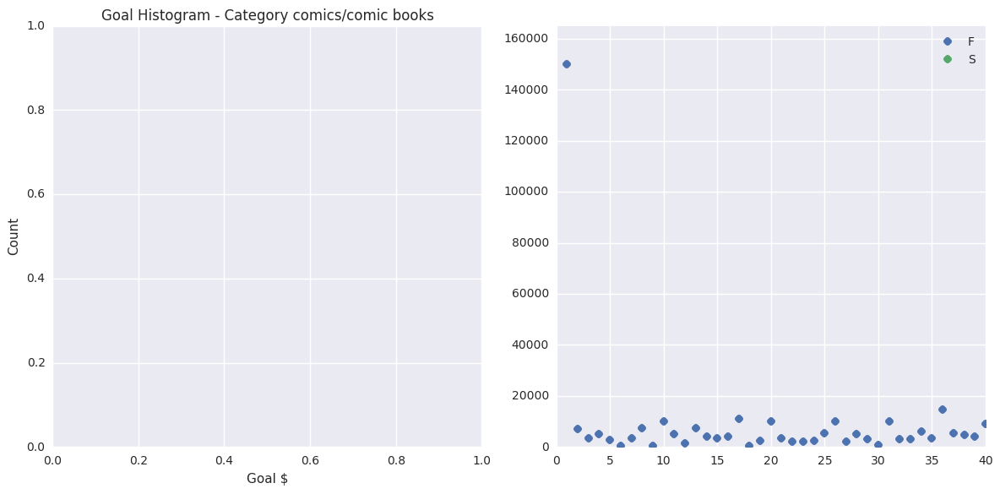

Category:  publishing/anthologies
# of Failed campaigns:  103
# of Successful campaigns:  162


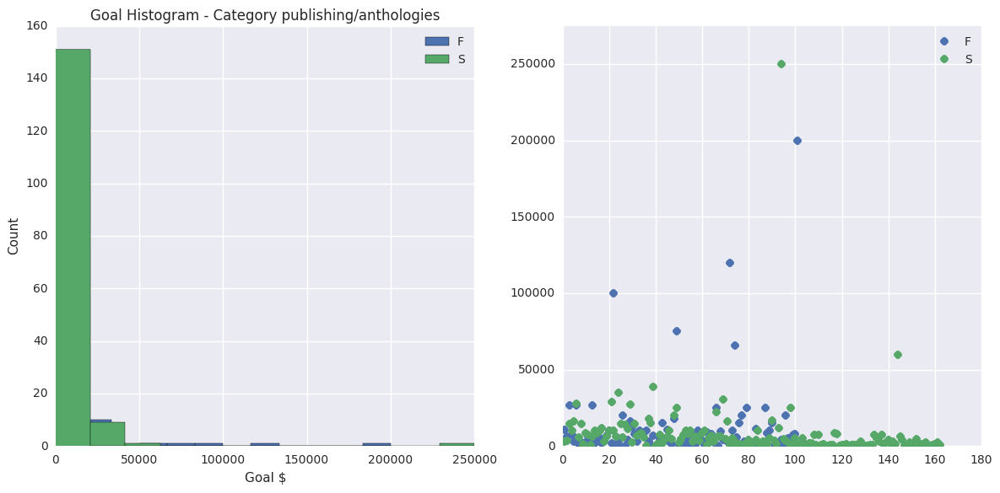

In [67]:
_ = map(goal_each_cat, data['cat'].unique())

# Ratio between failed pledge vs failed goal

In [68]:
data['p_g_ratio'] = data['pledged'] / data['goal']
goal_pledged_ratio = (data[data['state'] == 'failed']['pledged']) / (data[data['state'] == 'failed']['goal'])
print type(goal_pledged_ratio)
print goal_pledged_ratio.head()
print goal_pledged_ratio.shape

<class 'pandas.core.series.Series'>
0    0.00000
1    0.00000
2    0.00120
3    0.00000
4    0.11049
dtype: float64
(24986,)


In [72]:
def p_g_ratio_plot(category):
    try:
#         _ = plt.hist(data[(data['cat'] == category) & 
#                           (data['state'] == 'failed')]['p_g_ratio'].values, bins=20, label='Include 0')
        _ = plt.hist(data[(data['cat'] == category) & 
                          (data['state'] == 'failed') &
                          (data['p_g_ratio'] > 0)]['p_g_ratio'].values, bins=20, label='Exclude 0')

    except ValueError as e:
        print 'Category:', category, 'has error.'
        print e
    
    _ = plt.title('Failed Pledge/Goal Ratio Histogram - Category {}'.format(category))
    _ = plt.xlabel('Ratio')
    _ = plt.legend()
    
    _ = plt.tight_layout()
    category_re = re.sub('./', '_', category)
    plt.savefig('{}: Histogram of Pledge_Goal Ratio'.format(category_re))
    plt.show()

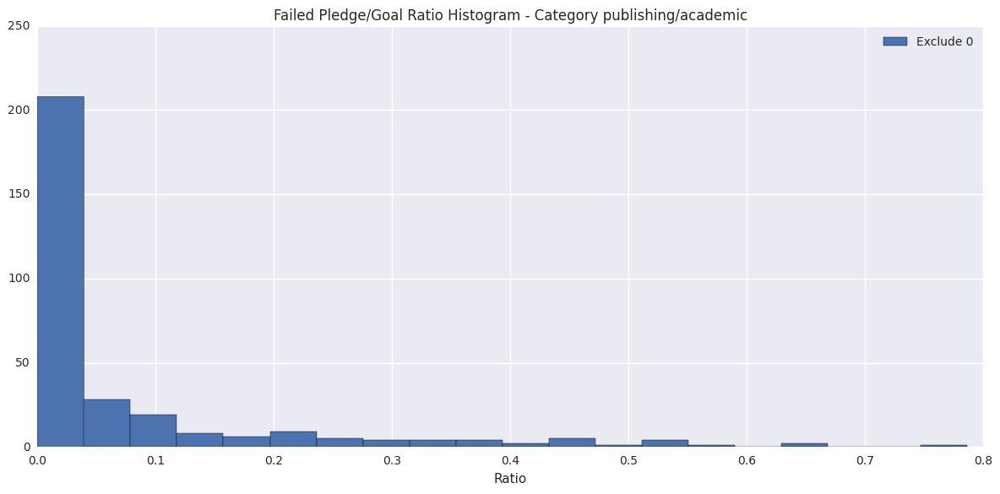

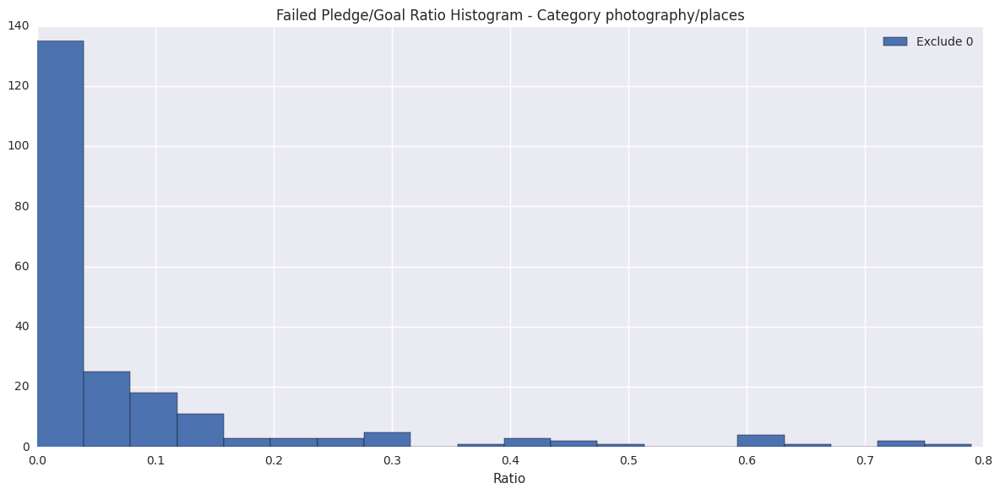

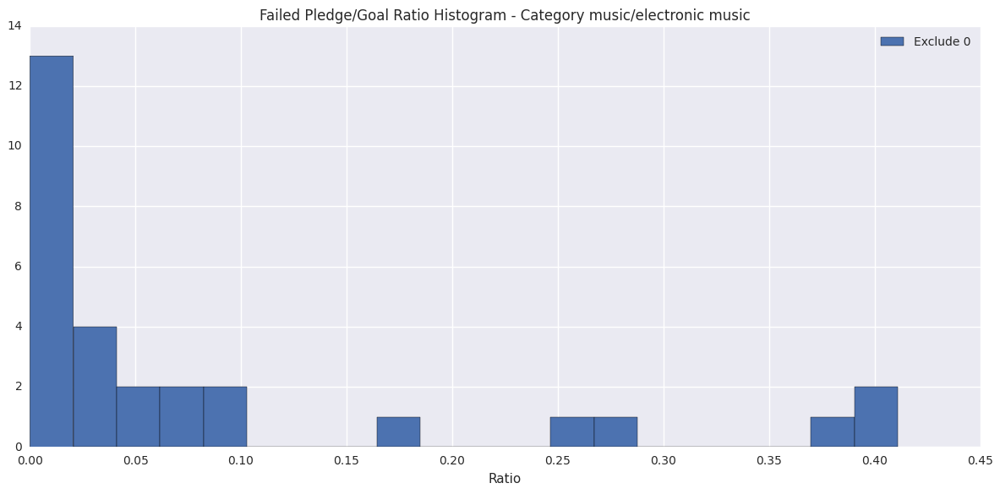

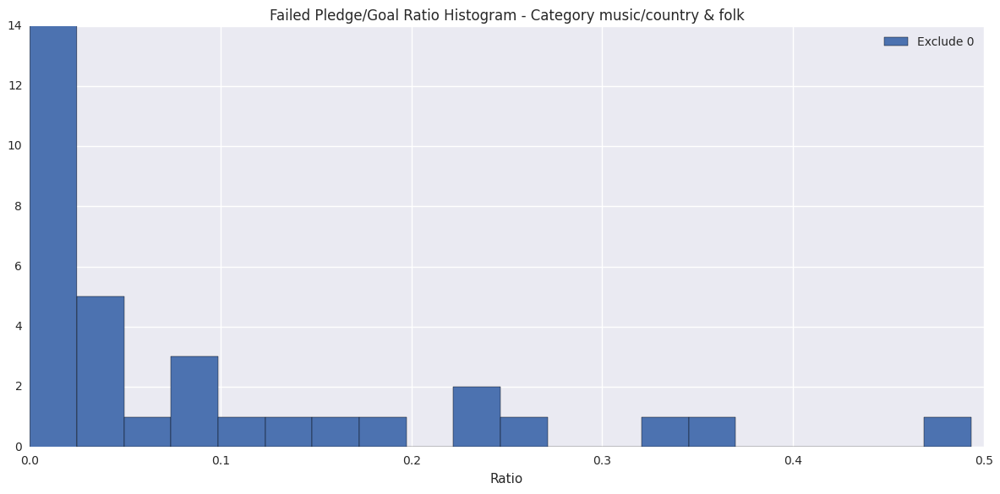

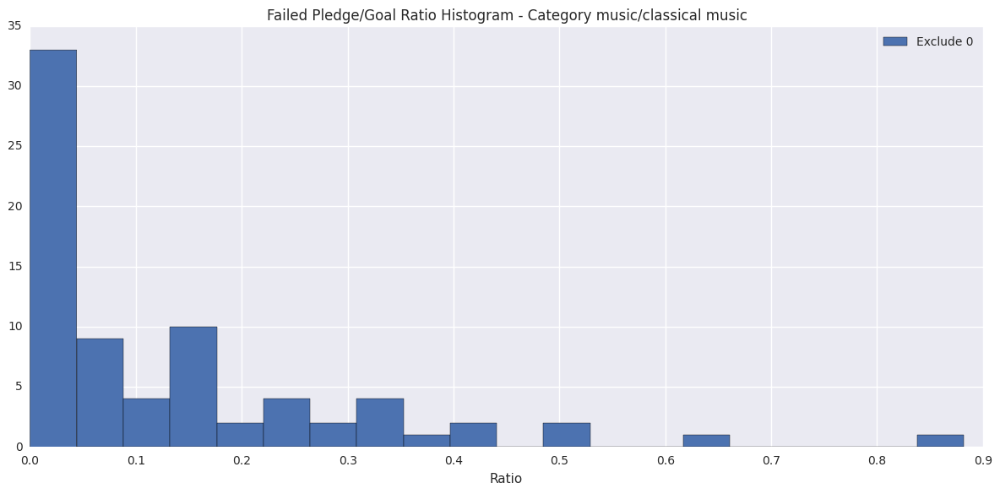

Category: music/blues has error.
zero-size array to reduction operation minimum which has no identity


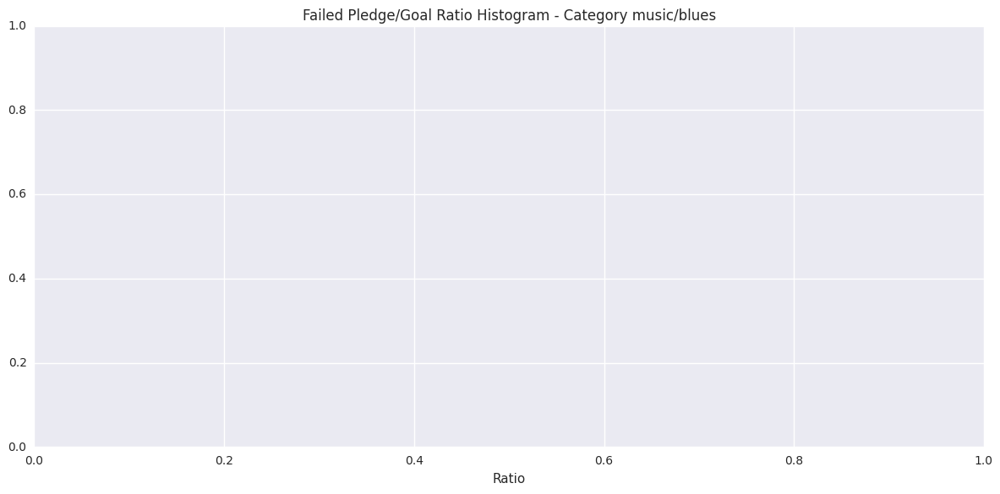

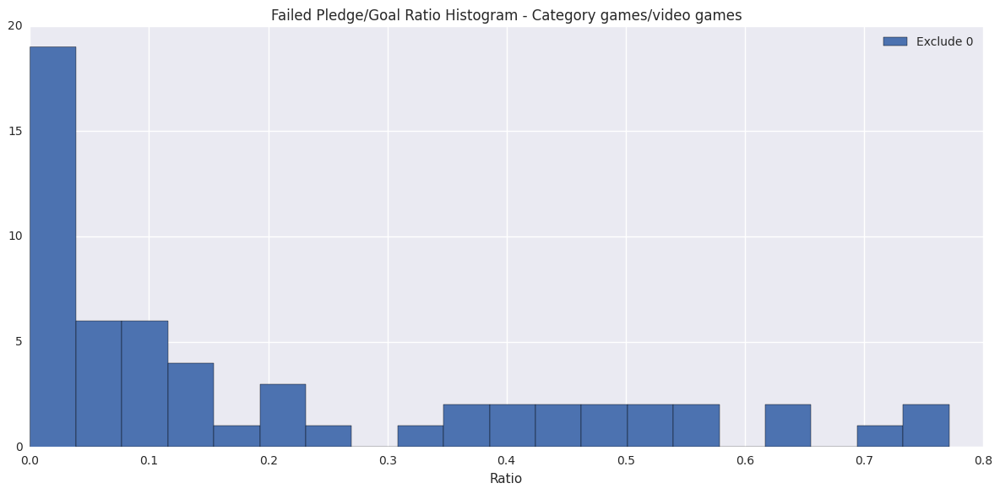

Category: food/restaurants has error.
zero-size array to reduction operation minimum which has no identity


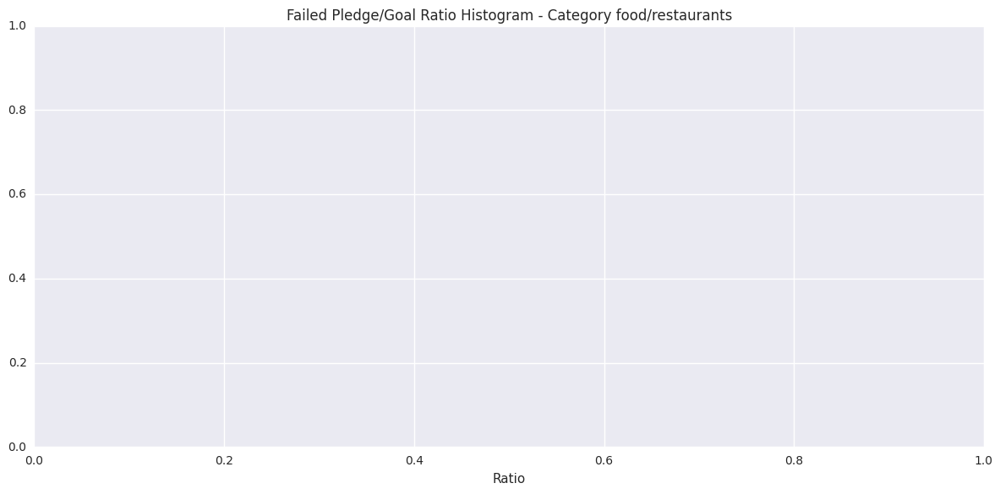

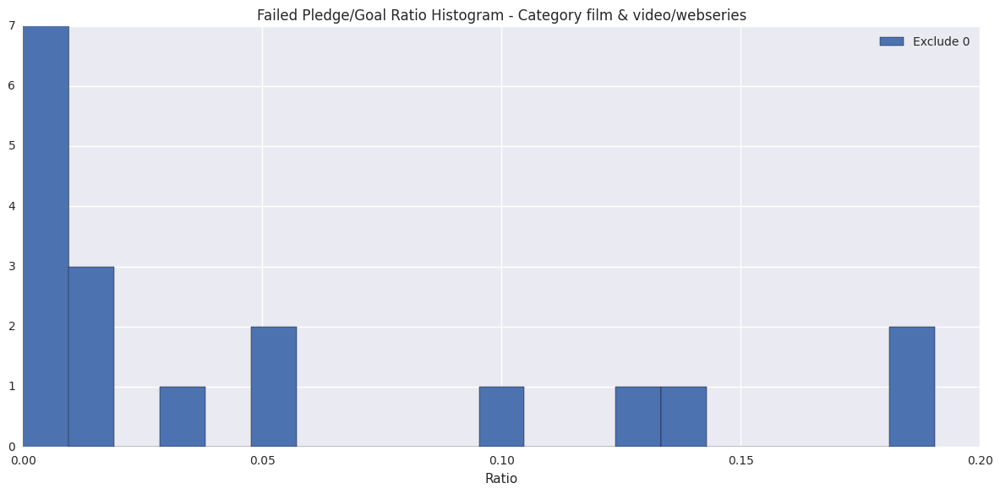

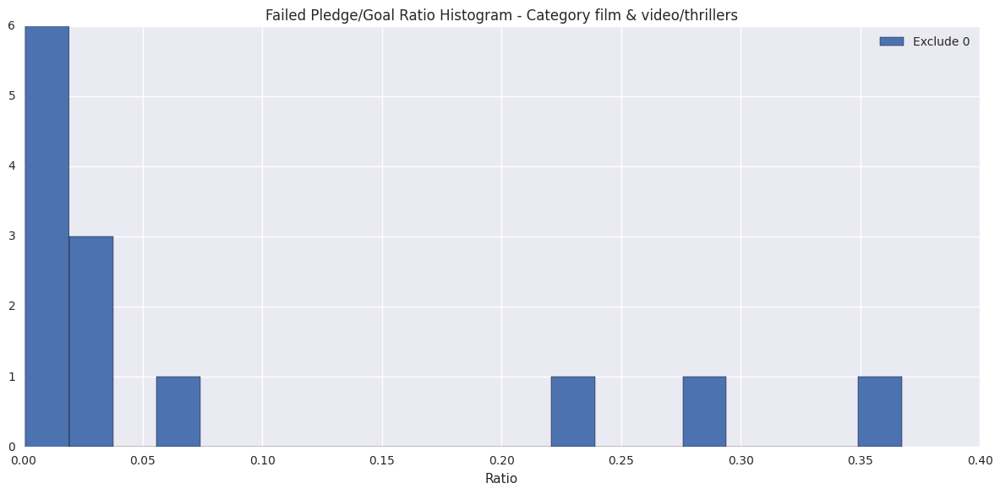

Category: film & video/shorts has error.
zero-size array to reduction operation minimum which has no identity


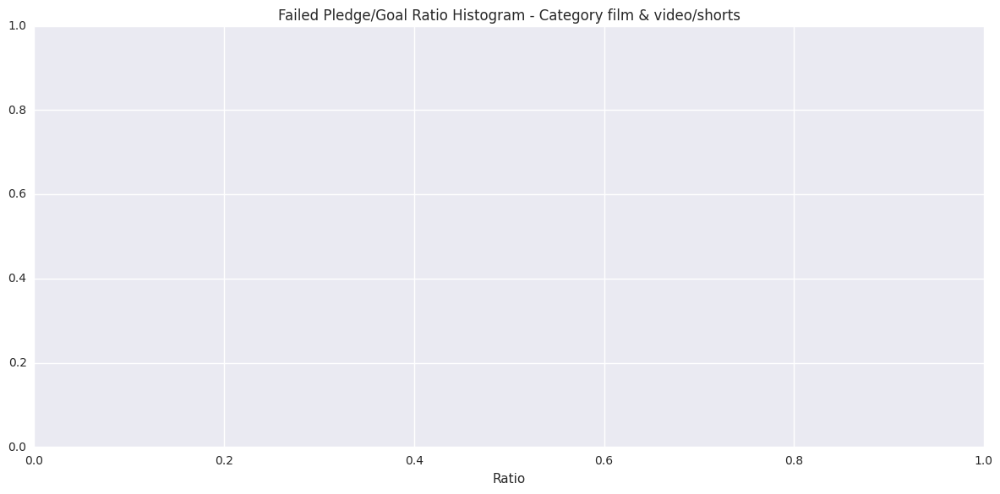

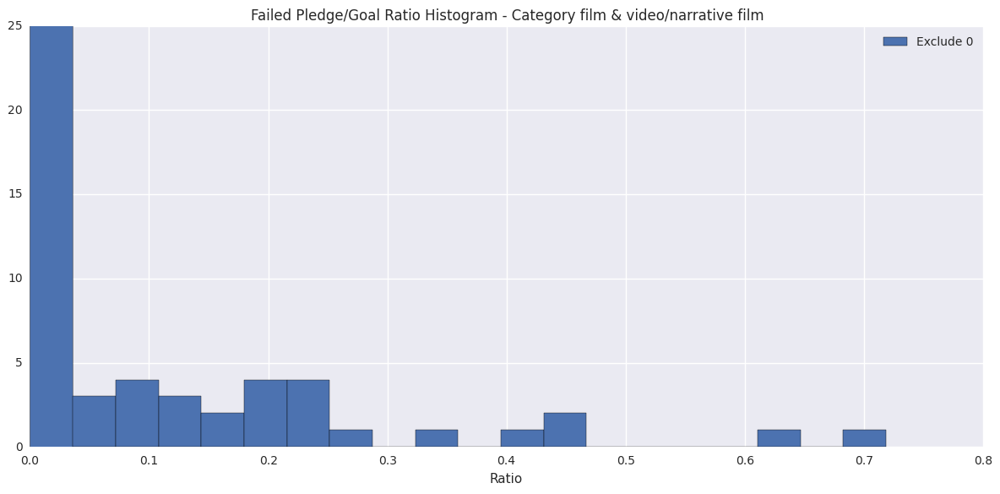

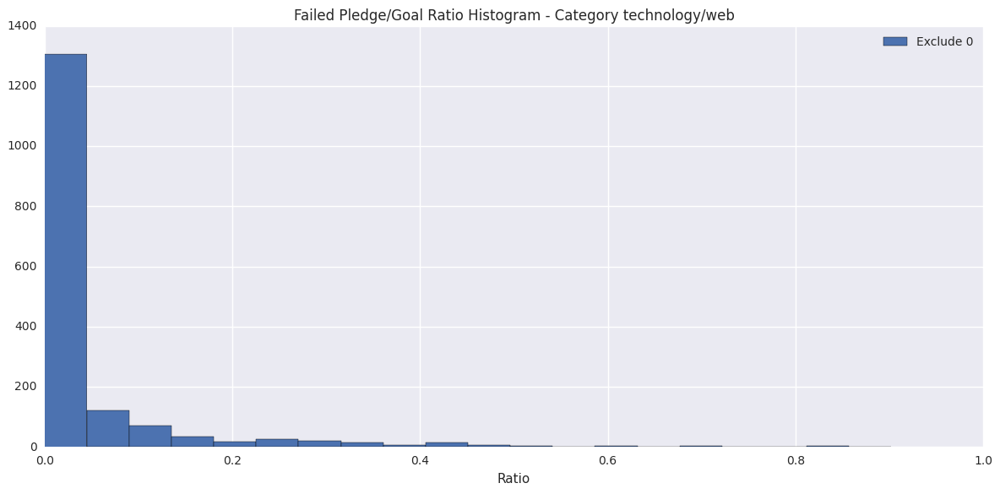

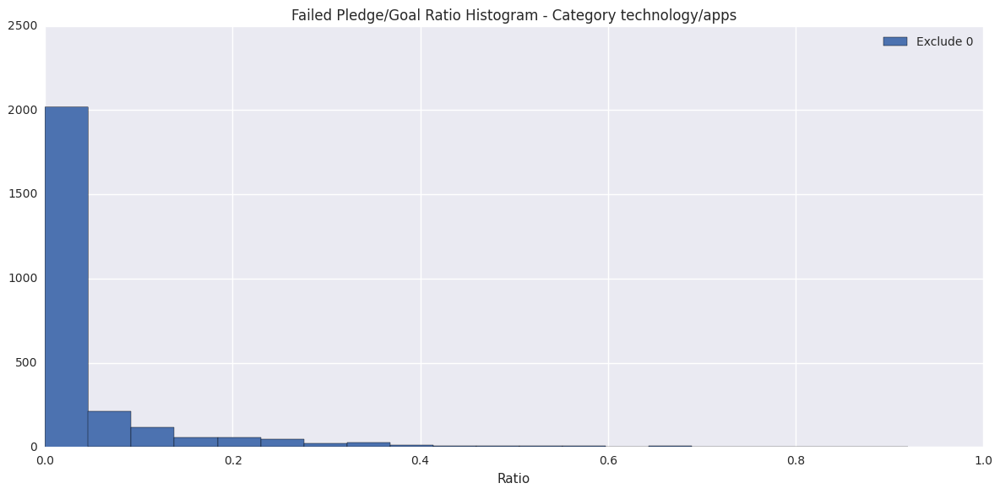

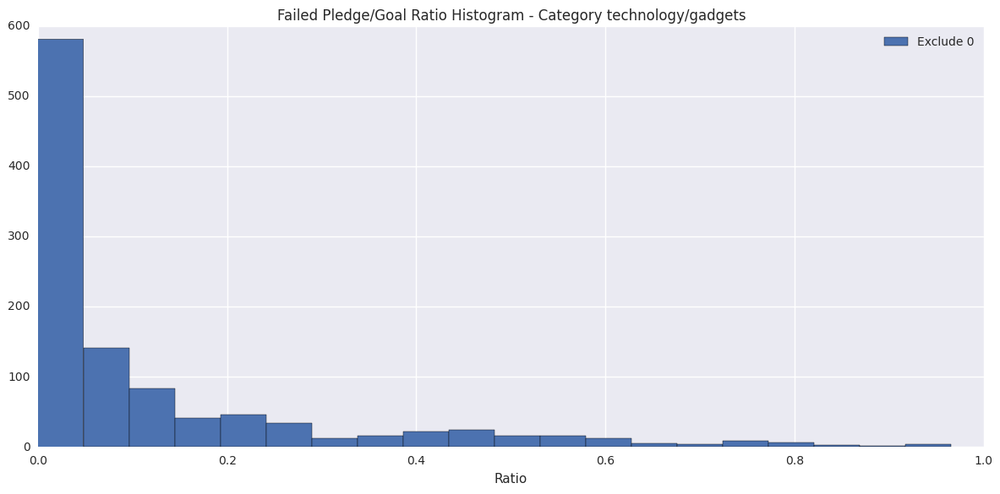

...

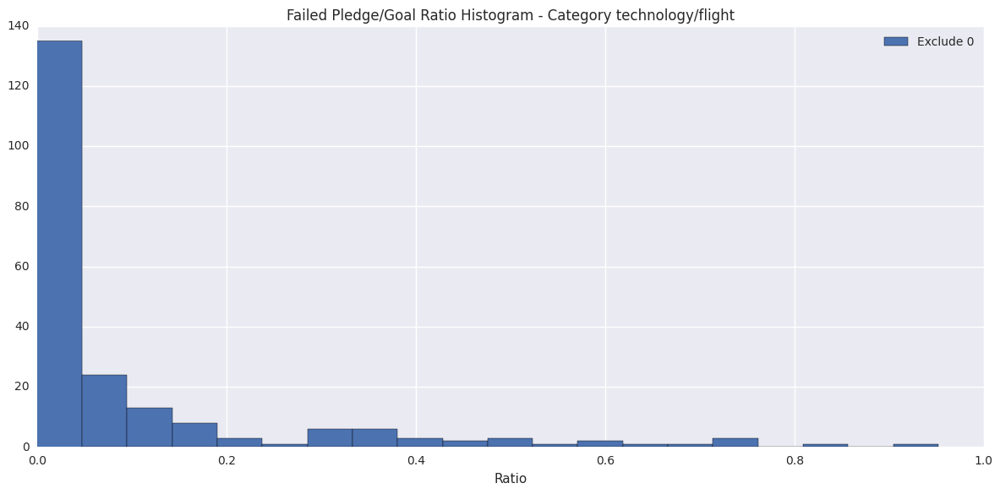

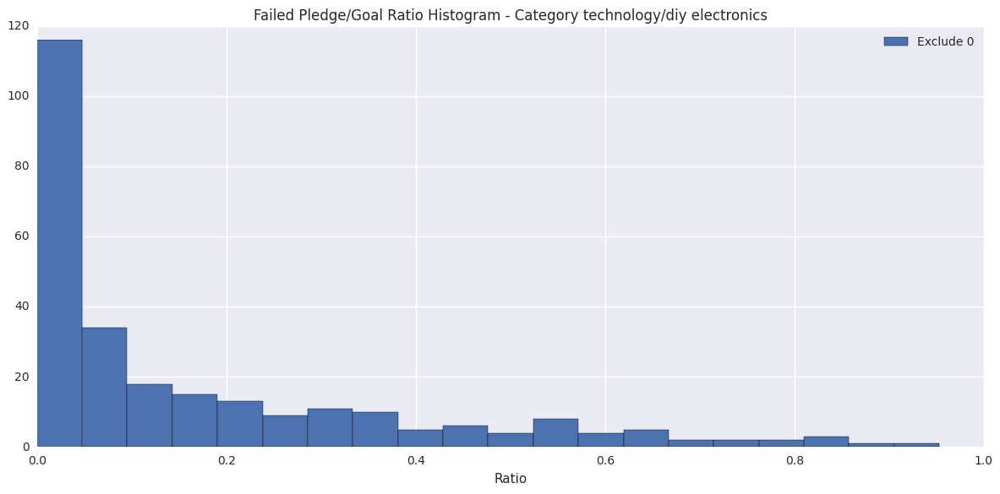

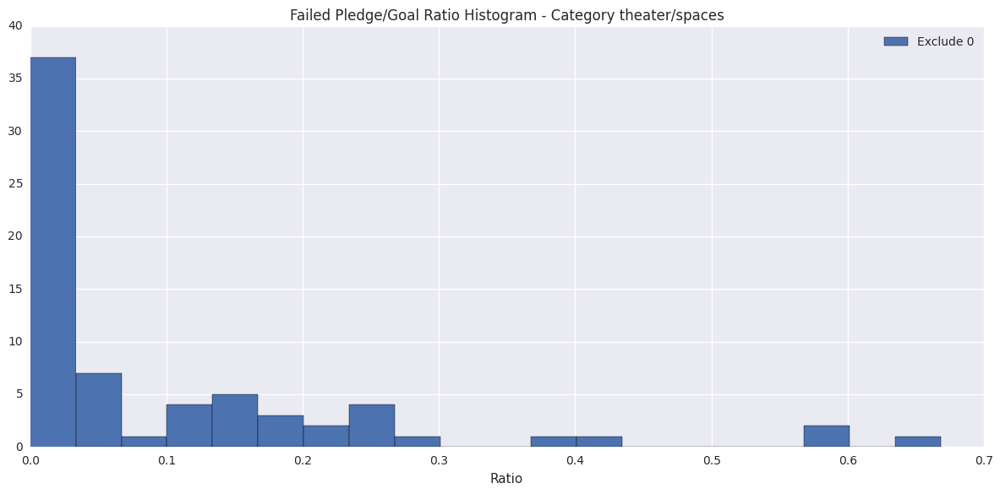

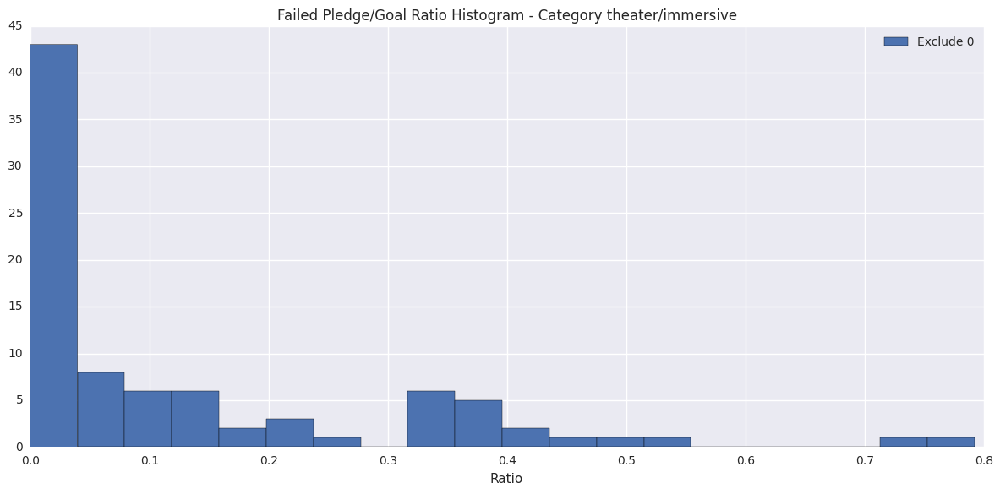

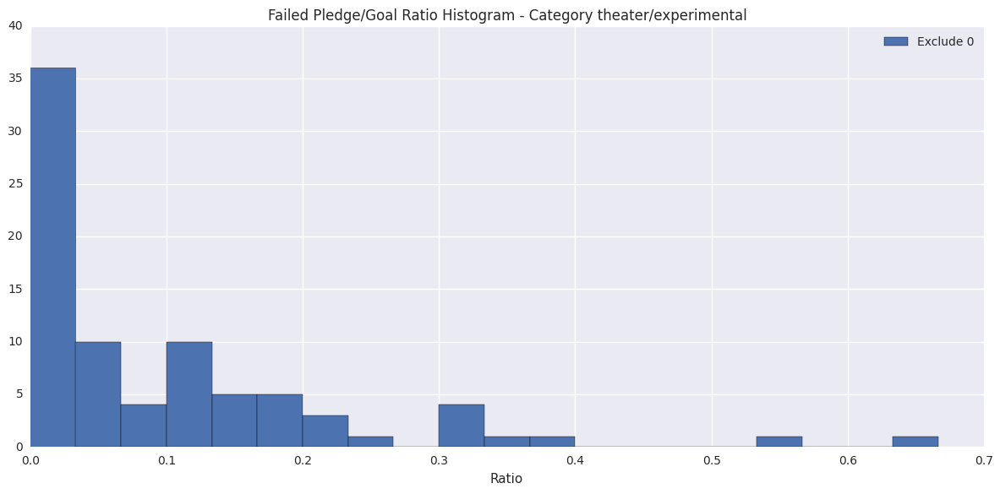

Category: theater/comedy has error.
zero-size array to reduction operation minimum which has no identity


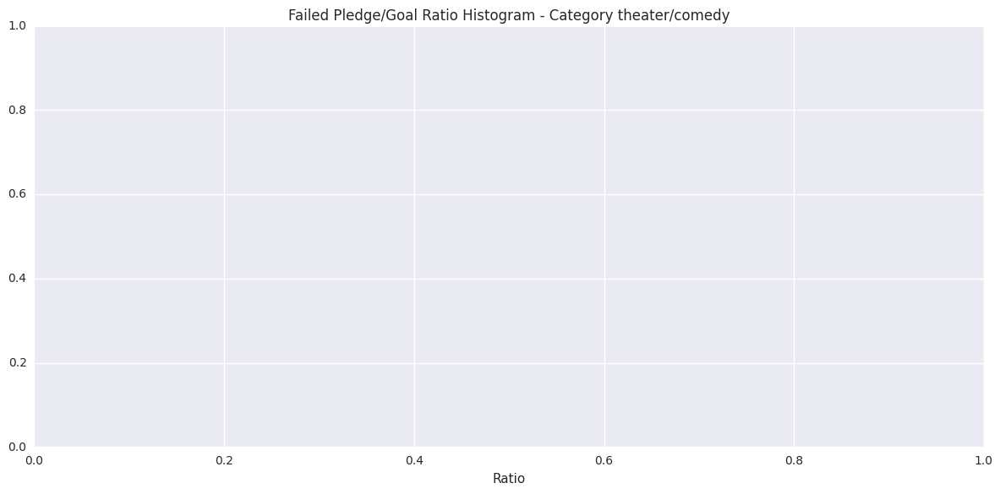

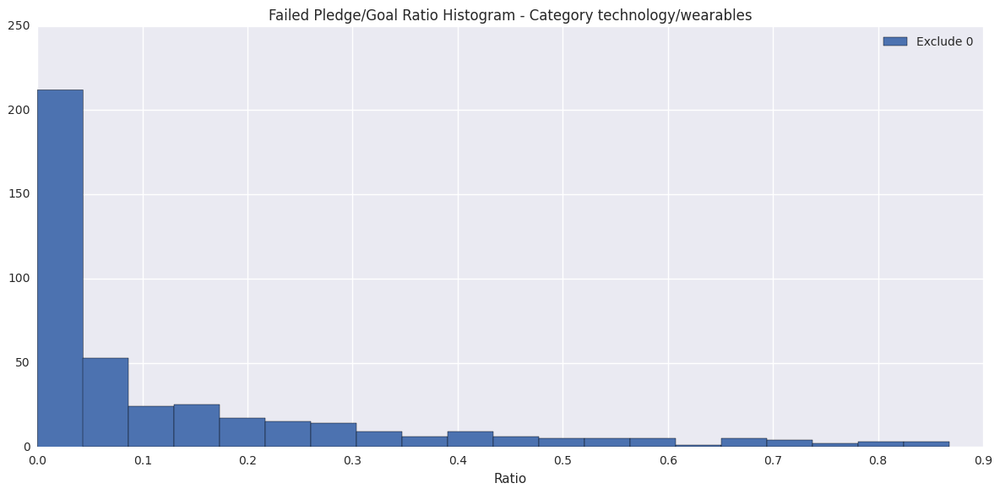

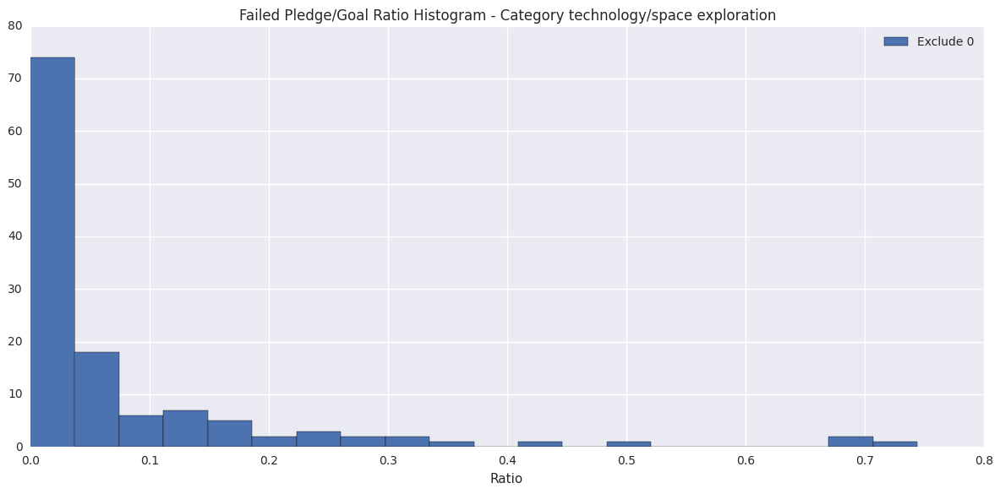

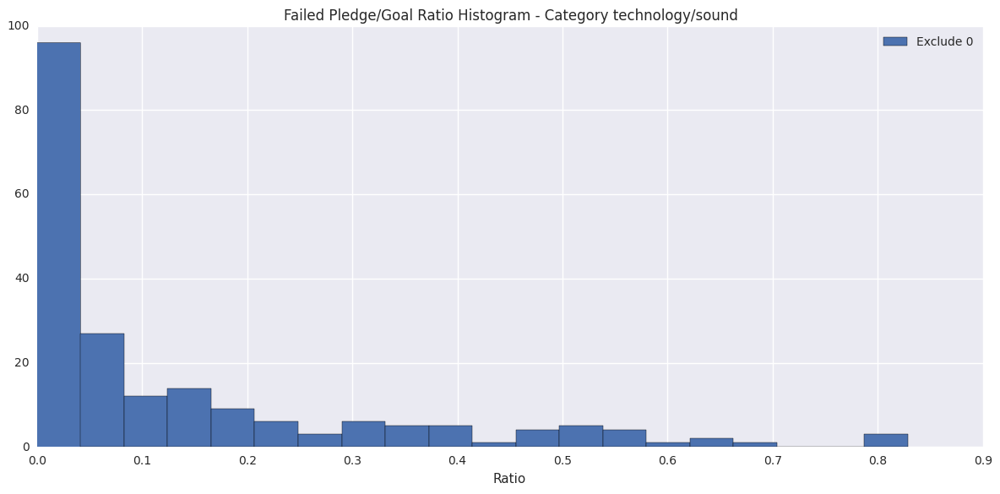

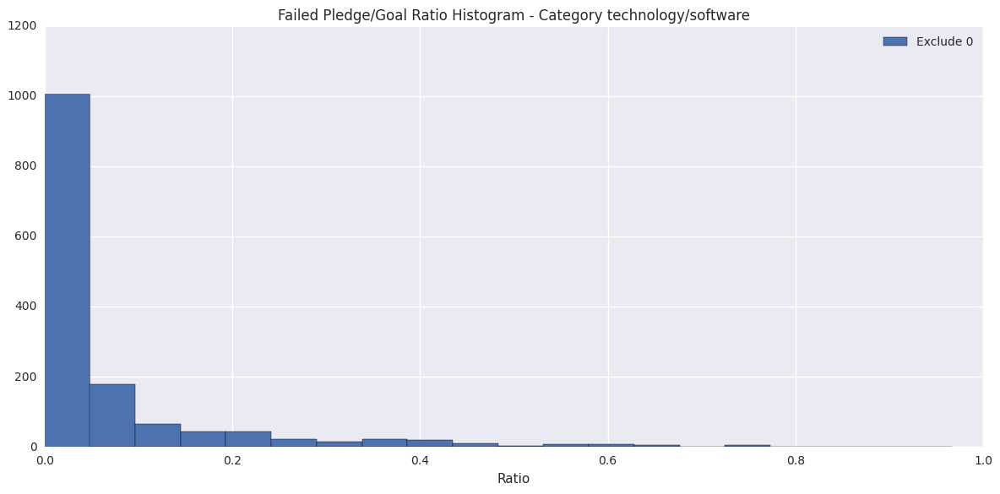

...

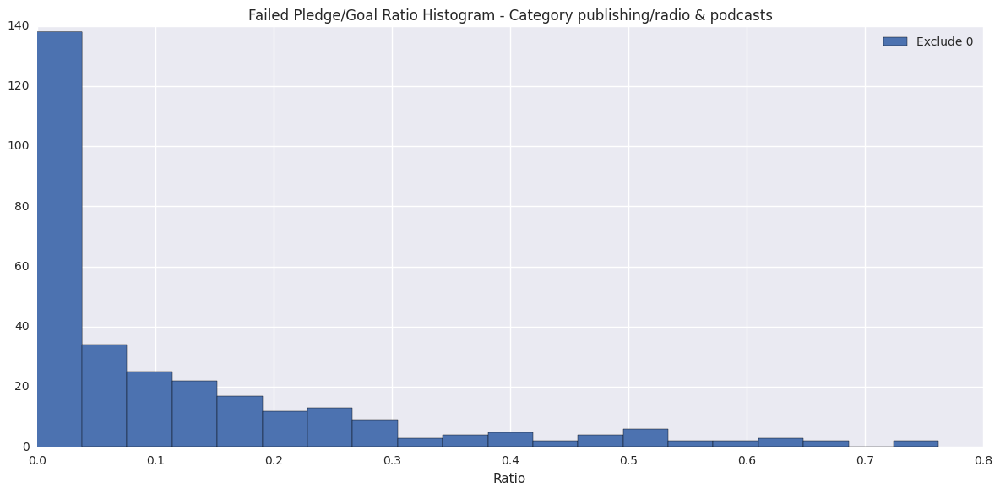

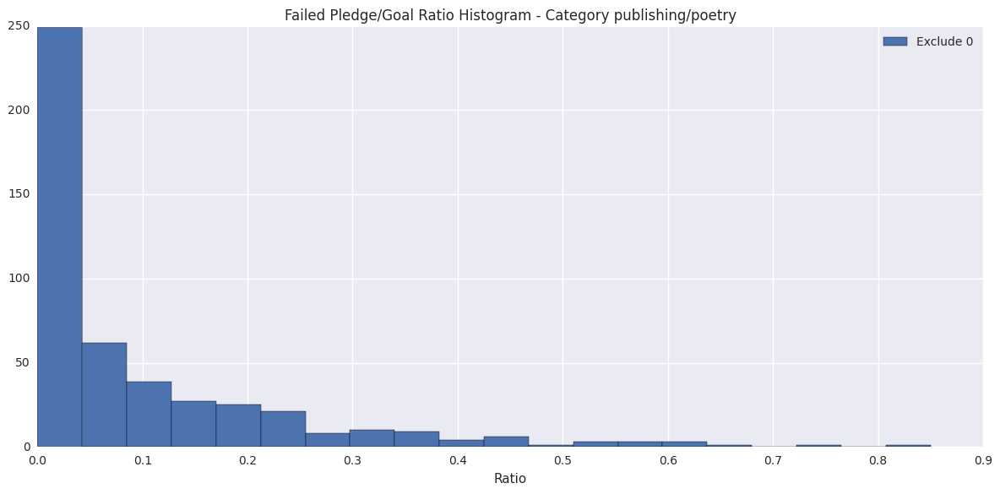

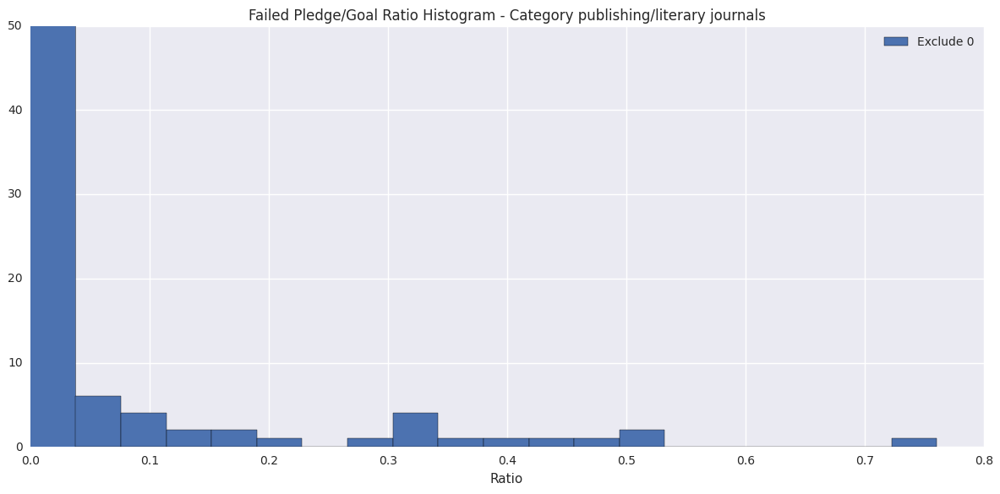

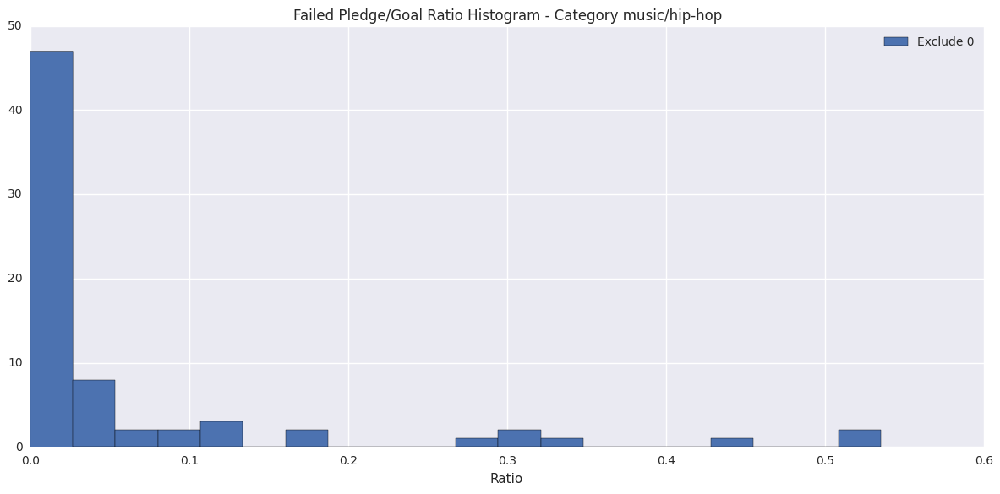

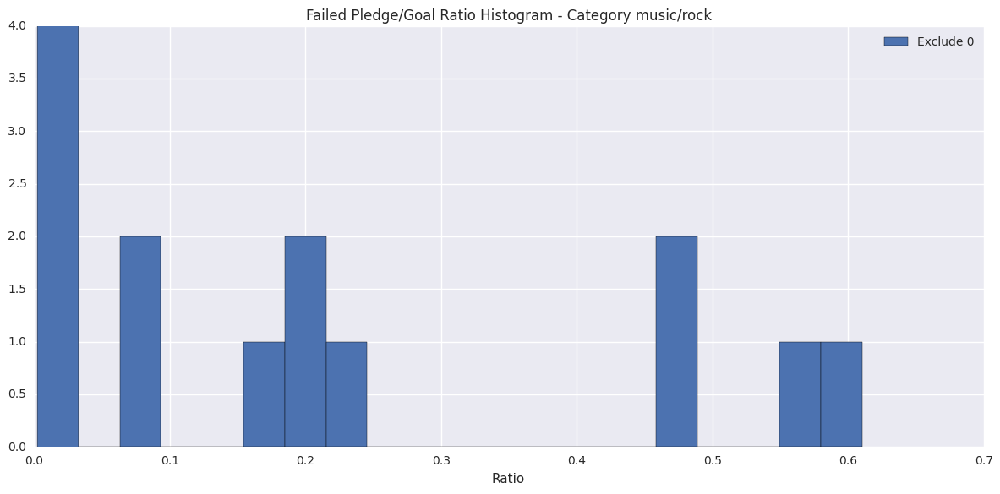

Category: games/tabletop games has error.
zero-size array to reduction operation minimum which has no identity


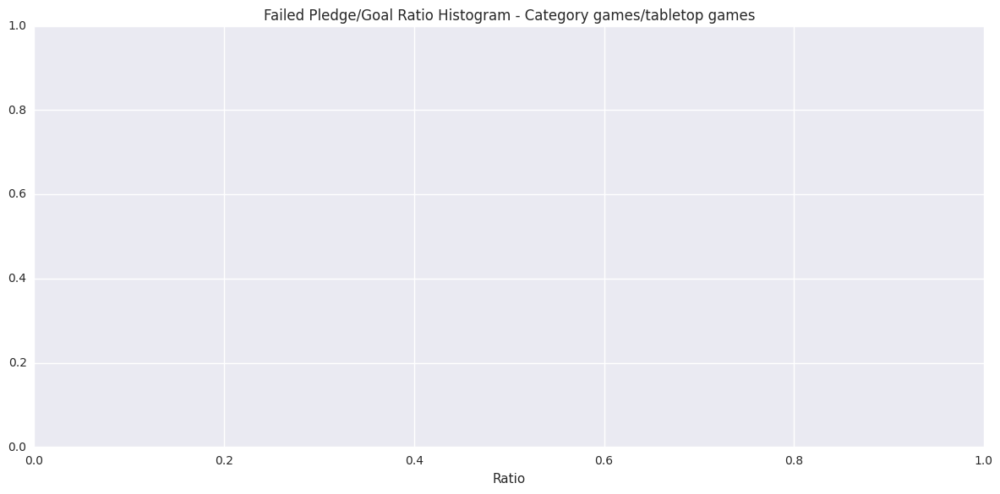

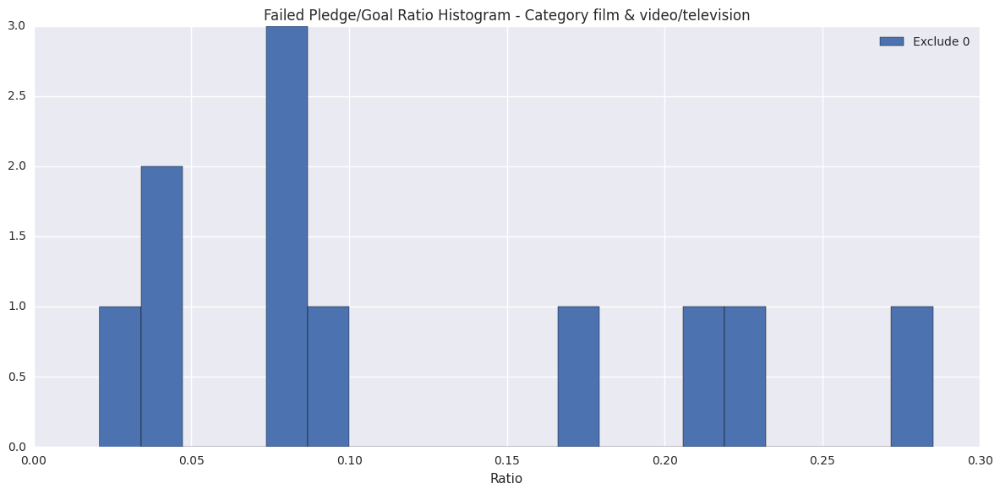

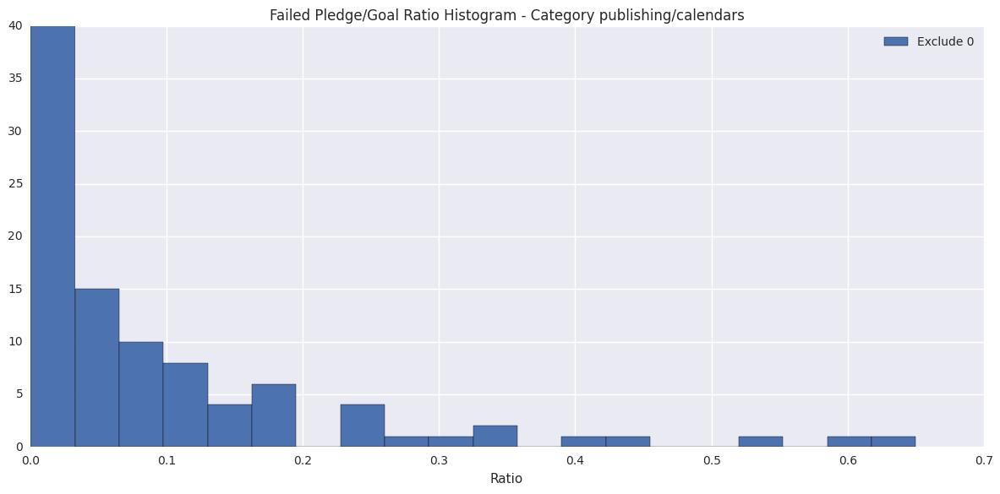

Category: publishing/comedy has error.
zero-size array to reduction operation minimum which has no identity


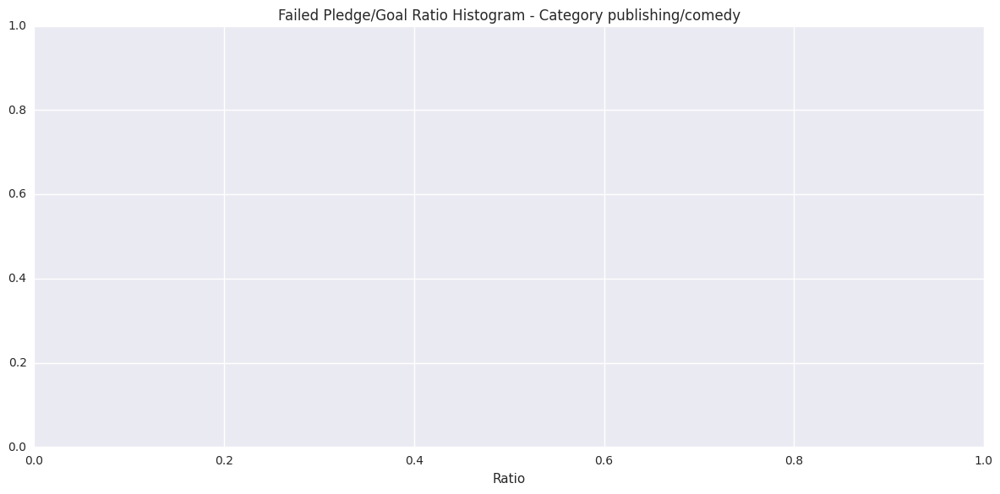

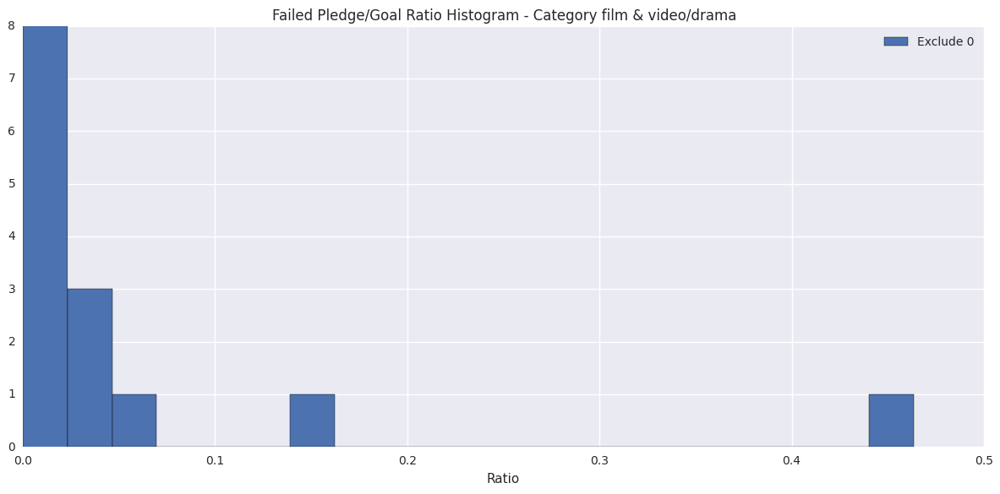

Category: music/pop has error.
zero-size array to reduction operation minimum which has no identity


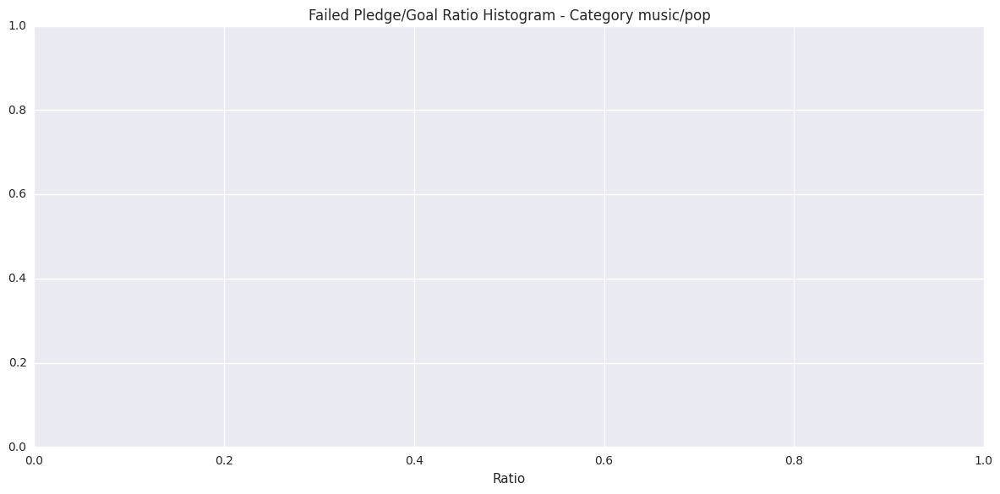

Category: music/latin has error.
zero-size array to reduction operation minimum which has no identity


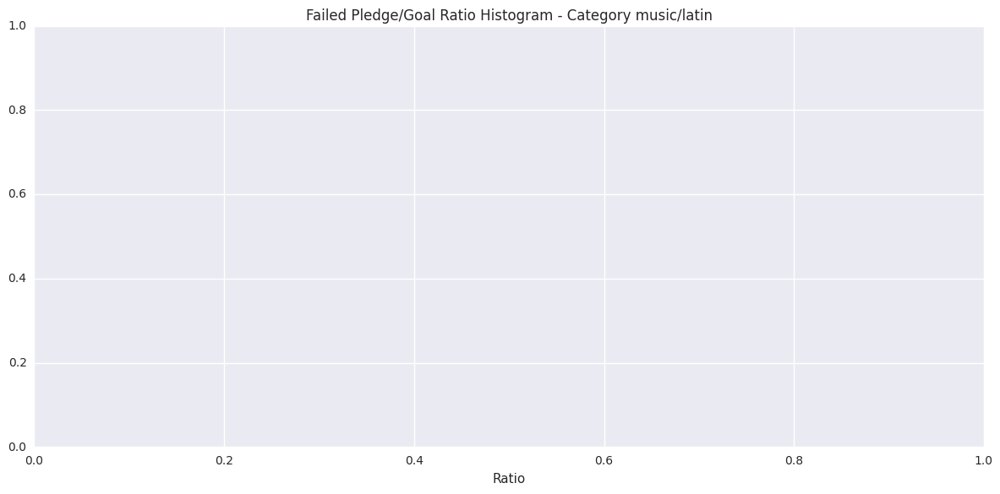

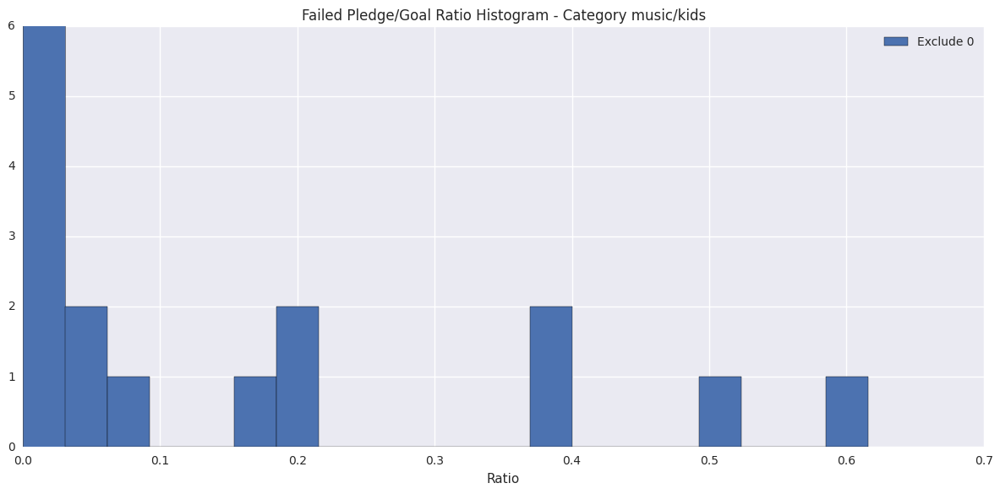

Category: dance/performances has error.
zero-size array to reduction operation minimum which has no identity


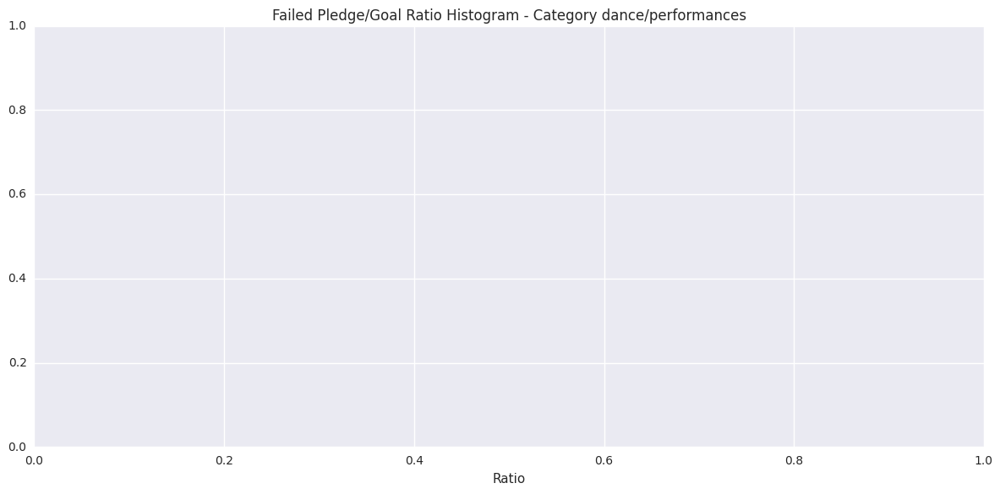

Category: music/indie rock has error.
zero-size array to reduction operation minimum which has no identity


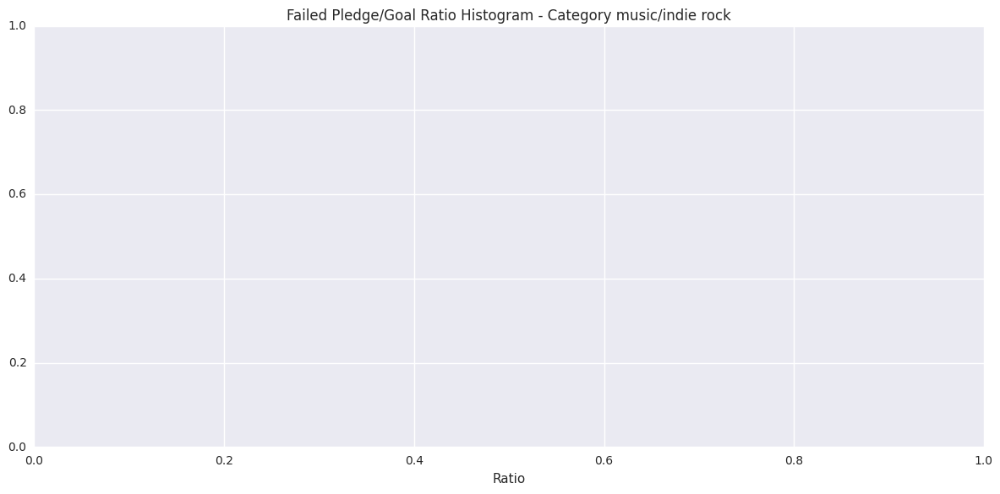

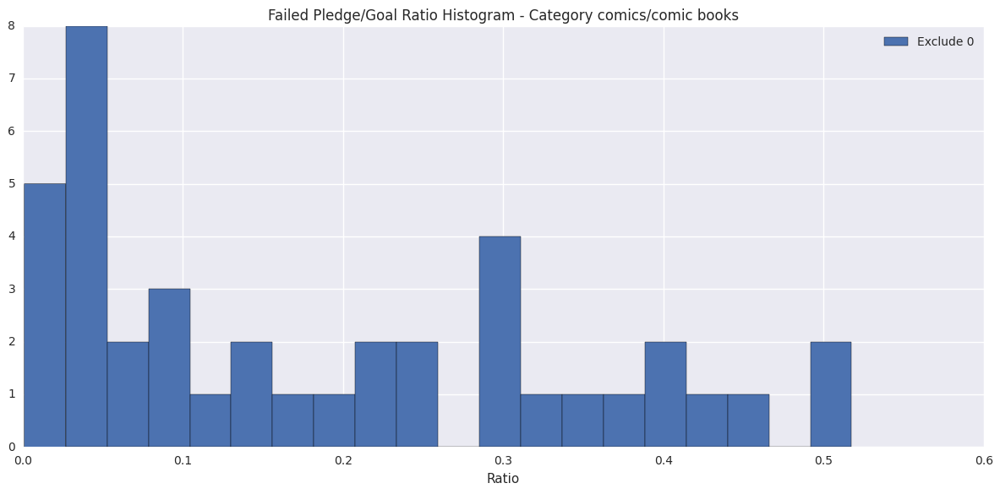

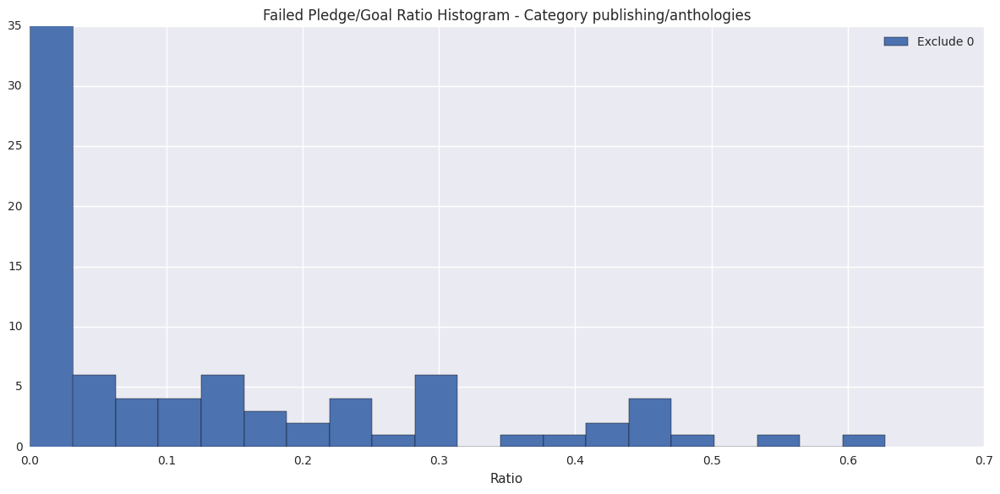

In [73]:
_ = map(p_g_ratio_plot, data['cat'].unique())

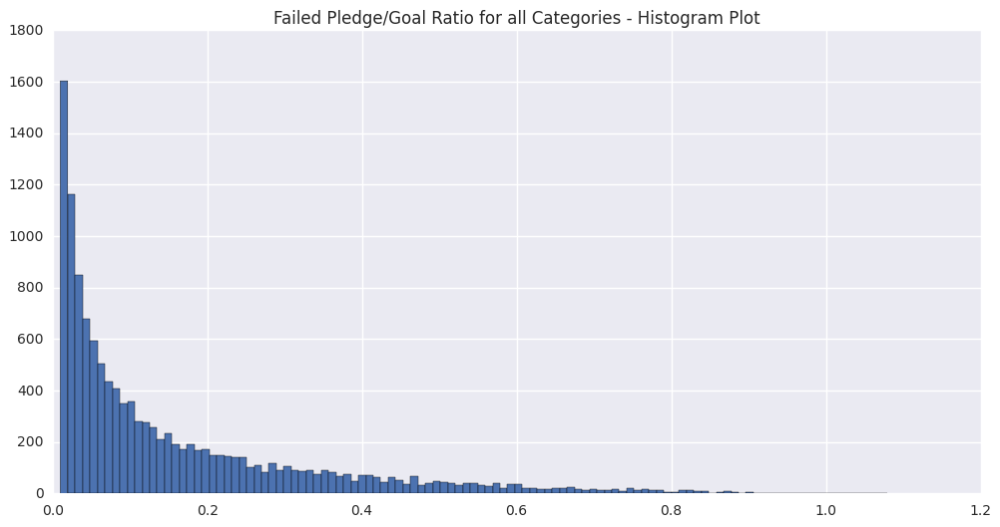

In [74]:
_ = plt.hist(goal_pledged_ratio[goal_pledged_ratio > 0.01].values, 
             bins=np.int(np.sqrt(len(goal_pledged_ratio[goal_pledged_ratio > 0.01]))))
_ = plt.title('Failed Pledge/Goal Ratio for all Categories - Histogram Plot')

5123


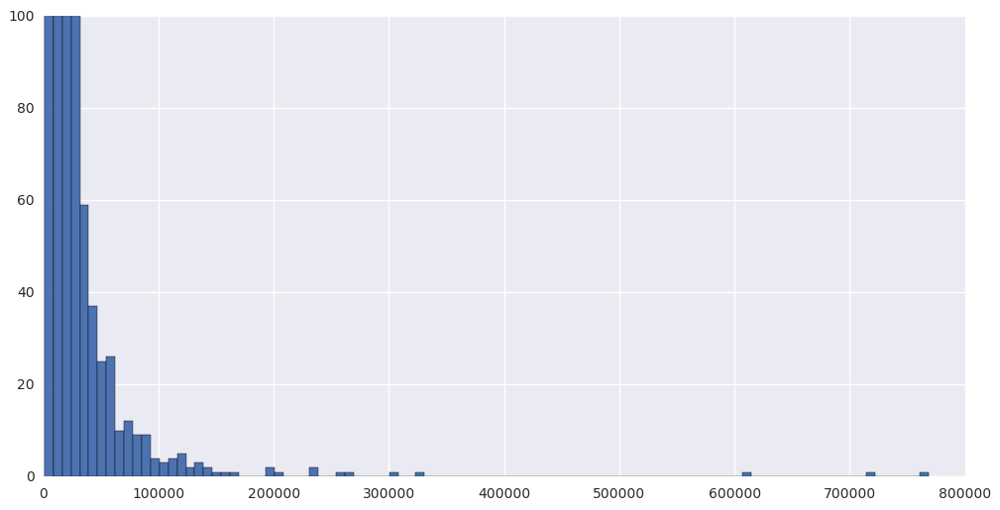

In [82]:
# Histogram of faild pledge > 1,000

print len(data[(data['state'] == 'failed') & (data['pledged'] > 1000.0)]['pledged'])
_ = plt.hist(data[(data['state'] == 'failed') & (data['pledged'] > 1000.0)]['pledged'].values, 100)
# _ = plt.xlim(0, 100000)
_ = plt.ylim(0, 100)

['failed' 'canceled' 'successful' 'live' 'suspended']


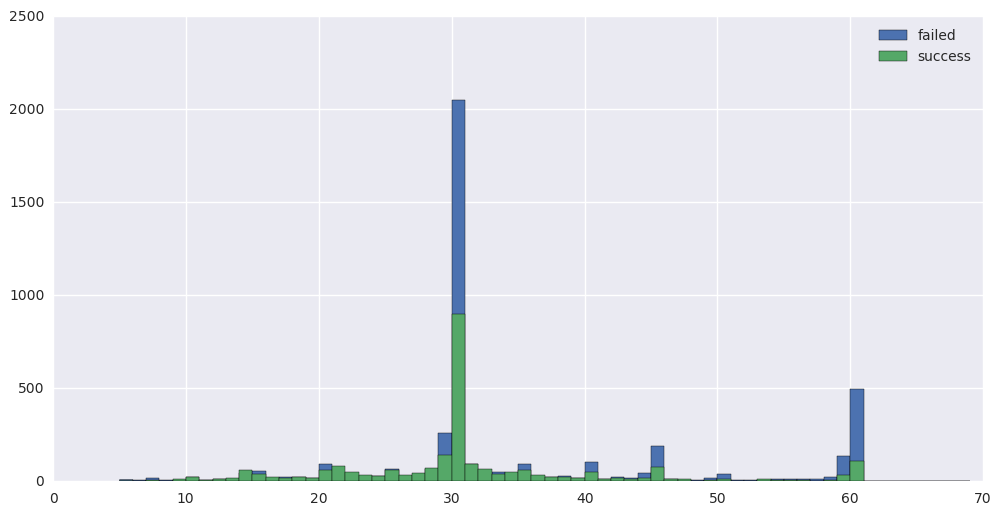

In [133]:
data['duration'] = (data['deadline'] - data['launched_at']) / 86400
print data['state'].unique()
_ = plt.hist(data[data['state'] == 'failed']['duration'].values, bins=range(5, 70, 1), label='failed')
_ = plt.hist(data[data['state'] == 'successful']['duration'].values, bins=range(5, 70, 1), label='success')
_ = plt.legend()

# #TODO: Failed Backers Count

In [134]:
print data[(data['state'] == 'failed')]['backers_count'].value_counts()

0       1198
1        847
2        525
3        313
4        232
5        159
6        131
7         97
8         89
10        74
9         67
12        55
11        53
14        49
13        48
17        35
16        29
20        28
15        25
21        21
18        21
23        20
19        19
24        18
25        17
26        17
31        16
27        16
22        14
29        13
        ... 
174        1
146        1
109        1
121        1
125        1
129        1
141        1
157        1
165        1
181        1
197        1
201        1
229        1
237        1
253        1
265        1
371        1
401        1
441        1
505        1
565        1
621        1
973        1
1009       1
66         1
74         1
86         1
106        1
122        1
369        1
Name: backers_count, dtype: int64


860


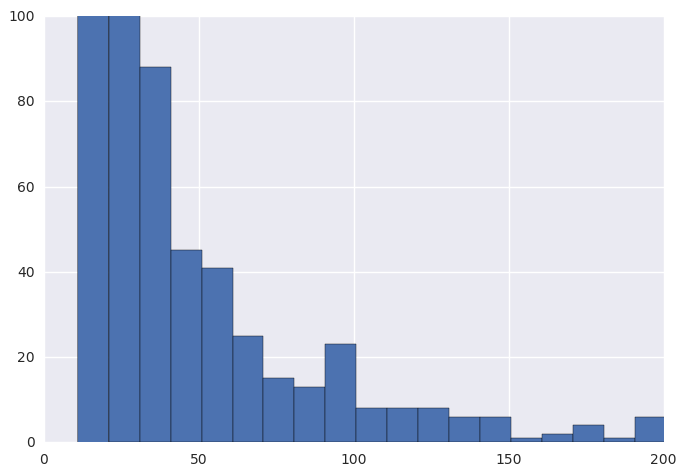

In [104]:
# Histogram of faild backers_count > 10

print len(data[(data['state'] == 'failed') & (data['backers_count'] > 10)]['backers_count'])
_ = plt.hist(data[(data['state'] == 'failed') & (data['backers_count'] > 10)]['backers_count'].values, 100)
_ = plt.xlim(0, 200)
_ = plt.ylim(0, 100)

# Some Old Stuff for Data Incubator Below

Continuous: 9 features
                      goal   pledged  deadline  state_changed_at  created_at  \
goal              1.000000  0.009806  0.005618          0.005342    0.005488   
pledged           0.009806  1.000000 -0.003590         -0.002863   -0.013569   
deadline          0.005618 -0.003590  1.000000          0.999747    0.967684   
state_changed_at  0.005342 -0.002863  0.999747          1.000000    0.967484   
created_at        0.005488 -0.013569  0.967684          0.967484    1.000000   
launched_at       0.004498 -0.004466  0.999603          0.999464    0.968248   
backers_count     0.002969  0.708985 -0.019108         -0.018488   -0.026842   
static_usd_rate  -0.031035 -0.043331 -0.073700         -0.073022   -0.068048   
usd_pledged       0.008752  0.954907 -0.011796         -0.011032   -0.021485   

                  launched_at  backers_count  static_usd_rate  usd_pledged  
goal                 0.004498       0.002969        -0.031035     0.008752  
pledged             -0

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


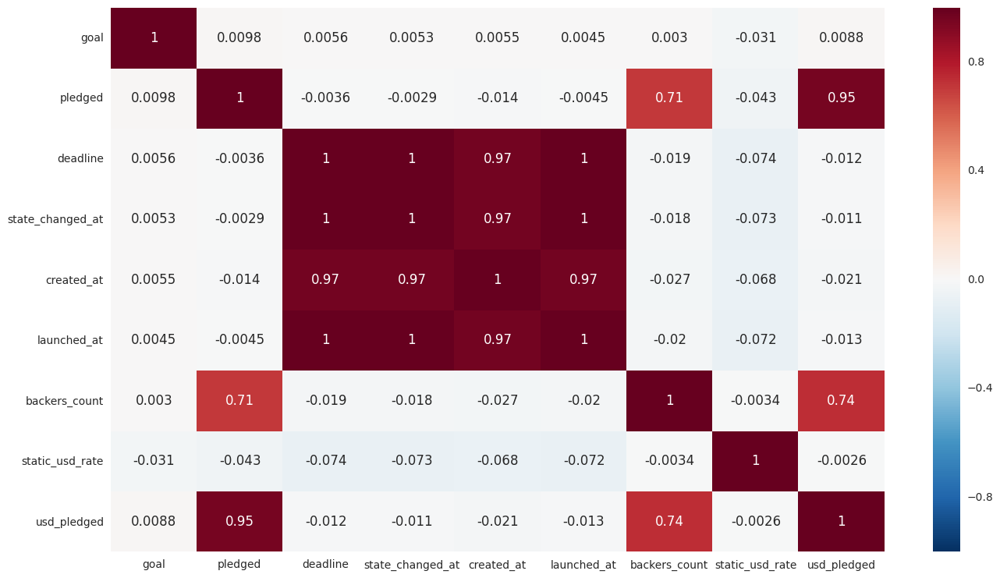

In [4]:
num_features = [num for num in list(data.select_dtypes(
                 include=['float64', 'int64']).columns) if num not in ['id']]
print "Continuous: {} features".format(len(num_features))

print data[num_features].corr(method='pearson')
plt.subplots(figsize=(16,9))
correlation_mat = data[num_features].corr(method='pearson')
sns.heatmap(correlation_mat, annot=True)

In [5]:
date_list = ['deadline', 'state_changed_at', 'created_at', 'launched_at']
for date in date_list:
    num_features.remove(date)
print num_features

['goal', 'pledged', 'backers_count', 'static_usd_rate', 'usd_pledged']


array([[<matplotlib.axes.AxesSubplot object at 0x1099875d0>,
        <matplotlib.axes.AxesSubplot object at 0x10aebaa50>]], dtype=object)

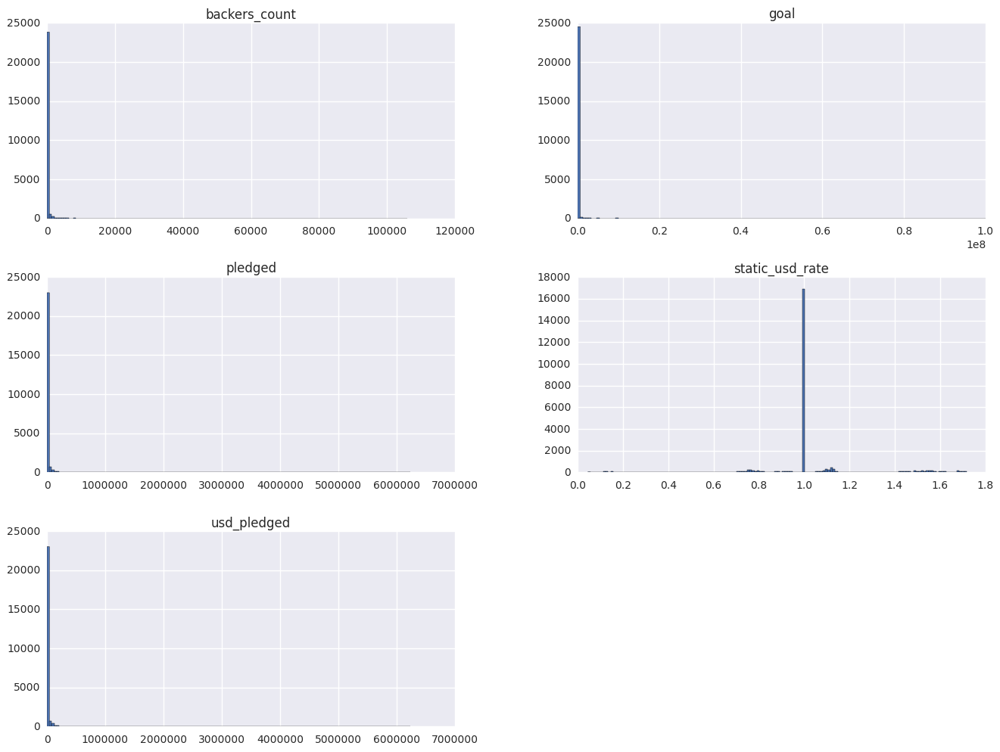

In [6]:
data[num_features].hist(bins=150, figsize=(16,12))

In [7]:
print data['backers_count'].count()
temp_backers = (data['backers_count']!= 0) & (data['backers_count']!= 1)
temp_backers = data[temp_backers]['backers_count']
print temp_backers.count()
# print temp_backers.value_counts()

24825
18252


In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
ax1.hist((temp_backers), bins=50)
ax1.set_title('Backers Count')
ax1.axis(ymax=40)

ax2.hist(np.log(data['goal']), bins=50)
ax2.set_title("Goal Histogram")

ax3.hist(data['pledged'], bins=50)
ax3.axis(ymax=100)
ax3.set_title("Pledged Histogram")

ax4.hist(data['static_usd_rate'], bins=50)
ax4.axis(ymax=100)
ax4.set_title('Static USD Rate Histogram')

print data['static_usd_rate'].describe()

KeyboardInterrupt: 

In [8]:
print data['state'].unique()
successful = data[data['state'] == 'successful']
failed = data[data['state'] == 'failed']
canceled = data[data['state'] == 'canceled']
live = data[data['state'] == 'live']

['successful' 'failed' 'canceled' 'suspended' 'live']


 Failed: 
count    1.504400e+04
mean     1.070785e+05
std      1.483732e+06
min      1.000000e+00
25%      5.000000e+03
50%      1.500000e+04
75%      5.000000e+04
max      1.000000e+08
Name: failed_goal, dtype: float64 
median:  15000.0

Successful: 
count       6573.000000
mean       19474.981188
std        43440.593408
min            1.000000
25%         1500.000000
50%         5000.000000
75%        20000.000000
max      1000000.000000
Name: successful_goal, dtype: float64 
median:  5000.0


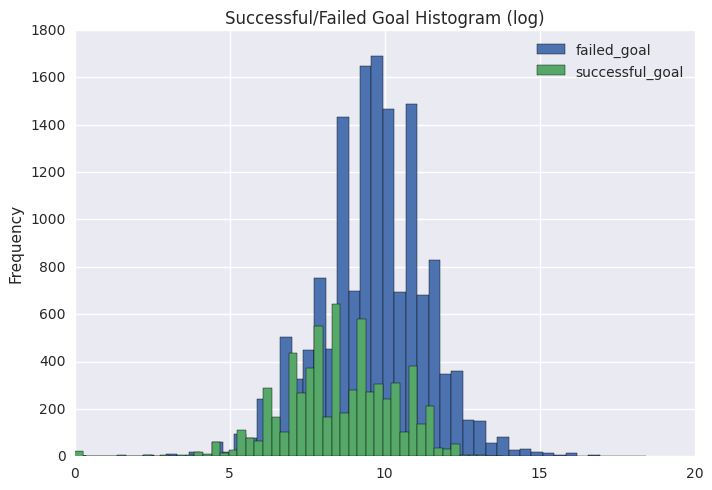

In [12]:
# fig, (ax5, ax6) = plt.subplots(1, 2, figsize=(16, 8))
# ax5.hist(np.log(successful['goal']), bins=50)
# ax5.set_title('Successful Goal Histogram (log)')


failed.rename(columns={'goal': 'failed_goal'}, inplace=True)
ax6 = np.log(failed['failed_goal']).plot(kind='hist', bins=50, legend=True)
ax6.set_title('Failed Goal Histogram (log)')


successful.rename(columns={'goal': 'successful_goal'}, inplace=True)
ax7 = np.log(successful['successful_goal']).plot(kind='hist', bins=50, legend=True)
ax7.set_title('Successful/Failed Goal Histogram (log)')

print 'Failed: \n', failed['failed_goal'].describe(), '\nmedian: ', failed['failed_goal'].median()
print '\nSuccessful: \n', successful['successful_goal'].describe(), '\nmedian: ', successful['successful_goal'].median()

# Looks like failed ones usually aimed too high.

In [5]:
# Word count for title, compare successful and failed.

success_title_len = [len(title) for title in successful['name']]
failed_title_len = [len(title) for title in failed['name']]
print 'Success: ', np.mean(success_title_len), ', ', np.median(success_title_len), ', ', np.std(success_title_len)
print 'Failed: ', np.mean(failed_title_len), ', ', np.median(failed_title_len), ', ', np.std(failed_title_len)

Success:  38.7270780273 ,  40.0 ,  15.3863499434
Failed:  34.5581715944 ,  34.0 ,  16.5264799933


In [6]:
# Word count for blurb, compare successful and failed.

success_blurb_len = [len(blurb) for blurb in successful['blurb']]
failed_blurb_len = [len(blurb) for blurb in failed['blurb']]
print 'Success: ', np.mean(success_blurb_len), ', ', np.median(success_blurb_len), ', ', np.std(success_blurb_len)
print 'Failed: ', np.mean(failed_blurb_len), ', ', np.median(failed_blurb_len), ', ', np.std(failed_blurb_len)

Success:  117.136200509 ,  126.0 ,  22.1302665773
Failed:  116.128024669 ,  126.0 ,  24.4227974376


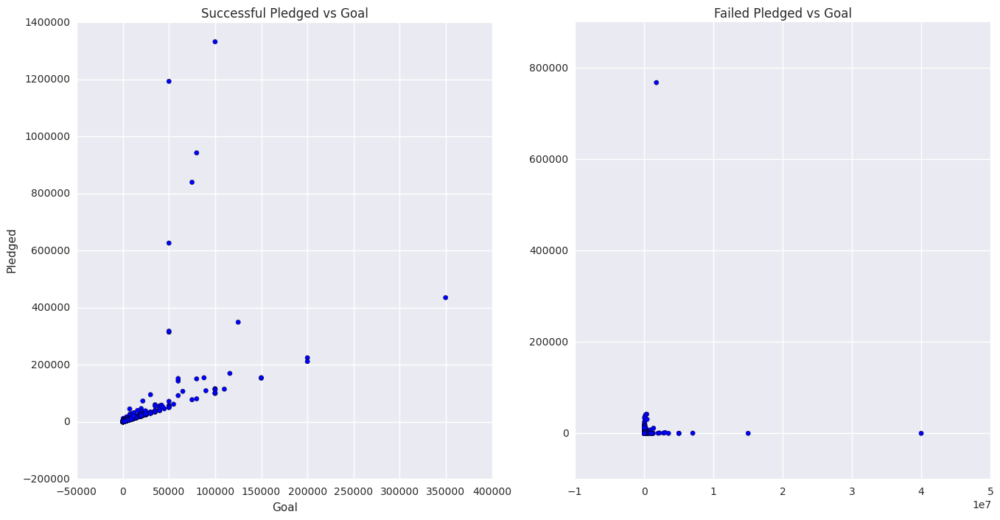

In [366]:
fig, ((ax9, ax10)) = plt.subplots(1, 2, figsize=(16, 8))
ax9.scatter(x=successful['goal'], y=successful['pledged'])
ax9.set_title('Successful: Pledged vs Goal')
ax9.set_ylabel('Pledged')
ax9.set_xlabel('Goal')

ax10.scatter(x=failed['goal'], y=failed['pledged'])
ax10.set_title('Failed: Pledged vs Goal')

In [108]:
print data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4150 entries, 0 to 4149
Data columns (total 28 columns):
id                        4150 non-null int64
photo                     4150 non-null object
name                      4150 non-null object
blurb                     4149 non-null object
goal                      4150 non-null float64
pledged                   4150 non-null float64
state                     4150 non-null object
slug                      4150 non-null object
disable_communication     4150 non-null bool
country                   4150 non-null object
currency                  4150 non-null object
currency_symbol           4150 non-null object
currency_trailing_code    4150 non-null bool
deadline                  4150 non-null int64
state_changed_at          4150 non-null int64
created_at                4150 non-null int64
launched_at               4150 non-null int64
staff_pick                4150 non-null bool
backers_count             4150 non-null int64
static_usd

In [107]:
# Drop useless columns.
data = data.drop(['friends', 'is_starred', 'is_backing', 'permissions'], 1)

In [82]:
# Visualize the unique values in categorical features
for item in data.dtypes[data.dtypes == 'object'].index:
    print item, ':', len(data[item].unique())
for item in data.dtypes[data.dtypes == 'object'].index:
    if len(data[item].unique())<=20:
        print item, ': ', data[item].unique()
    elif len(data[item].unique())==42:
        print item

photo : 4150
name : 4141
blurb : 4125
state : 5
slug : 4150
country : 20
currency : 12
currency_symbol : 5
creator : 4133
location : 1390
category : 10
profile : 4150
urls : 4150
source_url : 42
category_extracted : 10
state :  ['successful' 'failed' 'canceled' 'suspended' 'live']
country :  ['GB' 'US' 'DE' 'CA' 'AU' 'NL' 'NO' 'IE' 'NZ' 'DK' 'FR' 'ES' 'CH' 'IT' 'SE'
 'AT' 'MX' 'SG' 'BE' 'LU']
currency :  ['GBP' 'USD' 'EUR' 'CAD' 'AUD' 'NOK' 'NZD' 'DKK' 'CHF' 'SEK' 'MXN' 'SGD']
currency_symbol :  ['\xc2\xa3' '$' '\xe2\x82\xac' 'kr' 'Fr ']
category :  ['theater' 'technology' 'publishing' 'music' 'journalism' 'games'
 'film_video' 'fashion' 'art' 'photography']
source_url
category_extracted :  ['theater' 'technology' 'publishing' 'music' 'journalism' 'games'
 'film_video' 'fashion' 'art' 'photography']


In [130]:
# Remake the feature of category, because it was all urls
import re
category_all = data.iloc[:]['category']
category_extracted = []

for category in category_all:
    temp = re.findall('{"urls":{"web":{"discover":"http://www.kickstarter.com/discover/categories/(.*?)/',category)
    if temp[0] == 'film%20&%20video':
        temp[0] = 'film_video'
    category_extracted.append(temp[0])

df_category_extracted = pd.DataFrame(data={'category_extracted': category_extracted})
data['category'] = category_extracted
print data['category'].unique()

['theater' 'technology' 'publishing' 'music' 'journalism' 'games'
 'film_video' 'fashion' 'art' 'photography']


###### [Theater, Technology, Publishing, Music, Journalism, Games, Film & Video, Fashion, Art, Photography]

###### These categories are not included in our data: [Design, Food, Comics, Dance, Craft]

In [135]:
for column in data.columns:
    print column, ':', data.iloc[1000][column]

id : 469242312
photo : {"small":"https://ksr-ugc.imgix.net/assets/012/440/803/6ffe562af4fa6d305672c29329e42a4e_original.jpg?w=160&h=90&fit=fill&bg=FFFFFF&v=1463761305&auto=format&q=92&s=06c3787e4b297fec4993ae55bca0f069","thumb":"https://ksr-ugc.imgix.net/assets/012/440/803/6ffe562af4fa6d305672c29329e42a4e_original.jpg?w=40&h=22&fit=fill&bg=FFFFFF&v=1463761305&auto=format&q=92&s=d9b3fb4329824e5e73070292bcec14b5","1024x576":"https://ksr-ugc.imgix.net/assets/012/440/803/6ffe562af4fa6d305672c29329e42a4e_original.jpg?w=1024&h=576&fit=fill&bg=FFFFFF&v=1463761305&auto=format&q=92&s=541b00cc5eece3d6064d63524174607b","med":"https://ksr-ugc.imgix.net/assets/012/440/803/6ffe562af4fa6d305672c29329e42a4e_original.jpg?w=266&h=150&fit=fill&bg=FFFFFF&v=1463761305&auto=format&q=92&s=93b5eb2188664732ec8c8e3a1d2daef9","key":"assets/012/440/803/6ffe562af4fa6d305672c29329e42a4e_original.jpg","1536x864":"https://ksr-ugc.imgix.net/assets/012/440/803/6ffe562af4fa6d305672c29329e42a4e_original.jpg?w=1536&h=864&